In [24]:
import xarray as xr
import os
from os.path import join
import pandas as pd
import matplotlib.pyplot as plt
crops = [ 'mai','swh','wwh', 'soy']
crop=crops[0]
ssps=['ssp126','ssp585']
ssp=ssps[0]
fp=r'D:\AAUDE\paper\paper8\data\resu'
area=xr.open_dataset(join(r'D:\AAUDE\paper\paper8\data\area',f'spam2020_v1r0_global_H_{crop}_R.nc'))['__xarray_dataarray_variable__']
yied=xr.open_dataset(join(fp,f'yield_{crop}_{ssp}.nc'))[f'yield-{crop}-noirr']
evp=xr.open_dataset(join(fp,f'evapcum_{crop}_{ssp}.nc'))[f'evapcum-{crop}-noirr']
ssi_mai_ssp585=xr.open_dataset(r'D:\AAUDE\paper\paper8\data\resu\ssi_mai_ssp585.nc').__xarray_dataarray_variable__
ssi_mai_ssp126=xr.open_dataset(r'D:\AAUDE\paper\paper8\data\resu\ssi_mai_ssp126.nc').__xarray_dataarray_variable__
yied=yied.transpose('time', 'lat', 'lon')
area=xr.open_dataset(join(r'D:\AAUDE\paper\paper8\data\area',f'spam2020_v1r0_global_H_{crop}_R.nc'))['__xarray_dataarray_variable__']
evp=evp.transpose('time', 'lat', 'lon')

In [5]:
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import cftime

def anao(data):
    return (data - data.mean()) / np.std(data)

# 读取面积数据（你需自行替换）
# area = xr.open_dataarray('E:/path/to/area_file.nc')

# 情景配置
scenarios = {
    'historical': {
        'path': r'D:\AAUDE\paper\paper8\data\ssi',
        'pattern': 'SSI_mai_scale2_*_historical*.nc',
        'start_year': 1850,
        'end_year': 2014,
        'color': '#7F7F7F'
    },
    'ssp126': {
        'path': r'D:\AAUDE\paper\paper8\data\ssi',
        'pattern': 'SSI_mai_scale2_*_ssp126*.nc',
        'start_year': 2015,
        'end_year': 2100,
        'color': '#5AB4AF'
    },
    'ssp585': {
        'path': r'D:\AAUDE\paper\paper8\data\ssi',
        'pattern': 'SSI_mai_scale2_*_ssp585*.nc',
        'start_year': 2015,
        'end_year': 2100,
        'color': '#F5E16E'
    }
}

# 用于保存全部数据
all_data = []

for scen, cfg in scenarios.items():
    files = list(Path(cfg['path']).glob(cfg['pattern']))
    
    for file in files:
        model = file.name.split('_')[0]  # 从文件名中提取模型名
        
        # 使用decode_times=False先打开文件
        ds = xr.open_dataset(file, decode_times=False)
        
        # 检查时间变量和日历类型
        time_var = ds['time']
        if 'calendar' in time_var.attrs:
            calendar = time_var.attrs['calendar']
        else:
            calendar = 'standard'
        
        # 转换为cftime对象
        times = cftime.num2date(time_var[:], 
                               units=time_var.attrs['units'],
                               calendar=calendar)
        
        da = ds['ssi'] .where(area>0)  # 假设area已定义
        a = da.mean(dim=['lat', 'lon'])  # 月度序列
        
        # 创建包含年月信息的DataFrame
        df = pd.DataFrame({
            'model': model,
            'scenario': scen,
            'year': [t.year for t in times],
            'month': [t.month for t in times],
            'day': [t.day for t in times],
            'cftime': times,
            'value': a.values
        })
        
        # 添加一个标准时间列（近似转换）
        df['approx_datetime'] = pd.to_datetime([f"{y}-{m}-{d}" 
                                             for y, m, d in zip(df['year'], df['month'], df['day'])],
                                            errors='coerce')
        
        all_data.append(df)

# 合并所有情景数据
result_df = pd.concat(all_data, ignore_index=True)

# 保存为 CSV
output_path = r'D:\AAUDE\paper\paper8\data\resu\mai_ssi_scale2_monthly_timeseries.csv'
result_df.to_csv(output_path, index=False)
print(f'保存成功：{output_path}')

保存成功：D:\AAUDE\paper\paper8\data\resu\mai_ssi_scale2_monthly_timeseries.csv


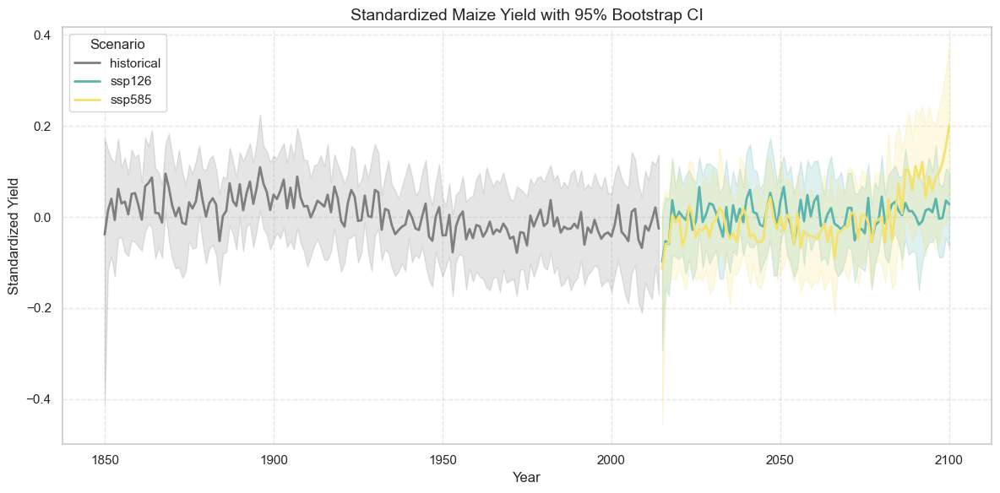

In [9]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 读取之前保存的标准化产量数据 CSV
# output_path = r'E:\isimip3b_agricultal\yield_standardized_timeseries.csv'
df = pd.read_csv(output_path)

# 设置 seaborn 样式和调色板
sns.set(style='whitegrid')

palette = {
    'historical': '#7F7F7F',
    'ssp126': '#5AB4AF',
    'ssp585': '#F5E16E'
}

plt.figure(figsize=(12, 6))

# 画图，seaborn 默认带 95% bootstrap CI，estimator='median' 是中位数
sns.lineplot(
    data=df,
    x='year',
    y='value',
    hue='scenario',
    estimator='median',
    errorbar=('pi', 50),            # 默认值，可写可不写
    palette=palette,
    linewidth=2
)

plt.xlabel('Year', fontsize=12)
plt.ylabel('Standardized Yield', fontsize=12)
plt.title('Standardized Maize Yield with 95% Bootstrap CI', fontsize=14)
plt.legend(title='Scenario')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


In [2]:
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from os.path import join
crops = [ 'mai','swh','wwh', 'soy']
crop=crops[0]
area=xr.open_dataset(join(r'D:\AAUDE\paper\paper8\data\area',f'spam2020_v1r0_global_H_{crop}_R.nc'))['__xarray_dataarray_variable__']
def anao(data):
    return (data - data.mean()) / np.std(data)

# 读取面积数据（你需自行替换）
# area = xr.open_dataarray('E:/path/to/area_file.nc')

# 情景配置
scenarios = {
    'historical': {
        'path': r'D:\AAUDE\paper\paper8\data\ssi',
        'pattern': 'SSI_mai_scale2_*_historical*.nc',
        'years': np.arange(1850, 2015),
        'color': '#7F7F7F'
    },
    'ssp126': {
        'path': r'D:\AAUDE\paper\paper8\data\ssi',
        'pattern': 'SSI_mai_scale2_*_ssp126*.nc',
        'years': np.arange(2015, 2101),
        'color': '#5AB4AF'
    },
    'ssp585': {
        'path': r'D:\AAUDE\paper\paper8\data\ssi',
        'pattern': 'SSI_mai_scale2_*_ssp585*.nc',
        'years': np.arange(2015, 2101),
        'color': '#F5E16E'
    }
}

# 用于保存全部数据
all_data = []

for scen, cfg in scenarios.items():
    files = list(Path(cfg['path']).glob(cfg['pattern']))
    
    for file in files:
        model = file.name.split('_')[0]  # 从文件名中提取模型名
        ds = xr.open_dataset(file, decode_times=False)
        da = ds['ssi'].where(area>0)
        a = da.mean(dim=['lat', 'lon'])  # 年度序列
        # norm = anao(a)

        # 保存为 DataFrame
        df = pd.DataFrame({
            'model': model,
            'scenario': scen,
            'year': cfg['years'],
            'value': a.values
        })
        all_data.append(df)

# 合并所有情景数据
result_df = pd.concat(all_data, ignore_index=True)

# 保存为 CSV
output_path = rf'D:\AAUDE\paper\paper8\data\resu\{crop}_ssi_scale2_timeseries.csv'
result_df.to_csv(output_path, index=False)
print(f'保存成功：{output_path}')

ValueError: All arrays must be of the same length

C:\Users\Administrator\AppData\Local\Temp\ipykernel_12516\2603669779.py:21: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 95)` for the same effect.

  sns.lineplot(


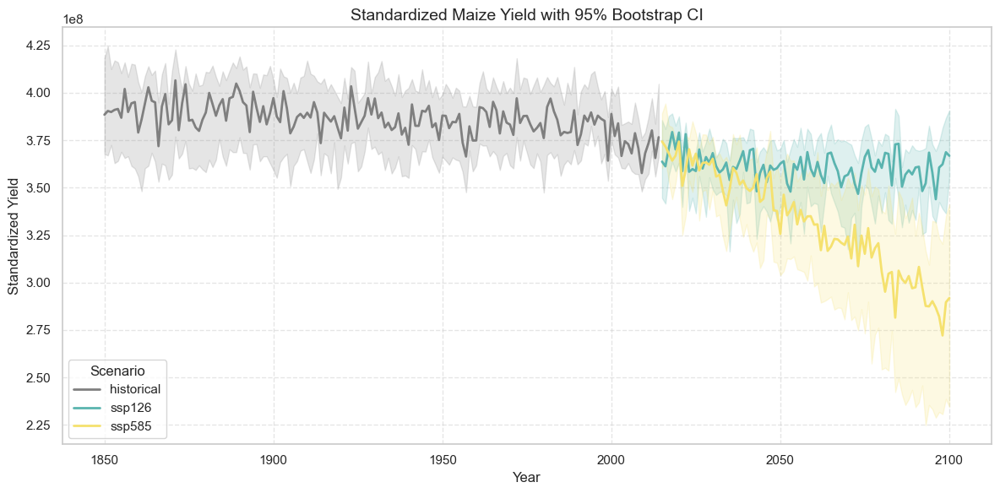

In [38]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 读取之前保存的标准化产量数据 CSV
# output_path = r'E:\isimip3b_agricultal\yield_standardized_timeseries.csv'
df = pd.read_csv(output_path)

# 设置 seaborn 样式和调色板
sns.set(style='whitegrid')

palette = {
    'historical': '#7F7F7F',
    'ssp126': '#5AB4AF',
    'ssp585': '#F5E16E'
}

plt.figure(figsize=(12, 6))

# 画图，seaborn 默认带 95% bootstrap CI，estimator='median' 是中位数
sns.lineplot(
    data=df,
    x='year',
    y='value',
    hue='scenario',
    estimator='median',
    ci=95,            # 默认值，可写可不写
    palette=palette,
    linewidth=2
)

plt.xlabel('Year', fontsize=12)
plt.ylabel('Standardized Yield', fontsize=12)
plt.title('Standardized Maize Yield with 95% Bootstrap CI', fontsize=14)
plt.legend(title='Scenario')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


<Axes: xlabel='year', ylabel='value'>

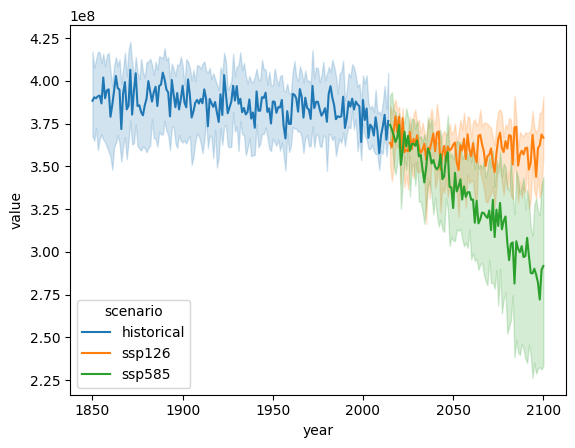

In [30]:
import seaborn as sns
df = pd.read_csv(output_path)
sns.lineplot(data=df, x='year', y='value', hue='scenario', estimator='median')


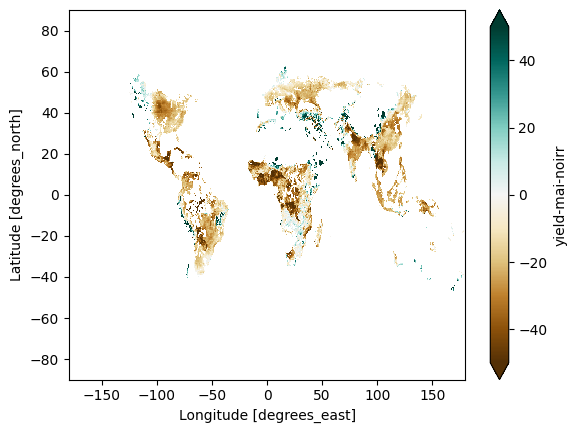

In [17]:
import xarray as xr
yied_his=xr.open_dataset(r'D:\AAUDE\paper\paper8\data\resu\yield_mai_historical_median.nc')['yield-mai-noirr']
yied_585=xr.open_dataset(r'D:\AAUDE\paper\paper8\data\resu\yield_mai_ssp585_median.nc')['yield-mai-noirr']
((yied_585[-30:,:,:].mean(dim='time')-yied_his[-30:,:,:].mean(dim='time'))/yied_his[-30:,:,:].mean(dim='time')*100).where(area>0).plot(vmin=-50,vmax=50,cmap='BrBG')

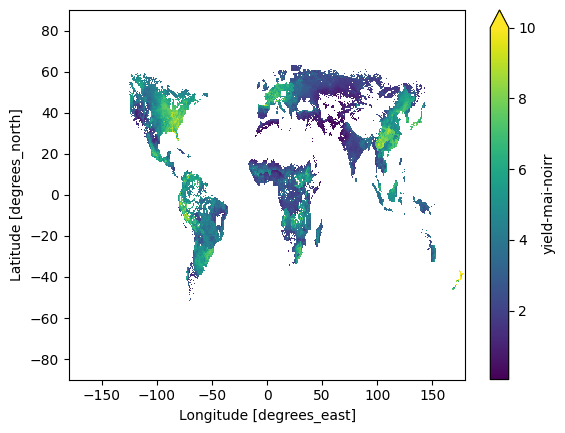

In [26]:
(yied[-30:]).mean(dim='time').plot(vmax=10)

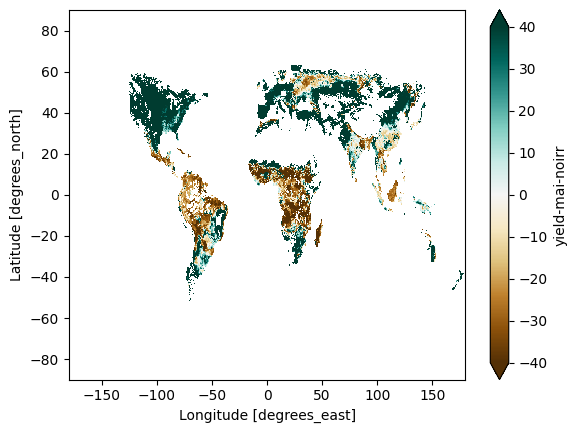

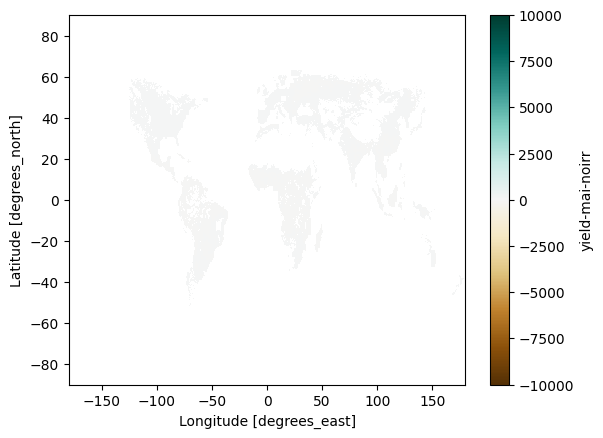

In [22]:
s2=xr.open_dataset(str(file),decode_times=False)['yield-mai-noirr']
(((yied[-30:]).mean(dim='time')-s2[-40:].mean(dim='time'))/s2[-40:].mean(dim='time')*100).plot(vmin=-40,vmax=40,cmap='BrBG')
plt.show()
(((yied[-30:]).mean(dim='time')-s2[-40:].mean(dim='time'))).plot(vmin=-10000,vmax=10000,cmap='BrBG')


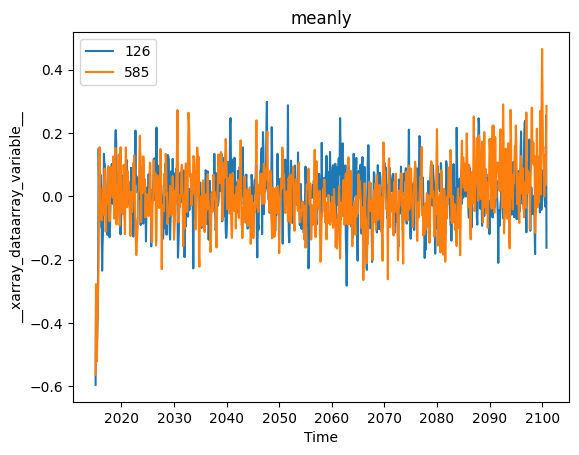

In [8]:
ssi_mai_ssp126.mean(dim=['lat','lon']).plot(label='126')
ssi_mai_ssp585.mean(dim=['lat','lon']).plot(label='585')
plt.title('meanly')
plt.legend()

In [30]:
import numpy as np
from scipy.stats import kendalltau
import xarray as xr

def sen_slope(y):
    """计算 Sen's Slope（自动跳过NaN）"""
    y_clean = y[~np.isnan(y)]  # 移除NaN
    n = len(y_clean)
    if n < 2:  # 至少需要2个有效值
        return np.nan
    slopes = []
    for i in range(n):
        for j in range(i+1, n):
            slope = (y_clean[j] - y_clean[i]) / (j - i)  # 时间差=1
            slopes.append(slope)
    return np.median(slopes)

def mk_test(y):
    """Mann-Kendall检验（自动跳过NaN）"""
    y_clean = y[~np.isnan(y)]
    if len(y_clean) < 2:
        return np.nan
    tau, p_value = kendalltau(np.arange(len(y_clean)), y_clean)
    return p_value

def calculate_trend_chunk(y):
    """对单个网格点返回 (slope, p-value)"""
    return sen_slope(y), mk_test(y)

In [48]:
from dask.distributed import Client
import xarray as xr
import dask.array as da
import numpy as np
from scipy.stats import kendalltau

# 启动 Dask 客户端（自动处理端口冲突）
client = Client()  

# 加载数据（确保使用正确的变量名）
ds = xr.open_dataset(r'D:\AAUDE\paper\paper8\data\resu\ssi_mai_ssp585.nc', chunks={'lat': 50, 'lon': 50})
ssi_mai_ssp585 = ds['__xarray_dataarray_variable__']  # 替换为实际的变量名

# 定义 Sen's Slope 函数
def sen_slope(y):
    """计算 Sen's Slope（自动跳过NaN）"""
    y_clean = y[~np.isnan(y)]
    n = len(y_clean)
    if n < 2:  # 至少需要2个有效值
        return np.nan
    slopes = []
    for i in range(n):
        for j in range(i+1, n):
            slope = (y_clean[j] - y_clean[i]) / (j - i)
            slopes.append(slope)
    return np.median(slopes)

# 定义 Mann-Kendall 检验函数
def mk_test(y):
    """Mann-Kendall检验（自动跳过NaN）"""
    y_clean = y[~np.isnan(y)]
    if len(y_clean) < 2:
        return np.nan
    _, p_value = kendalltau(np.arange(len(y_clean)), y_clean)
    return p_value

# 定义趋势计算函数
def calculate_trend_chunk(y):
    """输入: 时间序列 (1D数组); 输出: (slope, p-value)"""
    slope = sen_slope(y)  # 计算斜率
    p_value = mk_test(y)  # 计算p值
    return slope, p_value  # 返回两个值

# 并行计算所有网格点
results = xr.apply_ufunc(
    calculate_trend_chunk,
    ssi_mai_ssp585,
    input_core_dims=[['time']],
    output_core_dims=[[], []],  # 输出两个标量
    vectorize=True,
    dask='parallelized',
    output_dtypes=[float, float]
)

# 分离结果
slope_map = results[0].rename('sen_slope')
p_map = results[1].rename('p_value')

# 触发计算（使用 Dask）
slope_map_585, p_map_585 = da.compute(slope_map, p_map)

C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\distributed\node.py:187: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 62817 instead
  warnings.warn(
C:\Program Files\Python311\Lib\contextlib.py:144: UserWarning: Creating scratch directories is taking a surprisingly long time. (1.69s) This is often due to running workers on a network file system. Consider specifying a local-directory to point workers to write scratch data to a local disk.
  next(self.gen)


In [91]:
from dask.distributed import Client
import xarray as xr
import dask.array as da
import numpy as np
from scipy.stats import kendalltau

# 启动 Dask 客户端（自动处理端口冲突）
client = Client()  

# 加载数据（确保使用正确的变量名）
ds = xr.open_dataset(r'D:\AAUDE\paper\paper8\data\resu\ssi_mai_ssp585.nc', chunks={'lat': 50, 'lon': 50})
ssi_mai_ssp585 = ds['__xarray_dataarray_variable__']  # 替换为实际的变量名

# 定义 Sen's Slope 函数
def sen_slope(y):
    """计算 Sen's Slope（自动跳过NaN）"""
    y_clean = y[~np.isnan(y)]
    n = len(y_clean)
    if n < 2:  # 至少需要2个有效值
        return np.nan
    slopes = []
    for i in range(n):
        for j in range(i+1, n):
            slope = (y_clean[j] - y_clean[i]) / (j - i)
            slopes.append(slope)
    return np.median(slopes)

# 定义 Mann-Kendall 检验函数
def mk_test(y):
    """Mann-Kendall检验（自动跳过NaN）"""
    y_clean = y[~np.isnan(y)]
    if len(y_clean) < 2:
        return np.nan
    _, p_value = kendalltau(np.arange(len(y_clean)), y_clean)
    return p_value

# 定义趋势计算函数
def calculate_trend_chunk(y):
    """输入: 时间序列 (1D数组); 输出: (slope, p-value)"""
    slope = sen_slope(y)  # 计算斜率
    p_value = mk_test(y)  # 计算p值
    return slope, p_value  # 返回两个值

# 并行计算所有网格点
results = xr.apply_ufunc(
    calculate_trend_chunk,
    yied,
    input_core_dims=[['time']],
    output_core_dims=[[], []],  # 输出两个标量
    vectorize=True,
    dask='parallelized',
    output_dtypes=[float, float]
)

# 分离结果
slope_map = results[0].rename('sen_slope')
p_map = results[1].rename('p_value')

# 触发计算（使用 Dask）
slope_map_585, p_map_585 = da.compute(slope_map, p_map)

C:\Users\Administrator\AppData\Local\Temp\ipykernel_15172\3760377367.py:50: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
C:\Users\Administrator\AppData\Local\Temp\ipykernel_15172\3760377367.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


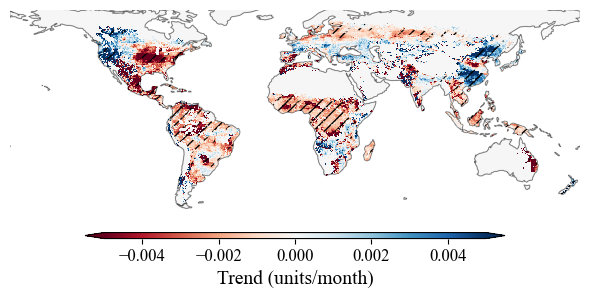

In [92]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np

def plot_trend(slope, p, title, save_path=None):
   
    # Set up figure and projection
    fig = plt.figure(figsize=(6, 3))
    plt.rcParams["font.family"] = "Times New Roman"
    
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent([-180, 180, -60, 70], crs=ccrs.PlateCarree())
    
    # Add map features
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5, alpha=0.5)
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray', alpha=0.2)
    ax.add_feature(cfeature.OCEAN, facecolor='white', alpha=0.5)
    
    # Plot trend data
    im = slope.plot(ax=ax, transform=ccrs.PlateCarree(),
                   cmap='RdBu', vmin=-0.005, vmax=0.005,
                   add_colorbar=False)
    
    # Add significance hatching
    sig = (p < 0.05) & (~np.isnan(slope))
    ax.contourf(sig.lon, sig.lat, sig, 
                colors='none', hatches=['///'], 
                levels=[0.5, 1.5], transform=ccrs.PlateCarree(),
                alpha=0)  # Makes the hatching more visible
    
    # Custom colorbar
    cbar_ax = fig.add_axes([0.15, 0.08, 0.7, 0.02])  # [left, bottom, width, height]
    cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal',
                       extend='both', pad=0.1)
    cbar.set_label('Trend (units/month)', fontsize=14)
    cbar.ax.tick_params(labelsize=12)
    
    # Gridlines and frame
    gl = ax.gridlines(draw_labels=False)
    gl.xlines = False
    gl.ylines = False
    # gl.xlabel_style = {'size': 10}
    # gl.ylabel_style = {'size': 10}
    
    # Remove frame
    ax.spines['geo'].set_visible(False)
    
    # Adjust layout and save/show
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.tight_layout()
    plt.show()

# Example usage:
plot_trend(slope_map_585, p_map_585, "SSP585 trends (p < 0.05)", 
          save_path=r'D:\AAUDE\paper\paper8\fig\yied_mai_585.png')

C:\Users\Administrator\AppData\Local\Temp\ipykernel_2580\3050520735.py:62: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
C:\Users\Administrator\AppData\Local\Temp\ipykernel_2580\3050520735.py:65: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


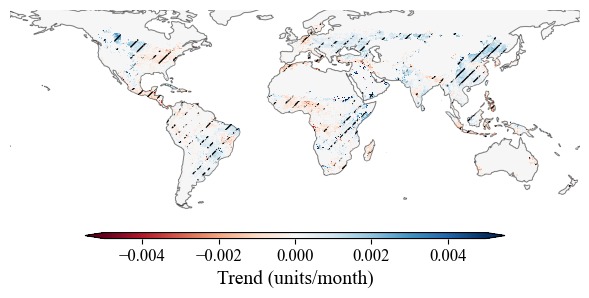

In [65]:
plot_trend(slope_map_126, p_map_126, "SSP126 trends (p < 0.05)", 
          save_path=r'D:\AAUDE\paper\paper8\fig\ssi_mai_126.png')

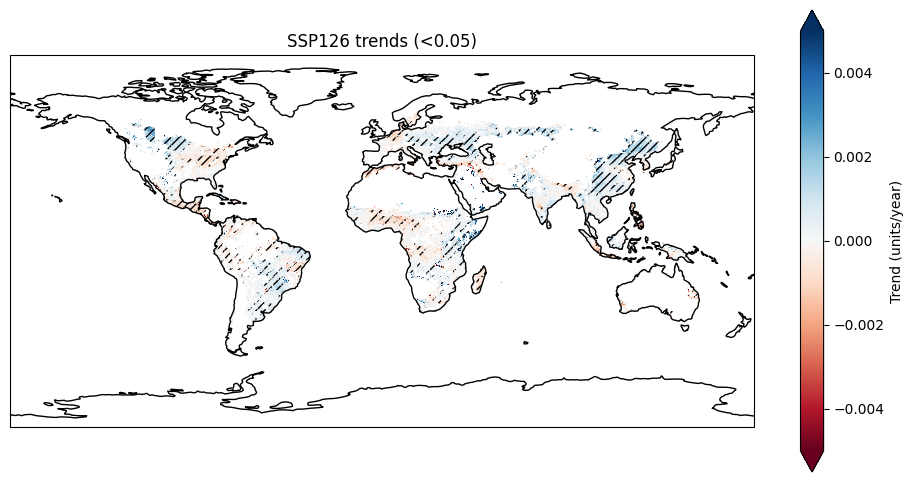

In [46]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

def plot_trend(slope, p, title):
    plt.figure(figsize=(12, 6))
    ax = plt.axes(projection=ccrs.PlateCarree())
    
    # 绘制趋势（自动忽略NaN）
    slope.plot(ax=ax, transform=ccrs.PlateCarree(),
               cmap='RdBu', vmin=-0.005, vmax=0.005,
               cbar_kwargs={'label': 'Trend (units/year)'})
    
    # 标记显著区域（p<0.05且非NaN）
    sig = (p < 0.05) & ~np.isnan(slope)
    ax.contourf(sig.lon, sig.lat, sig, colors='none',
                hatches=['////'], levels=[0.5, 1.5],
                transform=ccrs.PlateCarree())
    
    ax.coastlines()
    plt.title(title)
    plt.show()

plot_trend(slope_map_126, p_map_126, "SSP126 trends (<0.05)")

C:\Users\Administrator\AppData\Local\Temp\ipykernel_14988\3371155801.py:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
C:\Users\Administrator\AppData\Local\Temp\ipykernel_14988\3371155801.py:42: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


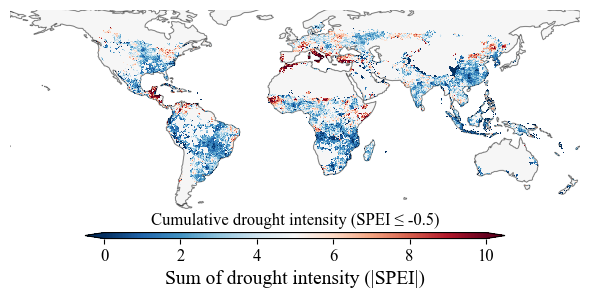

C:\Users\Administrator\AppData\Local\Temp\ipykernel_14988\3371155801.py:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
C:\Users\Administrator\AppData\Local\Temp\ipykernel_14988\3371155801.py:42: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


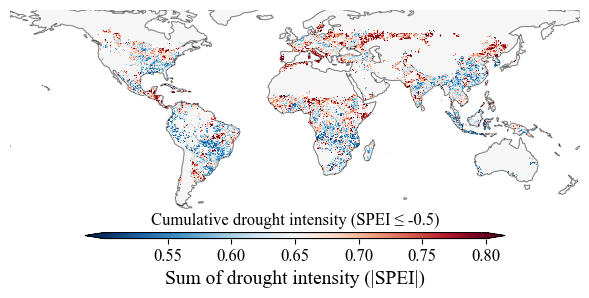

C:\Users\Administrator\AppData\Local\Temp\ipykernel_14988\3371155801.py:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
C:\Users\Administrator\AppData\Local\Temp\ipykernel_14988\3371155801.py:42: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


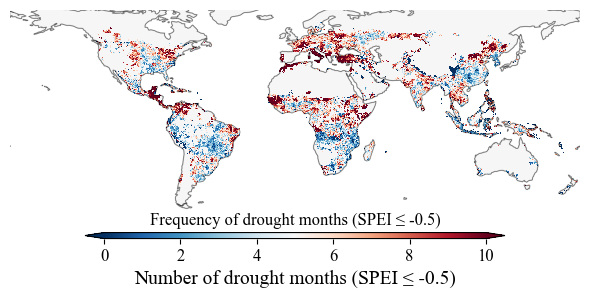

C:\Users\Administrator\AppData\Local\Temp\ipykernel_14988\3371155801.py:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
C:\Users\Administrator\AppData\Local\Temp\ipykernel_14988\3371155801.py:42: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


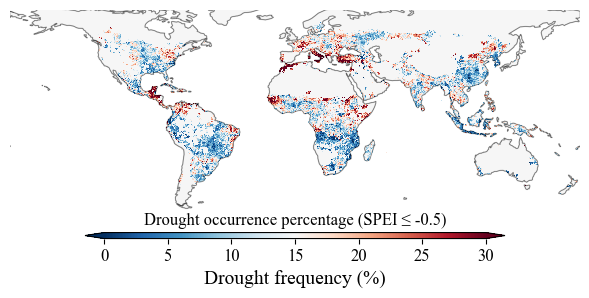

In [38]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
def plot_fig(slope,vmax,title,label):
   
    # Set up figure and projection
    fig = plt.figure(figsize=(6, 3))
    plt.rcParams["font.family"] = "Times New Roman"
    
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent([-180, 180, -60, 70], crs=ccrs.PlateCarree())
    
    # Add map features
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5, alpha=0.5)
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray', alpha=0.2)
    ax.add_feature(cfeature.OCEAN, facecolor='white', alpha=0.5)
    
    # Plot trend data
    im = slope.plot(ax=ax, transform=ccrs.PlateCarree(),
                   cmap='RdBu_r', vmax=vmax,
                   add_colorbar=False)

    
    # Custom colorbar
    cbar_ax = fig.add_axes([0.15, 0.08, 0.7, 0.02])  # [left, bottom, width, height]
    cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal',
                       extend='both', pad=0.1)
    cbar.set_label(label, fontsize=14)
    cbar.ax.tick_params(labelsize=12)
    
    # Gridlines and frame
    gl = ax.gridlines(draw_labels=False)
    gl.xlines = False
    gl.ylines = False
    # gl.xlabel_style = {'size': 10}
    # gl.ylabel_style = {'size': 10}
    
    # Remove frame
    ax.spines['geo'].set_visible(False)
    plt.title(title)
    # Adjust layout and save/show
    plt.tight_layout()
    # if save_path:
    #     plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.tight_layout()
    plt.show()

threshold = -0.5
drought_mask = aa <= threshold
drought_intensity_sum = (aa.where(drought_mask).pipe(np.abs)).sum(dim='time')
drought_intensity_mean = (aa.where(drought_mask).pipe(np.abs)).mean(dim='time')

plot_fig(drought_intensity_sum.where(area>0),10,'Cumulative drought intensity (SPEI ≤ -0.5)','Sum of drought intensity (|SPEI|)')
plot_fig(drought_intensity_mean.where(area>0),0.8,'Cumulative drought intensity (SPEI ≤ -0.5)','Sum of drought intensity (|SPEI|)')

# 统计每个像元的干旱次数（月数）
drought_count = drought_mask.sum(dim='time')
plot_fig(drought_count.where(area>0),10,'Frequency of drought months (SPEI ≤ -0.5)','Number of drought months (SPEI ≤ -0.5)')

# 计算总月数（忽略 NaN 的情况，也可以用 drought_mask.shape[0] 如果时间长度固定）
total_months = (aa>0).sum(dim='time')  # 或 drought_mask.shape[0]

# 干旱百分比 = 干旱月数 / 总月数 * 100
drought_percent = (drought_mask.sum(dim='time') / total_months) * 100
plot_fig(drought_percent.where(area>0),30,'Drought occurrence percentage (SPEI ≤ -0.5)','Drought frequency (%)')

C:\Users\Administrator\AppData\Local\Temp\ipykernel_15172\3120706872.py:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


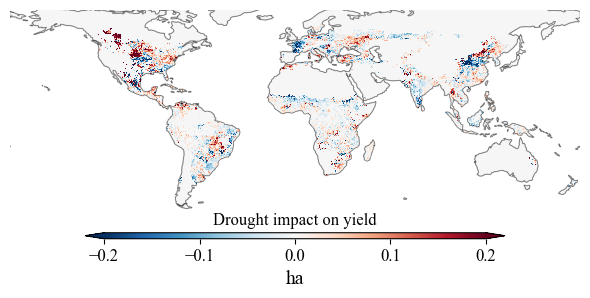

C:\Users\Administrator\AppData\Local\Temp\ipykernel_15172\3120706872.py:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


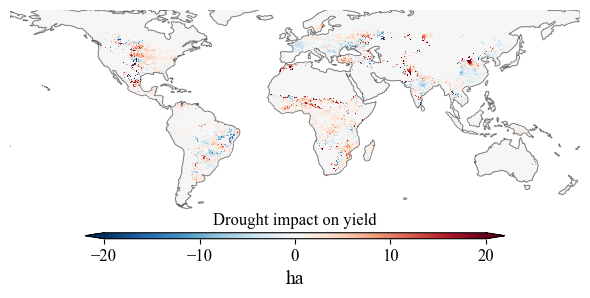

In [69]:
def plot_fig(slope,vmin,vmax,title,label):
   
    # Set up figure and projection
    fig = plt.figure(figsize=(6, 3))
    plt.rcParams["font.family"] = "Times New Roman"
    
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent([-180, 180, -60, 70], crs=ccrs.PlateCarree())
    
    # Add map features
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5, alpha=0.5)
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray', alpha=0.2)
    ax.add_feature(cfeature.OCEAN, facecolor='white', alpha=0.5)
    
    # Plot trend data
    im = slope.plot(ax=ax, transform=ccrs.PlateCarree(),
                   cmap='RdBu_r', vmin=vmin,vmax=vmax,
                   add_colorbar=False)

    
    # Custom colorbar
    cbar_ax = fig.add_axes([0.15, 0.08, 0.7, 0.02])  # [left, bottom, width, height]
    cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal',
                       extend='both', pad=0.1)
    cbar.set_label(label, fontsize=14)
    cbar.ax.tick_params(labelsize=12)
    
    # Gridlines and frame
    gl = ax.gridlines(draw_labels=False)
    gl.xlines = False
    gl.ylines = False
    # gl.xlabel_style = {'size': 10}
    # gl.ylabel_style = {'size': 10}
    
    # Remove frame
    ax.spines['geo'].set_visible(False)
    plt.title(title)
    # Adjust layout and save/show
    plt.tight_layout()
    # if save_path:
    #     plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
drought_mask = aa >0
# drought_mask=(ssi_mai_ssp585<=-0.5).groupby('time.year').mean()

yied['time']=drought_mask.time.values
# (yied.mean(dim='time')-yied.where(drought_mask).mean(dim='time')).plot()
plot_fig((yied.mean(dim='time')-yied.where(drought_mask).mean(dim='time')),-0.2,0.2,'Drought impact on yield','ha')
plot_fig((yied.mean(dim='time')-yied.where(drought_mask)[-30:].mean(dim='time'))/yied.mean(dim='time')*100,-20,20,'Drought impact on yield','ha')


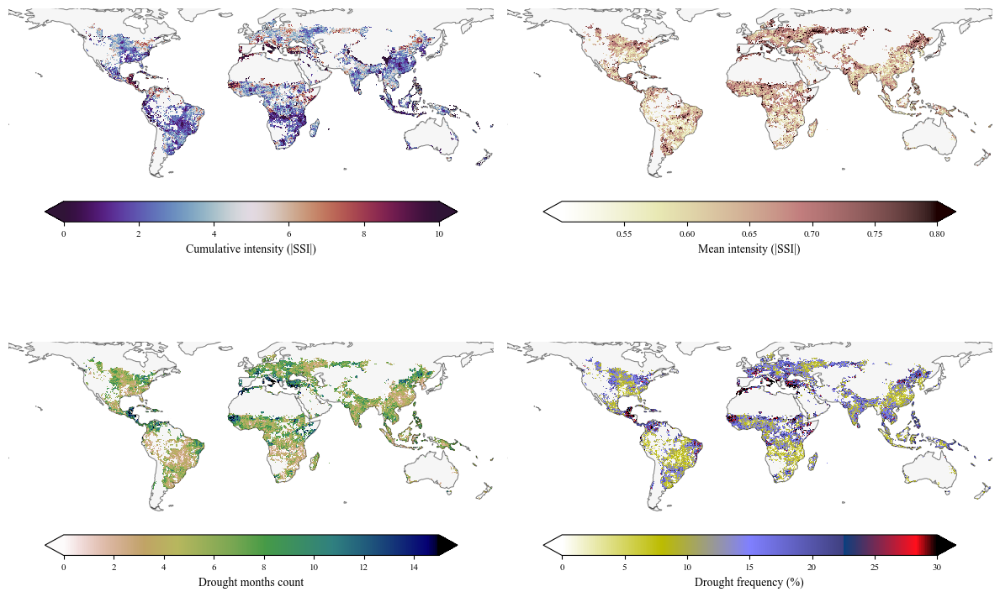

In [32]:
import matplotlib.pyplot as plt
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature
area=xr.open_dataset(join(r'D:\AAUDE\paper\paper8\data\area',f'spam2020_v1r0_global_H_{crop}_R.nc'))['__xarray_dataarray_variable__']

def plot_subpanel(ax, data, vmax, cbar_label,cmap):
    """绘制单个子图的通用函数"""
    # 添加地图要素
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5, alpha=0.5)
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray', alpha=0.2)
    ax.add_feature(cfeature.OCEAN, facecolor='white', alpha=0.5)
    
    # 绘制数据
    im = data.plot(ax=ax, transform=ccrs.PlateCarree(),
                  cmap=cmap, vmax=vmax,
                  add_colorbar=False)
    
    # 添加色条
    cbar = plt.colorbar(im, ax=ax, orientation='horizontal',extend='both',
                       fraction=0.046, pad=0.04)
    cbar.set_label(cbar_label, fontsize=10)
    cbar.ax.tick_params(labelsize=8)
    
    # 网格线和边框设置
    gl = ax.gridlines(draw_labels=False)
    gl.xlines = False
    gl.ylines = False
    ax.spines['geo'].set_visible(False)
def plot_four_panels(aa, area, threshold=-0.5):
    # 创建4个子图
    fig = plt.figure(figsize=(12, 10))
    plt.rcParams["font.family"] = "Times New Roman"
    
    # 计算所有需要的指标
    drought_mask = aa <= threshold
    drought_intensity_sum = (aa.where(drought_mask).pipe(np.abs)).sum(dim='time')
    drought_intensity_mean = (aa.where(drought_mask).pipe(np.abs)).mean(dim='time')
    drought_count = drought_mask.sum(dim='time')
    total_months = (aa>0).sum(dim='time')
    drought_percent = (drought_mask.sum(dim='time') / total_months) * 100
    
    # 子图1: 累积干旱强度
    ax1 = fig.add_subplot(2, 2, 1, projection=ccrs.PlateCarree())
    ax1.set_extent([-180, 180, -60, 70], crs=ccrs.PlateCarree())
    plot_subpanel(ax1, drought_intensity_sum.where(area>0), 10, 'Cumulative intensity (|SSI|)','twilight_shifted')
    
    # 子图2: 平均干旱强度
    ax2 = fig.add_subplot(2, 2, 2, projection=ccrs.PlateCarree())
    ax2.set_extent([-180, 180, -60, 70], crs=ccrs.PlateCarree())
    plot_subpanel(ax2, drought_intensity_mean.where(area>0), 0.8, 'Mean intensity (|SSI|)','pink_r')
    
    # 子图3: 干旱月数
    ax3 = fig.add_subplot(2, 2, 3, projection=ccrs.PlateCarree())
    ax3.set_extent([-180, 180, -60, 70], crs=ccrs.PlateCarree())
    plot_subpanel(ax3, drought_count.where(area>0), 15, 'Drought months count','gist_earth_r')
    
    # 子图4: 干旱百分比
    ax4 = fig.add_subplot(2, 2, 4, projection=ccrs.PlateCarree())
    ax4.set_extent([-180, 180, -60, 70], crs=ccrs.PlateCarree())
    plot_subpanel(ax4, drought_percent.where(area>0), 30, 'Drought frequency (%)','gist_stern_r')
    fig.subplots_adjust(hspace=0.05)
    # 调整布局
    plt.tight_layout()
    

# 使用示例
plot_four_panels(aa, area)
plt.savefig(r'D:\AAUDE\paper\paper8\fig\ssi_yield.png')
plt.show()

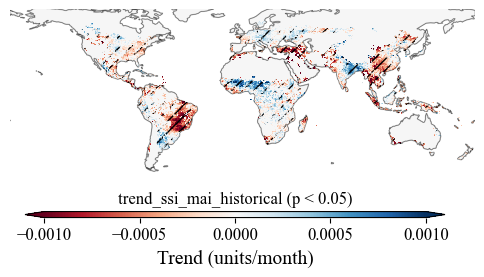

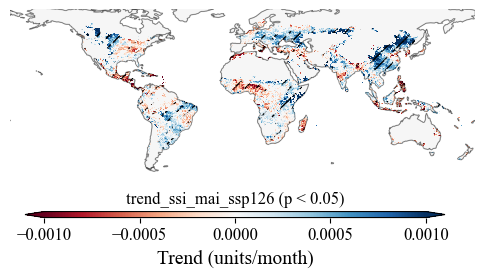

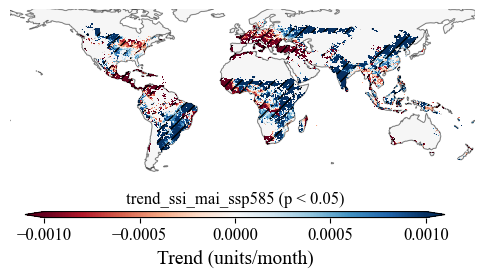

In [55]:
from pathlib import Path
import xarray as xr
from os.path import join
files=list(Path(r'D:\AAUDE\paper\paper8\data\resu').glob('trend_ssi*'))
area=xr.open_dataset(join(r'D:\AAUDE\paper\paper8\data\area',f'spam2020_v1r0_global_H_mai_R.nc'))['__xarray_dataarray_variable__']
for file in files:
    aa=xr.open_dataset(file)
    filename = str(file).split('\\')[-1][:-3]
    plot_trend(aa.sen_slope.where(area>0), aa.p_value.where(area>0),-0.001,0.001, f"{filename} (p < 0.05)", 
          rf'D:\AAUDE\paper\paper8\fig\{filename}.png')

In [1]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np

def plot_trend(slope, p, title, save_path=None):
   
    # Set up figure and projection
    fig = plt.figure(figsize=(6, 3))
    plt.rcParams["font.family"] = "Times New Roman"
    
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent([-180, 180, -60, 70], crs=ccrs.PlateCarree())
    
    # Add map features
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5, alpha=0.5)
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray', alpha=0.2)
    ax.add_feature(cfeature.OCEAN, facecolor='white', alpha=0.5)
    
    # Plot trend data
    im = slope.plot(ax=ax, transform=ccrs.PlateCarree(),
                   cmap='RdBu', robust=True,
                   add_colorbar=False)
    
    # Add significance hatching
    sig = (p < 0.05) & (~np.isnan(slope))
    ax.contourf(sig.lon, sig.lat, sig, 
                colors='none', hatches=['///'], 
                levels=[0.5, 1.5], transform=ccrs.PlateCarree(),
                alpha=0)  # Makes the hatching more visible
    
    # Custom colorbar
    cbar_ax = fig.add_axes([0.15, 0.08, 0.7, 0.02])  # [left, bottom, width, height]
    cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal',
                       extend='both', pad=0.1)
    cbar.set_label('Trend (units/month)', fontsize=14)
    cbar.ax.tick_params(labelsize=12)
    
    # Gridlines and frame
    gl = ax.gridlines(draw_labels=False)
    gl.xlines = False
    gl.ylines = False
    # gl.xlabel_style = {'size': 10}
    # gl.ylabel_style = {'size': 10}
    plt.title(title)
    # Remove frame
    ax.spines['geo'].set_visible(False)
    
    # Adjust layout and save/show
    # plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    # plt.tight_layout()
    plt.show()

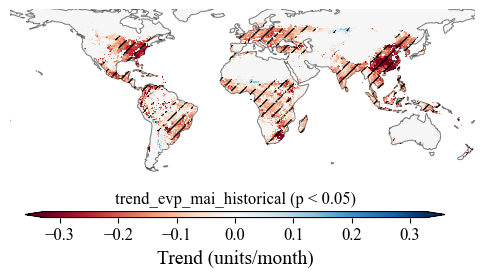

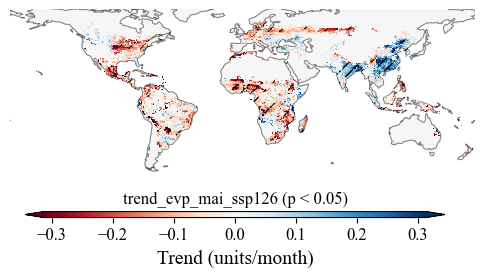

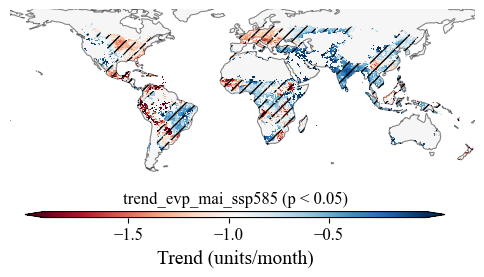

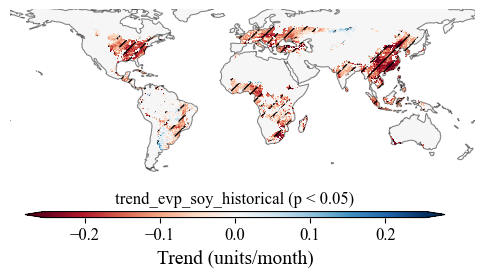

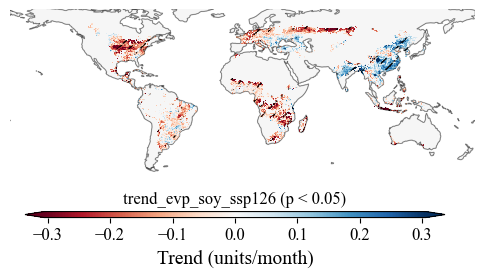

...

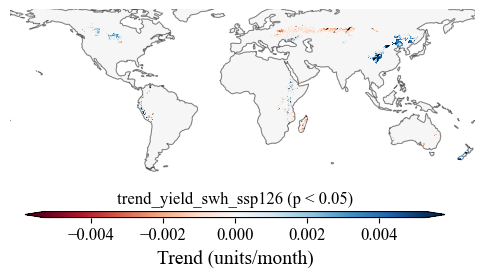

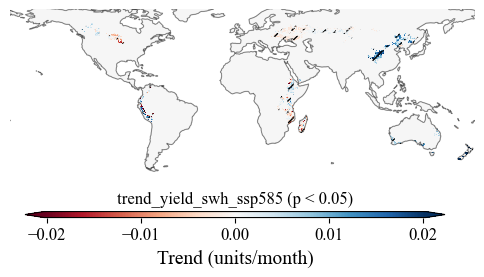

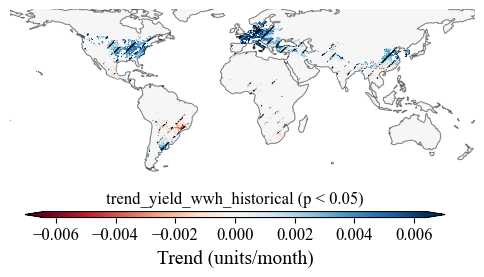

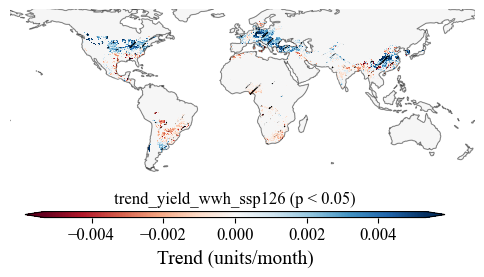

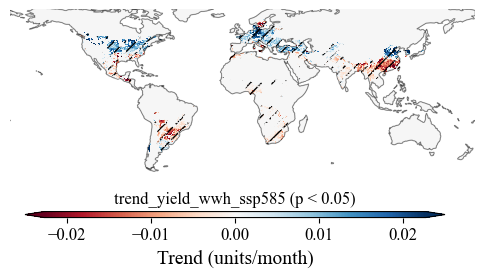

In [2]:
from pathlib import Path
import xarray as xr
from os.path import join

files=list(Path(r'D:\AAUDE\paper\paper8\data\resu').glob('trend*'))
area=xr.open_dataset(join(r'D:\AAUDE\paper\paper8\data\area',f'spam2020_v1r0_global_H_mai_R.nc'))['__xarray_dataarray_variable__']
for file in files:
    aa=xr.open_dataset(file)
    filename = str(file).split('\\')[-1][:-3]
    plot_trend(aa.sen_slope.where(area>0), aa.p_value.where(area>0), f"{filename} (p < 0.05)", 
          rf'D:\AAUDE\paper\paper8\fig\{filename}.png')

Processing mai ssp126...


C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


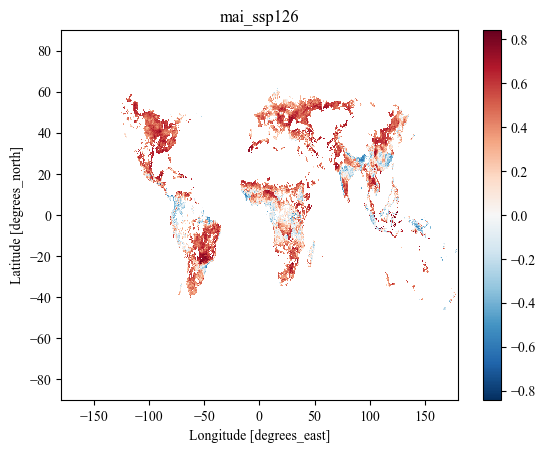

Processing mai ssp585...


C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


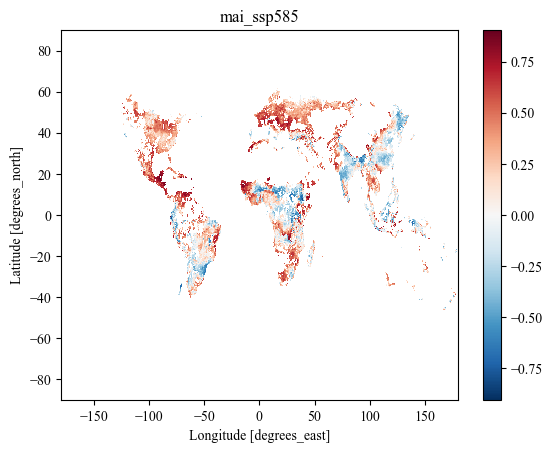

Processing swh ssp126...


C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


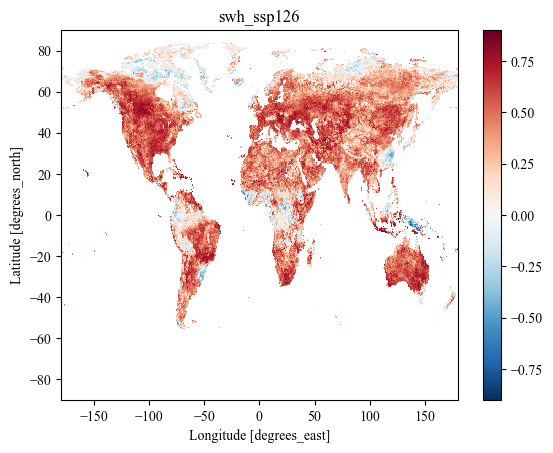

Processing swh ssp585...


C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


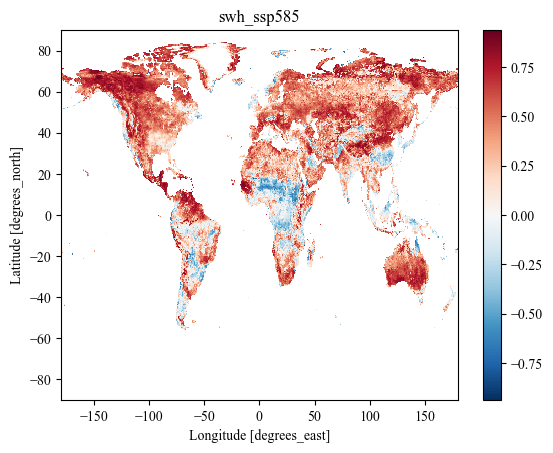

Processing wwh ssp126...


C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


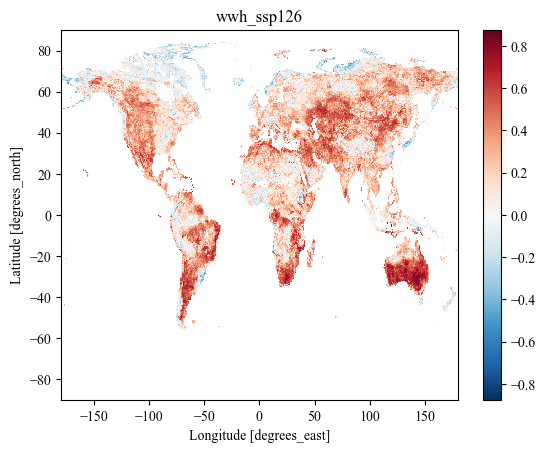

Processing wwh ssp585...


C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


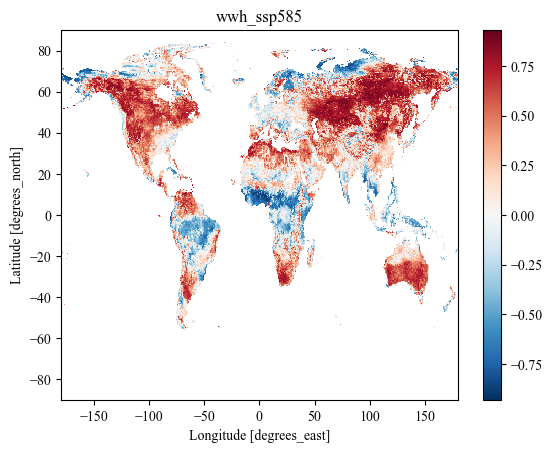

Processing soy ssp126...


C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


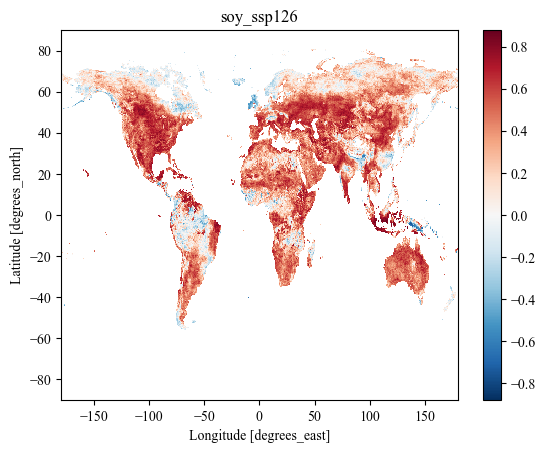

Processing soy ssp585...


C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


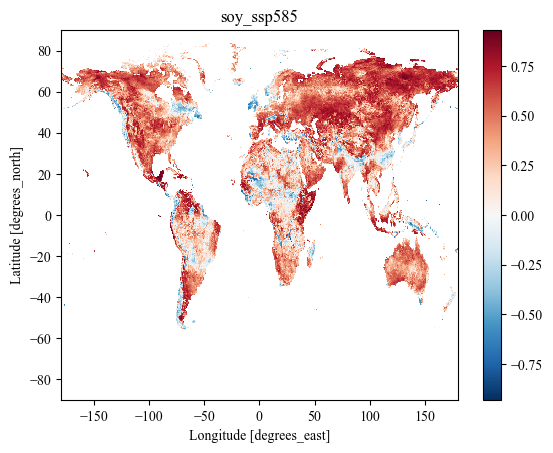

In [17]:
crops = ['mai','swh', 'wwh', 'soy']

for crop in crops:
    for ssp in ['ssp126','ssp585']:
        print(f"Processing {crop} {ssp}...")
        
        # 优化读取和计算
        ssi = xr.open_dataset(
            rf'D:\AAUDE\paper\paper8\data\resu\ssi_{crop}_{ssp}_median.nc',
            chunks={'time': 12}
        )['__xarray_dataarray_variable__']
        
        # 方法1：Dask并行（推荐）
        ssi_annual = ssi.groupby('time.year').mean().compute()
        
        # 方法2：resample替代方案
        # ssi_annual = ssi.resample(time='YS').mean()
        
        ssi_annual = ssi_annual.rename({'year': 'time'}).transpose('time', 'lat', 'lon')
        
        yied = xr.open_dataset(
            rf'D:\AAUDE\paper\paper8\data\resu\yield_{crop}_{ssp}_median.nc'
        )[f'yield-{crop}-noirr']
        
        yied['time'] = ssi_annual.time.values
        
        # 计算相关性
        corr = xr.corr(ssi_annual, yied, dim='time')
        
        # 绘图
        plt.figure()
        corr.plot()
        plt.title(f'{crop}_{ssp}')
        plt.show()

In [13]:
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import warnings
from scipy.stats import pearsonr
# 忽略警告
warnings.filterwarnings("ignore")

# 设置绘图风格
# plt.style.use('seaborn-white')  # 使用有效的样式名称
# sns.set_style("whitegrid")  # 设置 seaborn 样式

# 作物和情景定义
crops = ['mai', 'swh', 'wwh', 'soy']
ssps = ['ssp126', 'ssp585']

# 干旱强度分类阈值 (基于SSI指数)
drought_levels = {
    'Normal': (-0.5, 0.5),
    'Mild': (-1.0, -0.5),
    'Moderate': (-1.5, -1.0),
    'Severe': (-2.0, -1.5),
    'Extreme': (-np.inf, -2.0)
}

def load_data(crop, ssp):
    """加载SSI干旱指数和产量数据"""
    # 加载SSI干旱指数（月尺度）
    ssi = xr.open_dataset(
        rf'D:\AAUDE\paper\paper8\data\resu\ssi_{crop}_{ssp}_median.nc'
    )['__xarray_dataarray_variable__']
    
    # 加载产量数据（年尺度）
    yield_data = xr.open_dataset(
        rf'D:\AAUDE\paper\paper8\data\resu\yield_{crop}_{ssp}_median.nc'
    )[f'yield-{crop}-noirr']
    start_year = ssi['time'].dt.year.min().item()
    end_year = ssi['time'].dt.year.max().item()
    
    # 生成年尺度时间序列（以每年的最后一天为例）
    annual_times = pd.date_range(
        start=f'{start_year}-12-31',
        end=f'{end_year}-12-31',
        freq='A-DEC'  # 每年最后一天
        )
    yield_data['time']=annual_times
    # 确保时间对齐 - 将年尺度数据转换为月尺度
    # 创建月尺度时间序列
    monthly_yield = yield_data.interp(time=ssi.time, method='nearest')
    
    return ssi, monthly_yield

def analyze_monthly_impact(crop, ssp):
    """分析每月干旱对产量的影响"""
    ssi, yield_data = load_data(crop, ssp)
    
    # 创建结果DataFrame
    months = range(1, 13)
    results = pd.DataFrame(index=months, columns=['Correlation', 'P-value'])
    
    # 计算每月干旱与产量的相关性
    for month in months:
        # 提取特定月份的数据
        ssi_month = ssi.sel(time=ssi.time.dt.month == month)
        yield_month = yield_data.sel(time=yield_data.time.dt.month == month)
        
        # 计算相关系数和p值
        corr, pval = xr.corr(ssi_month, yield_month, dim='time', return_p=True)
        
        # 存储结果
        results.loc[month, 'Correlation'] = corr.values.mean()
        results.loc[month, 'P-value'] = pval.values.mean()
    
    return results

def analyze_drought_intensity_impact(crop, ssp):
    """分析不同干旱强度对产量的影响"""
    ssi, yield_data = load_data(crop, ssp)
    
    # 创建结果容器
    impact_results = {}
    
    # 为每个干旱强度级别计算产量影响
    for level, (lower, upper) in drought_levels.items():
        # 创建干旱强度掩码
        mask = (ssi > lower) & (ssi <= upper)
        
        # 计算该干旱强度下的平均产量
        yield_drought = yield_data.where(mask).mean(dim='time')
        
        # 计算正常条件下的平均产量（作为基准）
        normal_mask = (ssi >= drought_levels['Normal'][0]) & (ssi <= drought_levels['Normal'][1])
        yield_normal = yield_data.where(normal_mask).mean(dim='time')
        
        # 计算产量变化百分比
        yield_change = ((yield_drought - yield_normal) / yield_normal) * 100
        
        # 存储结果
        impact_results[level] = yield_change
    
    return impact_results

def plot_monthly_impact(results, crop, ssp):
    """绘制每月干旱对产量影响的图表"""
    fig, ax = plt.subplots(figsize=(12, 6))
    
    # 绘制相关系数
    results['Correlation'].plot(ax=ax, marker='o', linestyle='-', linewidth=2, 
                               color='darkred', label='Correlation')
    
    # 添加显著水平标记
    significant = results['P-value'] < 0.05
    for month, sig in significant.items():
        if sig:
            ax.scatter(month, results.loc[month, 'Correlation'], s=100, 
                      edgecolor='gold', facecolor='none', linewidth=2, zorder=10)
    
    # 添加零线
    ax.axhline(0, color='gray', linestyle='--', alpha=0.7)
    
    # 设置标题和标签
    ax.set_title(f'Monthly Drought Impact on {crop.upper()} Yield ({ssp})', fontsize=16)
    ax.set_xlabel('Month', fontsize=14)
    ax.set_ylabel('Correlation Coefficient (SSI vs Yield)', fontsize=14)
    ax.set_xticks(range(1, 13))
    ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
                       'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    ax.grid(True, alpha=0.3)
    ax.legend()
    
    # 添加图例说明
    ax.text(0.02, 0.95, 'Gold circles indicate statistical significance (p<0.05)',
           transform=ax.transAxes, fontsize=10, bbox=dict(facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    plt.savefig(rf'D:\AAUDE\paper\paper8\figures\monthly_impact_{crop}_{ssp}.png', dpi=300)
    plt.show()

def plot_drought_intensity_impact(impact_results, crop, ssp):
    """绘制不同干旱强度对产量影响的图表"""
    # 创建空间分布图
    fig, axes = plt.subplots(2, 3, figsize=(18, 12), 
                           subplot_kw={'projection': ccrs.PlateCarree()},
                           gridspec_kw={'width_ratios': [1, 1, 1]})
    
    # 设置全局标题
    fig.suptitle(f'Impact of Drought Intensity on {crop.upper()} Yield ({ssp})', fontsize=20, y=0.95)
    
    # 绘制每个干旱强度的空间影响
    for i, (level, data) in enumerate(impact_results.items()):
        if i >= 5:  # 我们只有5个干旱级别
            break
            
        ax = axes.flatten()[i]
        
        # 添加地理特征
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        
        # 设置标题
        ax.set_title(f'{level} Drought', fontsize=14)
        
        # 绘制产量变化
        im = data.plot.imshow(ax=ax, transform=ccrs.PlateCarree(), 
                             cmap='coolwarm', 
                             vmin=-50, vmax=50, 
                             add_colorbar=False)
        
        # 添加网格线
        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                         linewidth=1, color='gray', alpha=0.5, linestyle='--')
        gl.top_labels = False
        gl.right_labels = False
        gl.xformatter = LONGITUDE_FORMATTER
        gl.yformatter = LATITUDE_FORMATTER
        gl.xlabel_style = {'size': 10}
        gl.ylabel_style = {'size': 10}
    
    # 添加第六个子图作为图例
    ax_legend = axes.flatten()[5]
    ax_legend.axis('off')
    
    # 添加公共颜色条
    cbar_ax = fig.add_axes([0.15, 0.05, 0.7, 0.02])
    cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
    cbar.set_label('Yield Change (%)', fontsize=14)
    cbar.ax.tick_params(labelsize=12)
    
    # 调整布局
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.savefig(rf'D:\AAUDE\paper\paper8\figures\drought_intensity_impact_{crop}_{ssp}.png', dpi=300)
    plt.show()
    
    # 创建全球平均影响柱状图
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # 计算全球平均产量变化
    global_impact = {}
    for level, data in impact_results.items():
        # 计算全球平均，排除NaN值
        global_mean = np.nanmean(data.values)
        global_impact[level] = global_mean
    
    # 转换为DataFrame
    impact_df = pd.DataFrame.from_dict(global_impact, orient='index', columns=['Yield Change'])
    
    # 绘制柱状图
    impact_df.plot(kind='bar', ax=ax, color='darkred', alpha=0.7, edgecolor='black')
    
    # 设置标题和标签
    ax.set_title(f'Global Average Impact of Drought Intensity on {crop.upper()} Yield ({ssp})', fontsize=16)
    ax.set_xlabel('Drought Intensity Level', fontsize=14)
    ax.set_ylabel('Yield Change (%)', fontsize=14)
    ax.grid(True, axis='y', alpha=0.3)
    
    # 添加数值标签
    for i, v in enumerate(impact_df['Yield Change']):
        ax.text(i, v + 0.5 if v > 0 else v - 3, f'{v:.1f}%', 
               ha='center', fontsize=10, fontweight='bold')
    
    plt.tight_layout()
    plt.savefig(rf'D:\AAUDE\paper\paper8\figures\global_drought_impact_{crop}_{ssp}.png', dpi=300)
    plt.show()

def main_analysis():
    """执行主要分析"""
    # 创建汇总结果容器
    monthly_results = {}
    intensity_results = {}
    
    for crop in crops:
        for ssp in ssps:
            print(f"Analyzing {crop} under {ssp} scenario...")
            
            try:
                # 分析每月影响
                monthly_res = analyze_monthly_impact(crop, ssp)
                monthly_results[f"{crop}_{ssp}"] = monthly_res
                plot_monthly_impact(monthly_res, crop, ssp)
                
                # 分析干旱强度影响
                intensity_res = analyze_drought_intensity_impact(crop, ssp)
                intensity_results[f"{crop}_{ssp}"] = intensity_res
                plot_drought_intensity_impact(intensity_res, crop, ssp)
            except Exception as e:
                print(f"Error analyzing {crop} {ssp}: {e}")
    
    return monthly_results, intensity_results

# 执行分析
monthly_results, intensity_results = main_analysis()

Analyzing mai under ssp126 scenario...
Error analyzing mai ssp126: corr() got an unexpected keyword argument 'return_p'
Analyzing mai under ssp585 scenario...
Error analyzing mai ssp585: corr() got an unexpected keyword argument 'return_p'
Analyzing swh under ssp126 scenario...
Error analyzing swh ssp126: corr() got an unexpected keyword argument 'return_p'
Analyzing swh under ssp585 scenario...
Error analyzing swh ssp585: corr() got an unexpected keyword argument 'return_p'
Analyzing wwh under ssp126 scenario...
Error analyzing wwh ssp126: corr() got an unexpected keyword argument 'return_p'
Analyzing wwh under ssp585 scenario...
Error analyzing wwh ssp585: corr() got an unexpected keyword argument 'return_p'
Analyzing soy under ssp126 scenario...
Error analyzing soy ssp126: corr() got an unexpected keyword argument 'return_p'
Analyzing soy under ssp585 scenario...
Error analyzing soy ssp585: corr() got an unexpected keyword argument 'return_p'


Analyzing mai under ssp126 scenario...
ERROR! Session/line number was not unique in database. History logging moved to new session 138


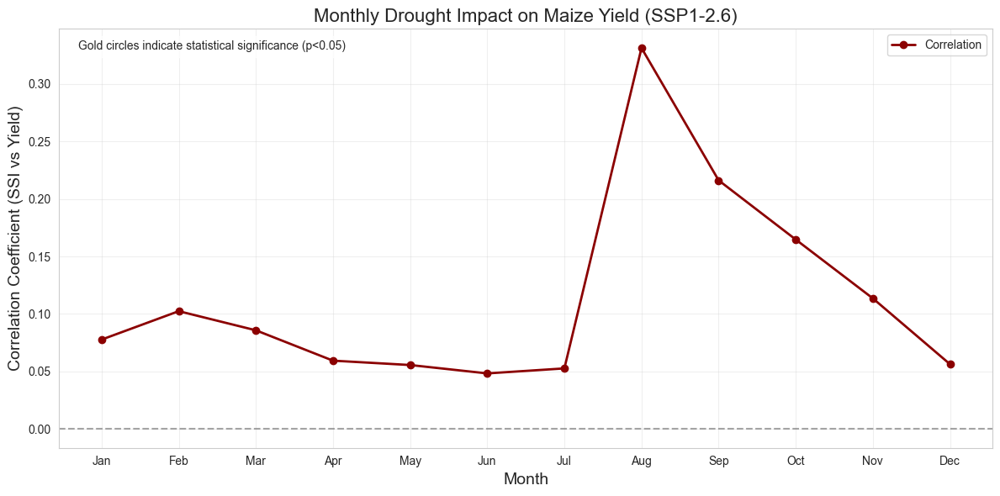

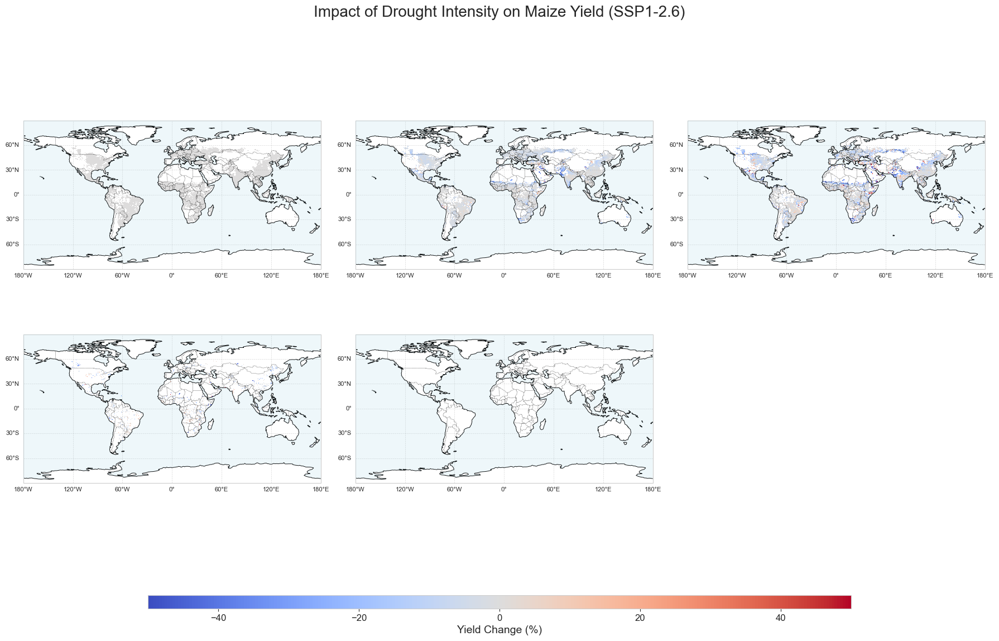

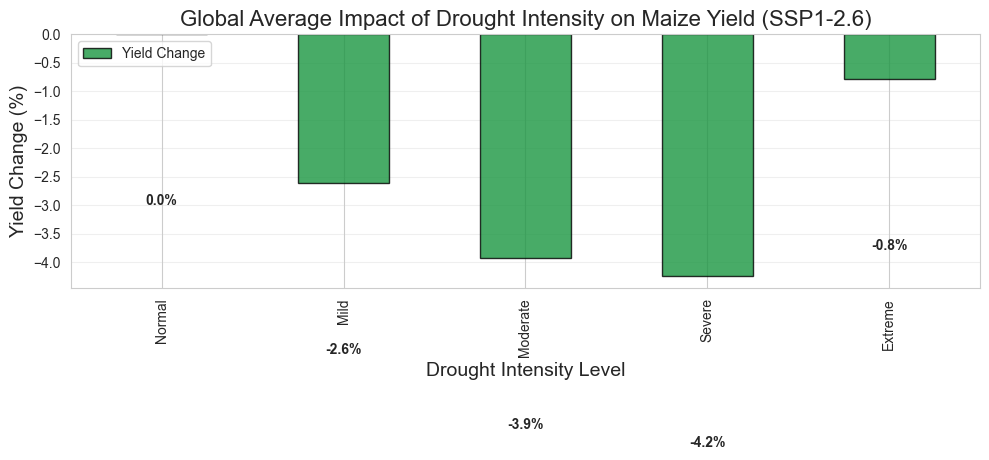

Analyzing mai under ssp585 scenario...


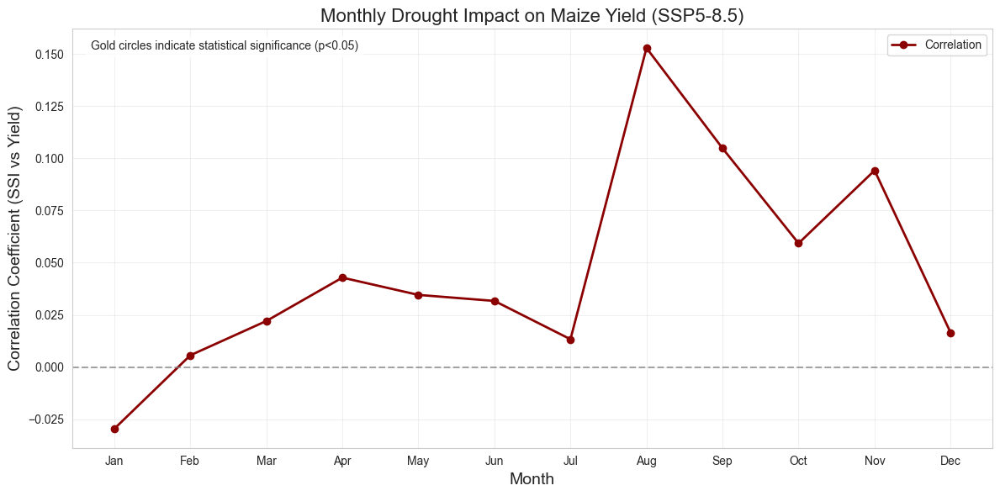

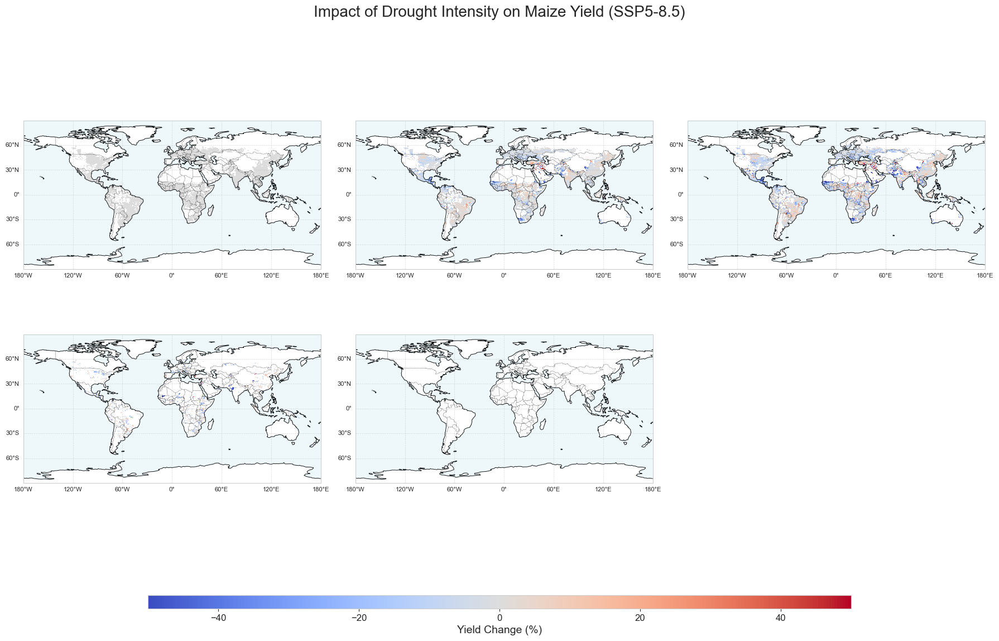

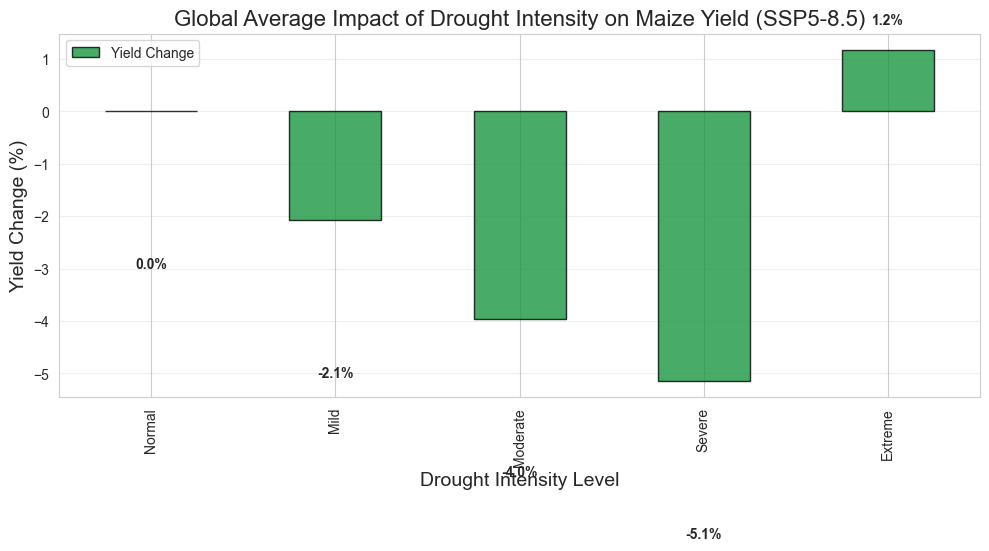

Analyzing swh under ssp126 scenario...


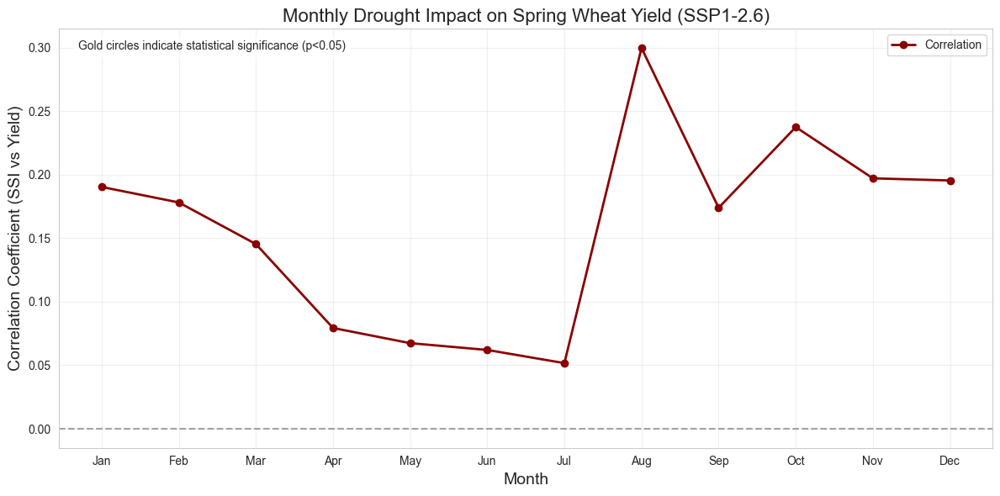

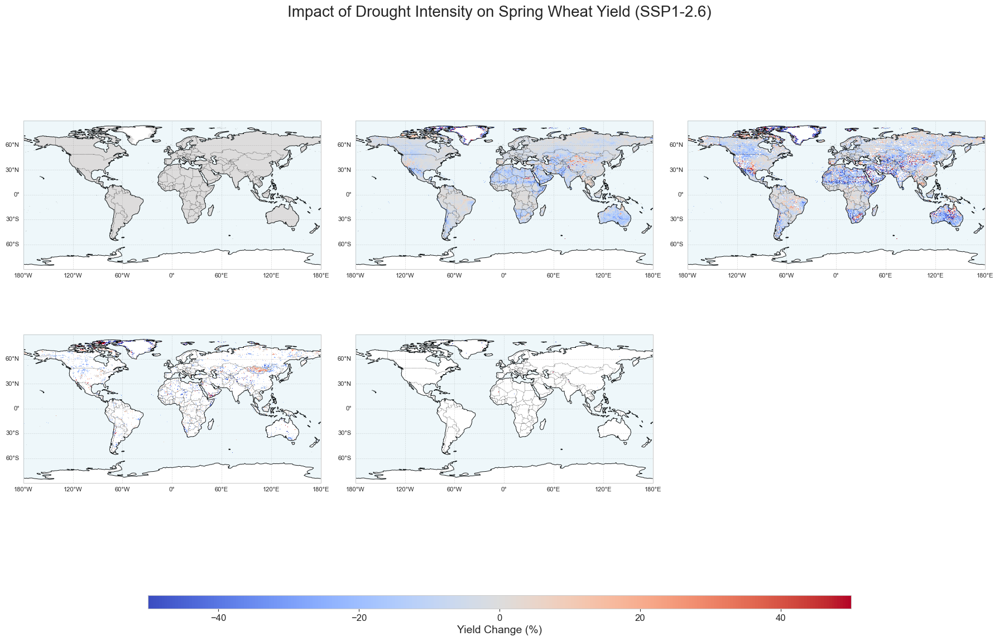

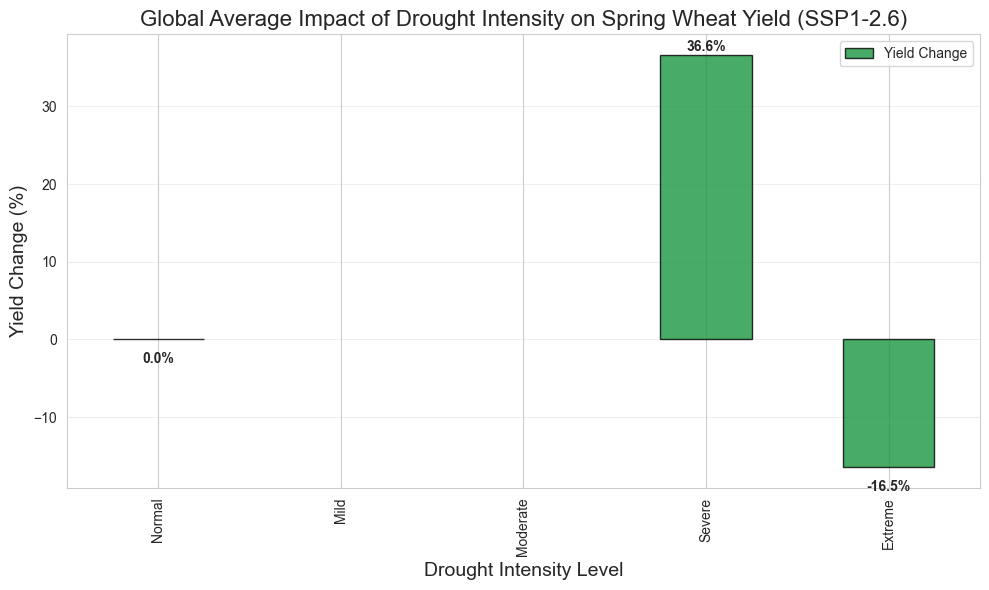

Analyzing swh under ssp585 scenario...


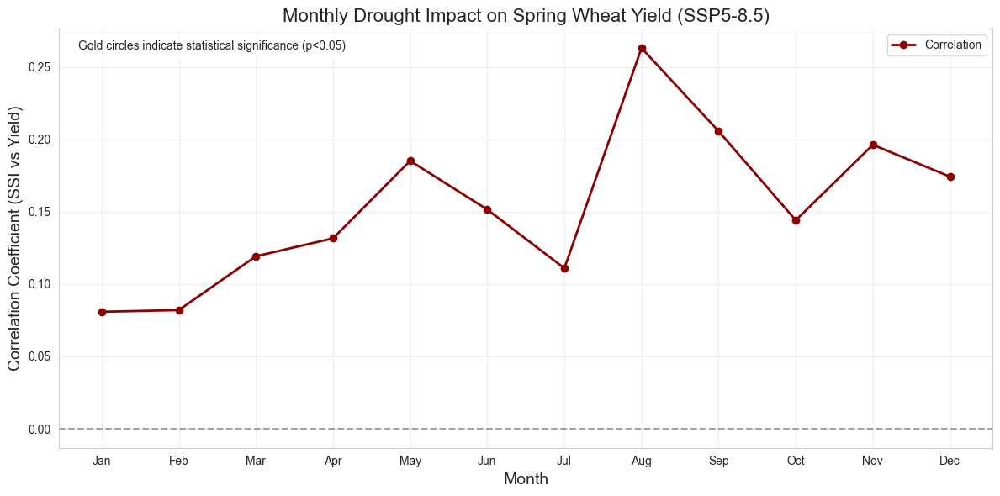

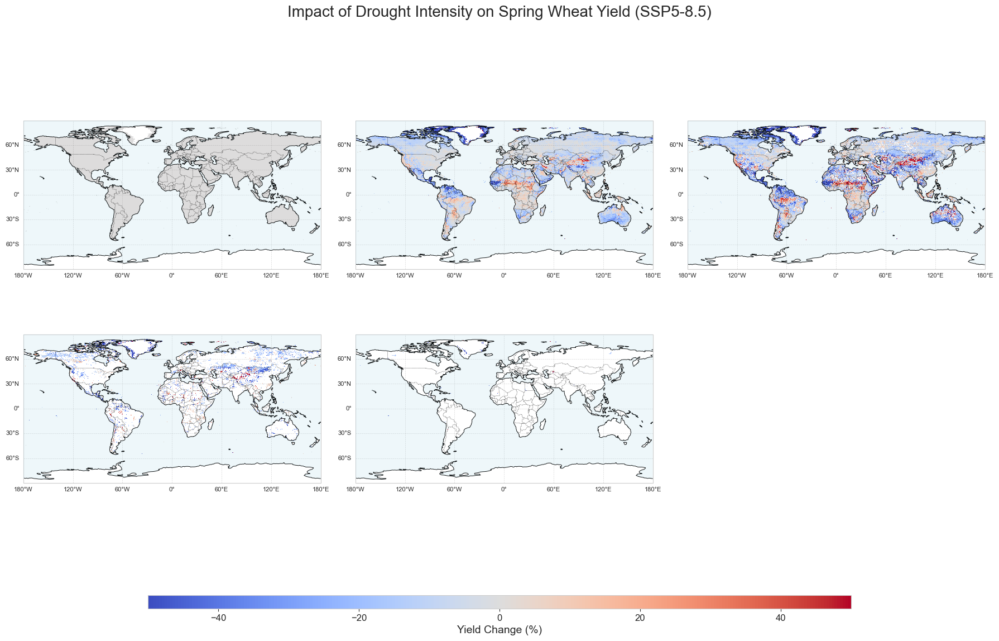

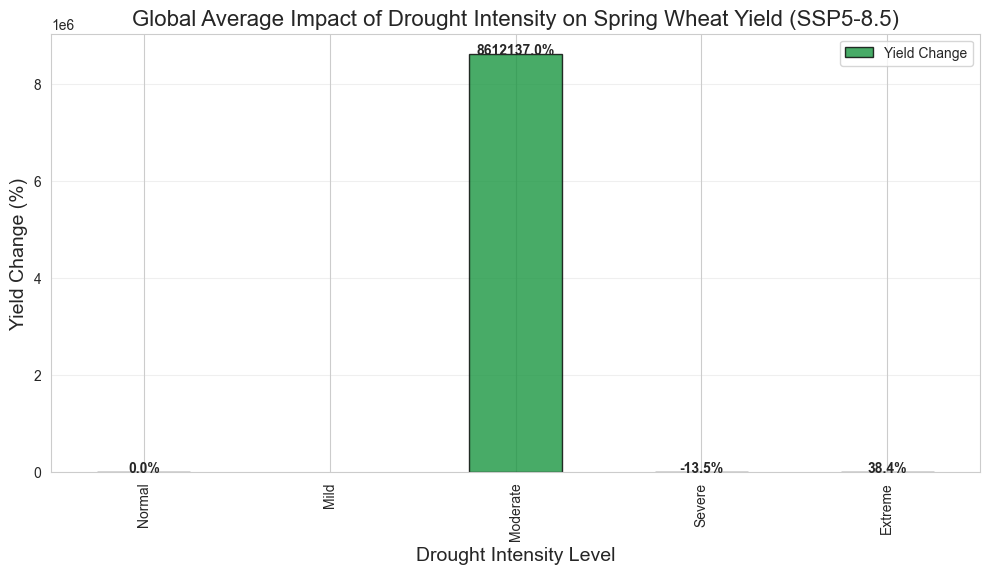

Analyzing wwh under ssp126 scenario...


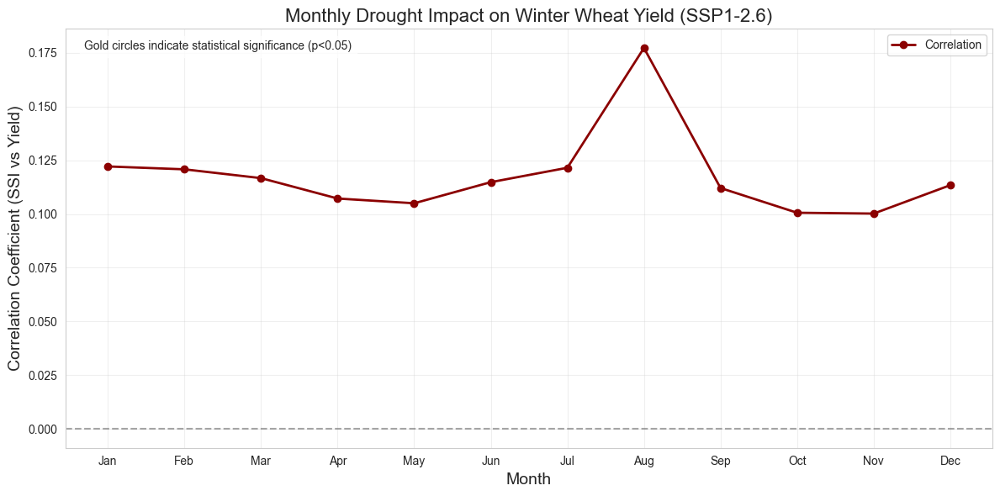

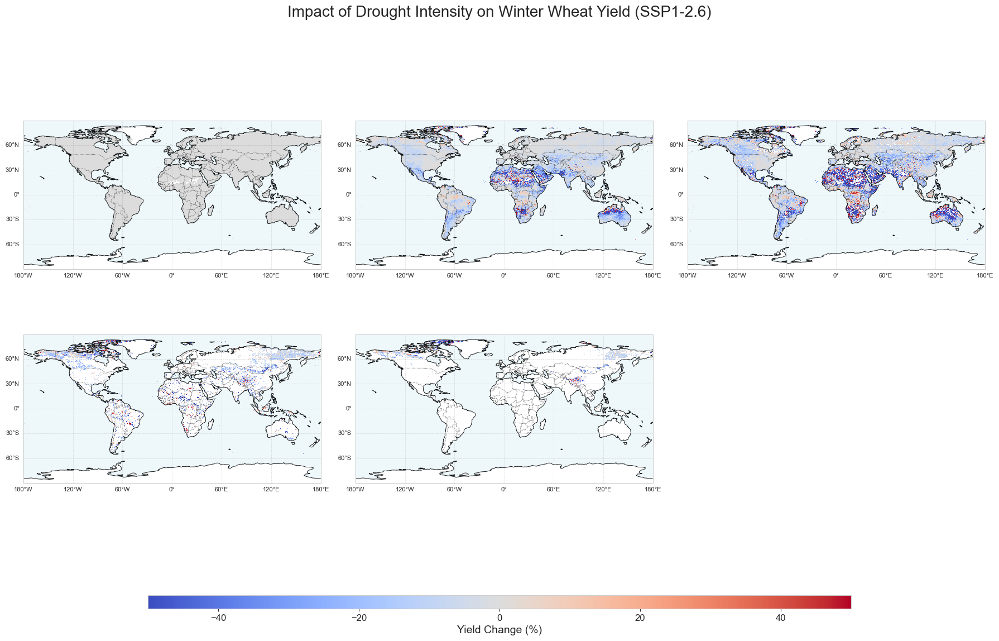

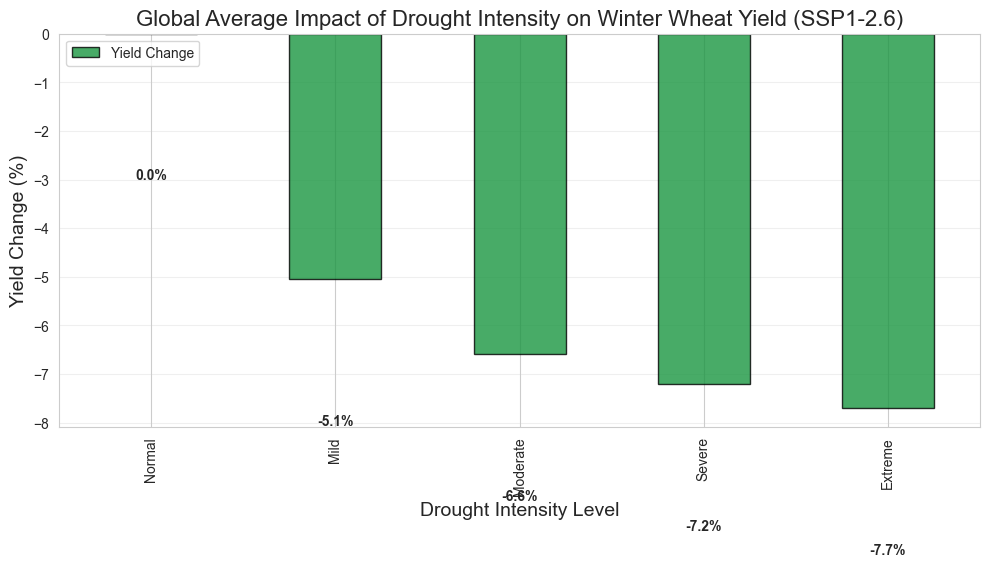

Analyzing wwh under ssp585 scenario...


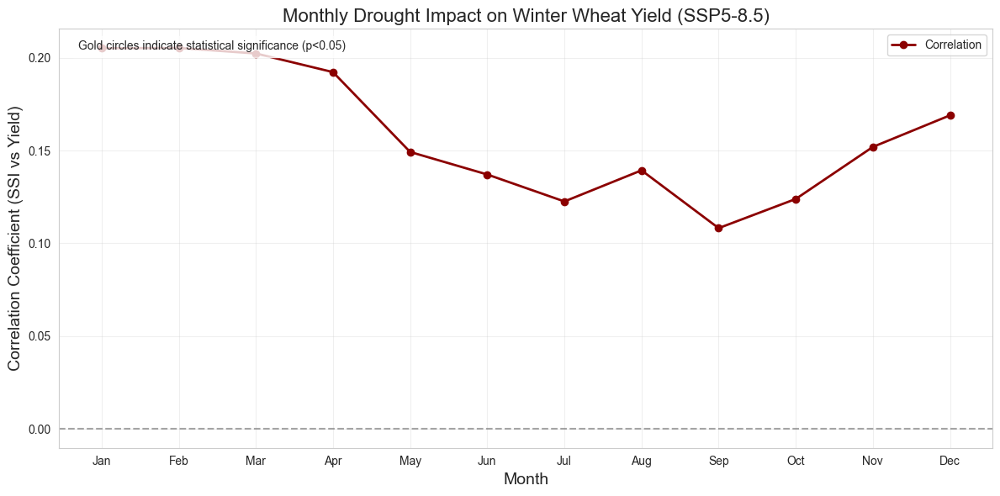

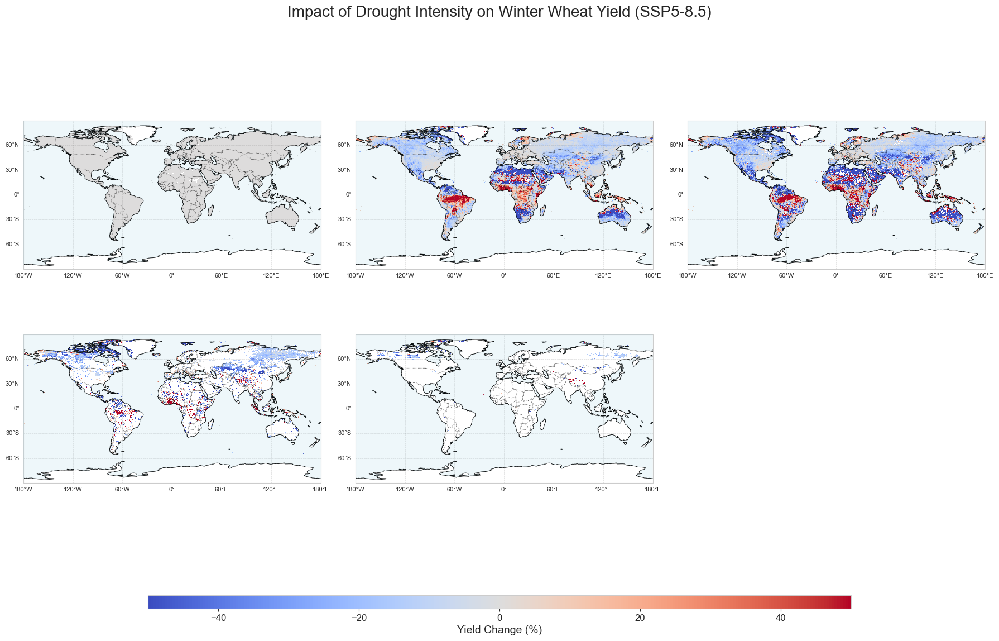

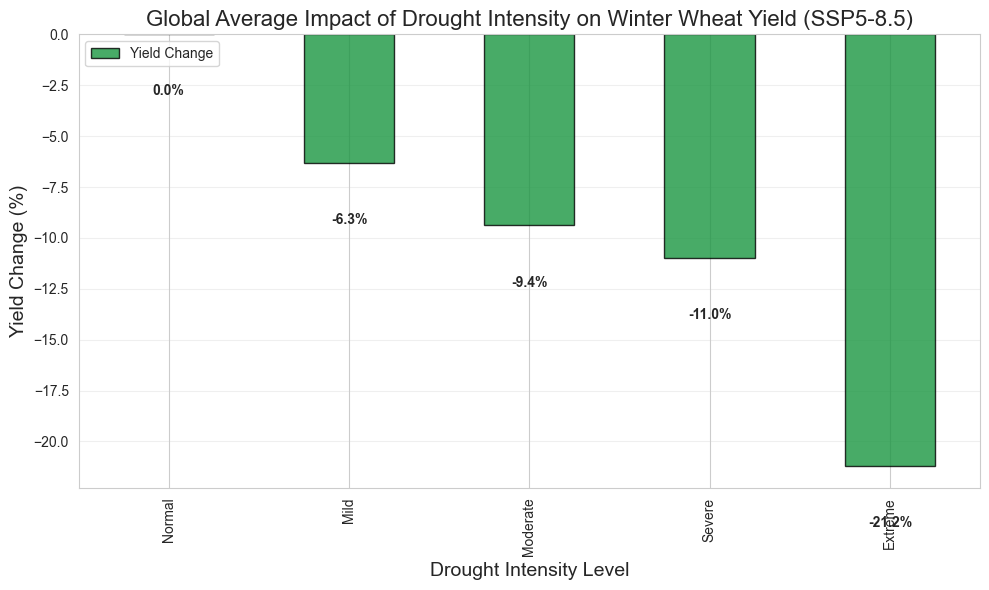

Analyzing soy under ssp126 scenario...


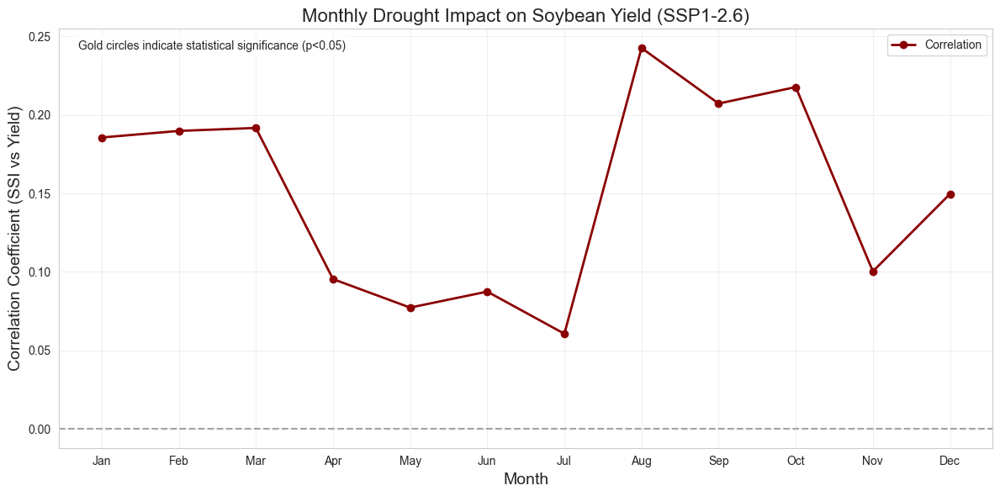

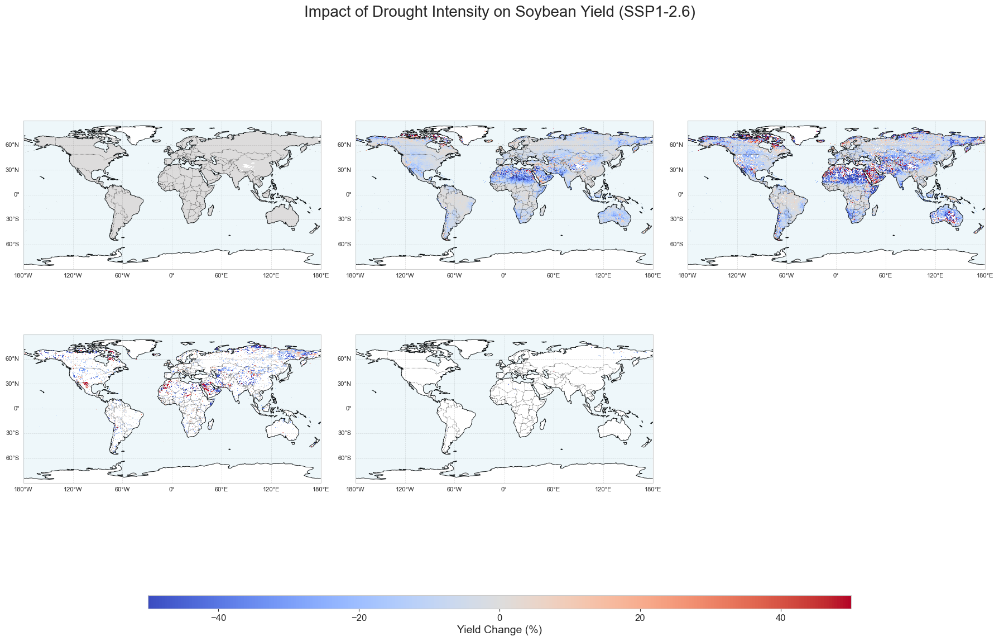

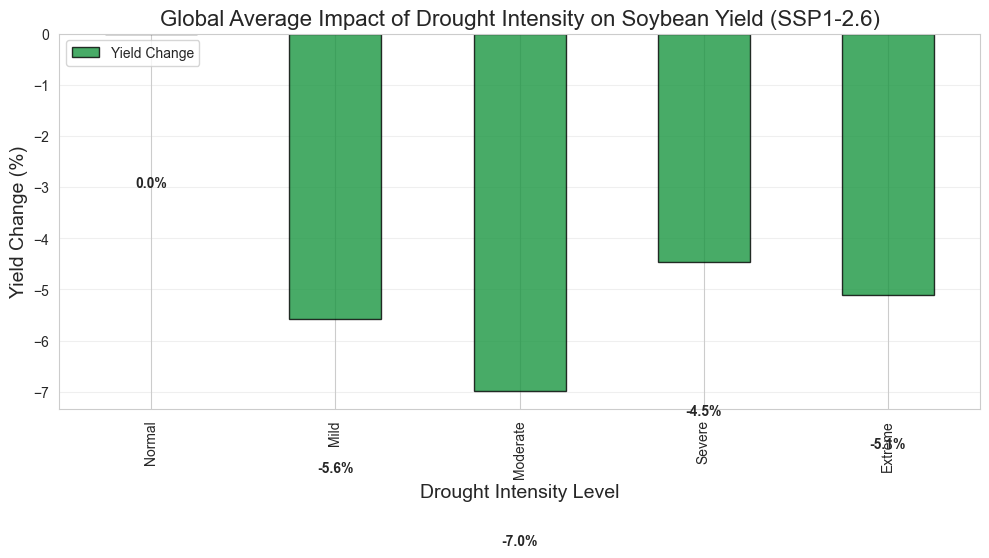

Analyzing soy under ssp585 scenario...


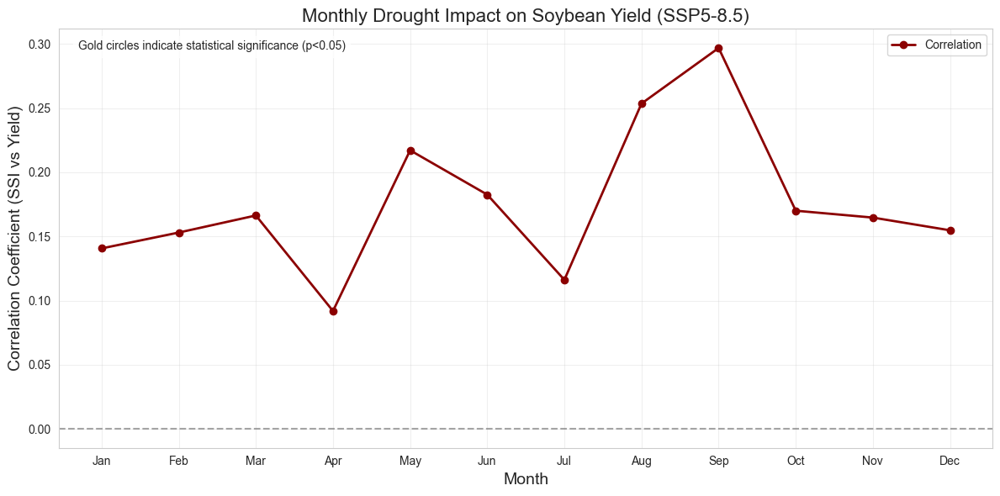

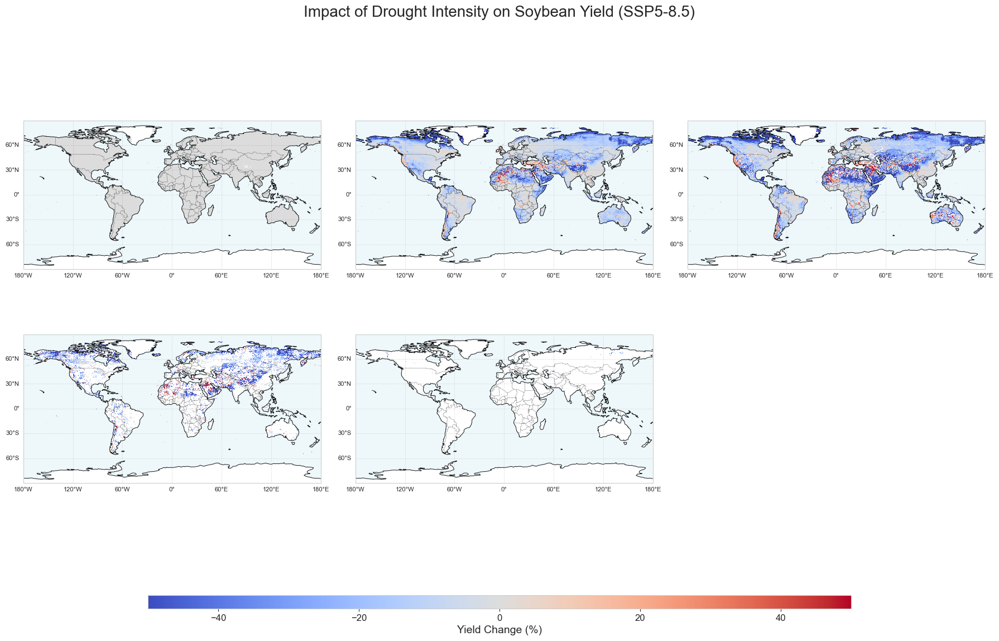

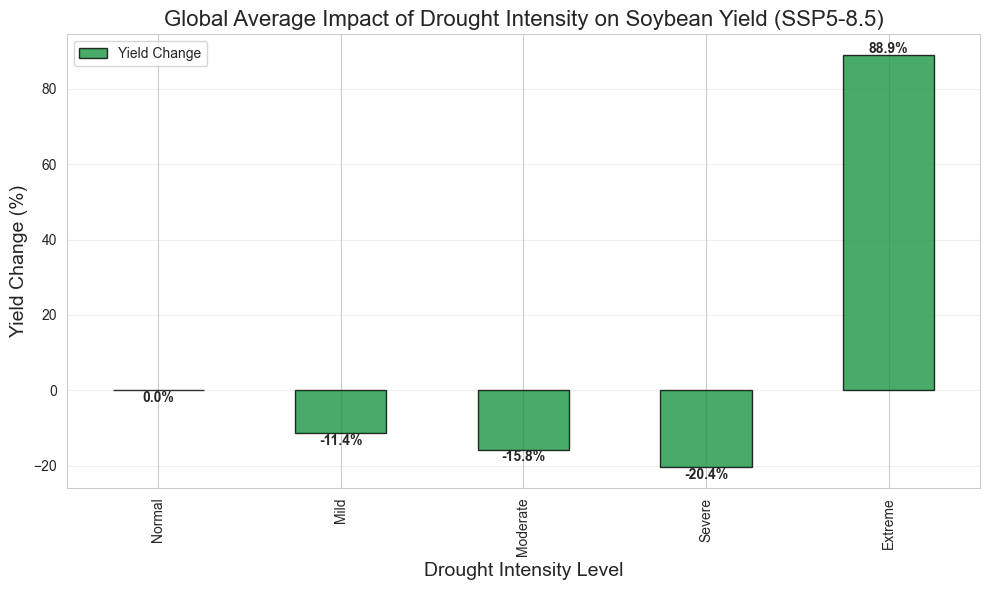

In [14]:
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import warnings

# 忽略警告
warnings.filterwarnings("ignore")

# 设置绘图风格
sns.set_style("whitegrid")

# 作物和情景定义
crops = ['mai', 'swh', 'wwh', 'soy']
ssps = ['ssp126', 'ssp585']

# 干旱强度分类阈值 (基于SSI指数)
drought_levels = {
    'Normal': (-0.5, 0.5),
    'Mild': (-1.0, -0.5),
    'Moderate': (-1.5, -1.0),
    'Severe': (-2.0, -1.5),
    'Extreme': (-np.inf, -2.0)
}

def load_data(crop, ssp):
    """加载SSI干旱指数和产量数据"""
    try:
        # 加载SSI干旱指数（月尺度）
        ssi = xr.open_dataset(
            rf'D:\AAUDE\paper\paper8\data\resu\ssi_{crop}_{ssp}_median.nc'
        )['__xarray_dataarray_variable__']
        
        # 确保时间为datetime类型
        ssi['time'] = pd.to_datetime(ssi.time.values)
        
        # 加载产量数据（年尺度）
        yield_data = xr.open_dataset(
            rf'D:\AAUDE\paper\paper8\data\resu\yield_{crop}_{ssp}_median.nc'
        )[f'yield-{crop}-noirr']
        start_year = ssi['time'].dt.year.min().item()
        end_year = ssi['time'].dt.year.max().item()
        
        # 生成年尺度时间序列（以每年的最后一天为例）
        annual_times = pd.date_range(
            start=f'{start_year}-12-31',
            end=f'{end_year}-12-31',
            freq='A-DEC'  # 每年最后一天
            )
        yield_data['time']=annual_times
        # 确保时间为datetime类型
        yield_data['time'] = pd.to_datetime(yield_data.time.values)
        
        # 创建月尺度时间序列
        monthly_yield = yield_data.interp(time=ssi.time, method='nearest')
        
        # 显式检查时间对齐
        if not np.array_equal(ssi.time.values, monthly_yield.time.values):
            raise ValueError(f"时间维度未对齐: {crop} {ssp}")
            
        return ssi, monthly_yield
    
    except Exception as e:
        print(f"加载数据错误 {crop} {ssp}: {str(e)}")
        raise

def calculate_correlation_with_pvalue(da1, da2, dim='time'):
    """计算相关系数和p值"""
    # 确保维度一致
    da1 = da1.copy()
    da2 = da2.copy()
    
    # 计算相关系数
    corr = xr.corr(da1, da2, dim=dim)
    
    # 计算p值
    def _pearsonr_pvalue(x, y):
        mask = ~np.isnan(x) & ~np.isnan(y)
        if np.sum(mask) < 3:  # 至少需要3个点计算p值
            return np.nan
        return stats.pearsonr(x[mask], y[mask])[1]
    
    pval = xr.apply_ufunc(
        _pearsonr_pvalue,
        da1,
        da2,
        input_core_dims=[[dim], [dim]],
        output_core_dims=[[]],
        vectorize=True,
        dask='parallelized',
        output_dtypes=[float]
    )
    
    return corr, pval

def analyze_monthly_impact(crop, ssp):
    """分析每月干旱对产量的影响"""
    try:
        ssi, yield_data = load_data(crop, ssp)
        
        # 创建结果DataFrame
        months = range(1, 13)
        results = pd.DataFrame(index=months, columns=['Correlation', 'P-value'])
        
        # 计算每月干旱与产量的相关性
        for month in months:
            # 提取特定月份的数据
            ssi_month = ssi.where(ssi.time.dt.month == month, drop=True)
            yield_month = yield_data.where(yield_data.time.dt.month == month, drop=True)
            
            # 检查是否有足够数据点
            if len(ssi_month.time) < 3:  # 至少需要3个点计算相关性
                results.loc[month] = [np.nan, np.nan]
                continue
                
            # 计算相关系数和p值
            corr, pval = calculate_correlation_with_pvalue(ssi_month, yield_month, dim='time')
            
            # 存储结果（使用全球平均值）
            results.loc[month, 'Correlation'] = corr.mean().item()
            results.loc[month, 'P-value'] = pval.mean().item()
        
        return results
    
    except Exception as e:
        print(f"月度分析错误 {crop} {ssp}: {str(e)}")
        return pd.DataFrame()

def analyze_drought_intensity_impact(crop, ssp):
    """分析不同干旱强度对产量的影响"""
    try:
        ssi, yield_data = load_data(crop, ssp)
        
        # 创建结果容器
        impact_results = {}
        
        # 为每个干旱强度级别计算产量影响
        for level, (lower, upper) in drought_levels.items():
            # 创建干旱强度掩码
            mask = (ssi > lower) & (ssi <= upper)
            
            # 计算该干旱强度下的平均产量
            yield_drought = yield_data.where(mask).mean(dim='time')
            
            # 计算正常条件下的平均产量（作为基准）
            normal_mask = (ssi >= drought_levels['Normal'][0]) & (ssi <= drought_levels['Normal'][1])
            yield_normal = yield_data.where(normal_mask).mean(dim='time')
            
            # 计算产量变化百分比
            with warnings.catch_warnings():
                warnings.simplefilter("ignore", category=RuntimeWarning)
                yield_change = ((yield_drought - yield_normal) / yield_normal) * 100
            
            # 存储结果
            impact_results[level] = yield_change
        
        return impact_results
    
    except Exception as e:
        print(f"干旱强度分析错误 {crop} {ssp}: {str(e)}")
        return {}

def plot_monthly_impact(results, crop, ssp):
    """绘制每月干旱对产量影响的图表"""
    if results.empty or results['Correlation'].isnull().all():
        print(f"无法绘制 {crop} {ssp} 的空结果")
        return
        
    fig, ax = plt.subplots(figsize=(12, 6))
    
    # 绘制相关系数
    results['Correlation'].plot(ax=ax, marker='o', linestyle='-', linewidth=2, 
                               color='darkred', label='Correlation')
    
    # 添加显著水平标记
    significant = results['P-value'] < 0.05
    for month, sig in significant.items():
        if sig and not np.isnan(results.loc[month, 'Correlation']):
            ax.scatter(month, results.loc[month, 'Correlation'], s=100, 
                      edgecolor='gold', facecolor='none', linewidth=2, zorder=10)
    
    # 添加零线
    ax.axhline(0, color='gray', linestyle='--', alpha=0.7)
    
    # 设置标题和标签
    crop_name = {'mai': 'Maize', 'swh': 'Spring Wheat', 'wwh': 'Winter Wheat', 'soy': 'Soybean'}.get(crop, crop.upper())
    ssp_name = {'ssp126': 'SSP1-2.6', 'ssp585': 'SSP5-8.5'}.get(ssp, ssp)
    
    ax.set_title(f'Monthly Drought Impact on {crop_name} Yield ({ssp_name})', fontsize=16)
    ax.set_xlabel('Month', fontsize=14)
    ax.set_ylabel('Correlation Coefficient (SSI vs Yield)', fontsize=14)
    ax.set_xticks(range(1, 13))
    ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
                       'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    ax.grid(True, alpha=0.3)
    ax.legend()
    
    # 添加图例说明
    ax.text(0.02, 0.95, 'Gold circles indicate statistical significance (p<0.05)',
           transform=ax.transAxes, fontsize=10, bbox=dict(facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    plt.show()
    plt.savefig(rf'D:\AAUDE\paper\paper8\fig\monthly_impact_{crop}_{ssp}.png', dpi=300)
    plt.close()

def plot_drought_intensity_impact(impact_results, crop, ssp):
    """绘制不同干旱强度对产量影响的图表"""
    if not impact_results:
        print(f"无法绘制 {crop} {ssp} 的空结果")
        return
        
    # 创建空间分布图
    fig, axes = plt.subplots(2, 3, figsize=(18, 12), 
                           subplot_kw={'projection': ccrs.PlateCarree()},
                           gridspec_kw={'width_ratios': [1, 1, 1]})
    
    # 设置全局标题
    crop_name = {'mai': 'Maize', 'swh': 'Spring Wheat', 'wwh': 'Winter Wheat', 'soy': 'Soybean'}.get(crop, crop.upper())
    ssp_name = {'ssp126': 'SSP1-2.6', 'ssp585': 'SSP5-8.5'}.get(ssp, ssp)
    fig.suptitle(f'Impact of Drought Intensity on {crop_name} Yield ({ssp_name})', fontsize=20, y=0.95)
    
    # 绘制每个干旱强度的空间影响
    for i, (level, data) in enumerate(impact_results.items()):
        if i >= 5:  # 我们只有5个干旱级别
            break
            
        ax = axes.flatten()[i]
        
        # 添加地理特征
        ax.add_feature(cfeature.COASTLINE, linewidth=0.7)
        ax.add_feature(cfeature.BORDERS, linestyle=':', linewidth=0.5)
        ax.add_feature(cfeature.OCEAN, zorder=100, facecolor='lightblue', alpha=0.2)
        
        # 设置标题
        ax.set_title(f'{level} Drought', fontsize=14)
        
        # 绘制产量变化
        im = data.plot(ax=ax, transform=ccrs.PlateCarree(), 
                      cmap='coolwarm', 
                      vmin=-50, vmax=50, 
                      add_colorbar=False)
        
        # 添加网格线
        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                         linewidth=0.5, color='gray', alpha=0.3, linestyle='--')
        gl.top_labels = False
        gl.right_labels = False
        gl.xformatter = LONGITUDE_FORMATTER
        gl.yformatter = LATITUDE_FORMATTER
        gl.xlabel_style = {'size': 8}
        gl.ylabel_style = {'size': 8}
    
    # 添加第六个子图作为图例
    ax_legend = axes.flatten()[5]
    ax_legend.axis('off')
    
    # 添加公共颜色条
    cbar_ax = fig.add_axes([0.15, 0.05, 0.7, 0.02])
    cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
    cbar.set_label('Yield Change (%)', fontsize=14)
    cbar.ax.tick_params(labelsize=12)
    
    # 调整布局
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.savefig(rf'D:\AAUDE\paper\paper8\fig\drought_intensity_impact_{crop}_{ssp}.png', dpi=300)
    plt.show()
    plt.close()
    
    # 创建全球平均影响柱状图
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # 计算全球平均产量变化
    global_impact = {}
    for level, data in impact_results.items():
        # 计算全球平均，排除NaN值
        global_mean = np.nanmean(data.values)
        global_impact[level] = global_mean
    
    # 转换为DataFrame
    impact_df = pd.DataFrame.from_dict(global_impact, orient='index', columns=['Yield Change'])
    
    # 绘制柱状图
    colors = ['#1a9641', '#a6d96a', '#fdae61', '#f46d43', '#d7191c']
    impact_df.plot(kind='bar', ax=ax, color=colors, alpha=0.8, edgecolor='black')
    
    # 设置标题和标签
    ax.set_title(f'Global Average Impact of Drought Intensity on {crop_name} Yield ({ssp_name})', fontsize=16)
    ax.set_xlabel('Drought Intensity Level', fontsize=14)
    ax.set_ylabel('Yield Change (%)', fontsize=14)
    ax.grid(True, axis='y', alpha=0.3)
    
    # 添加数值标签
    for i, v in enumerate(impact_df['Yield Change']):
        ax.text(i, v + 0.5 if v > 0 else v - 3, f'{v:.1f}%', 
               ha='center', fontsize=10, fontweight='bold')
    
    plt.tight_layout()
    plt.savefig(rf'D:\AAUDE\paper\paper8\fig\global_drought_impact_{crop}_{ssp}.png', dpi=300)
    plt.show()
    plt.close()

def main_analysis():
    """执行主要分析"""
    # 创建汇总结果容器
    monthly_results = {}
    intensity_results = {}
    
    for crop in crops:
        for ssp in ssps:
            print(f"Analyzing {crop} under {ssp} scenario...")
            
            try:
                # 分析每月影响
                monthly_res = analyze_monthly_impact(crop, ssp)
                if not monthly_res.empty and not monthly_res['Correlation'].isnull().all():
                    monthly_results[f"{crop}_{ssp}"] = monthly_res
                    plot_monthly_impact(monthly_res, crop, ssp)
                else:
                    print(f"月度分析结果为空或无效: {crop} {ssp}")
                
                # 分析干旱强度影响
                intensity_res = analyze_drought_intensity_impact(crop, ssp)
                if intensity_res:
                    intensity_results[f"{crop}_{ssp}"] = intensity_res
                    plot_drought_intensity_impact(intensity_res, crop, ssp)
                else:
                    print(f"干旱强度分析结果为空: {crop} {ssp}")
                    
            except Exception as e:
                print(f"分析主流程错误 {crop} {ssp}: {str(e)}")
    
    # 保存汇总结果
    try:
        # 保存月度分析结果
        monthly_df = pd.concat(monthly_results, names=['Crop_SSP', 'Month'])
        monthly_df.to_csv(r'D:\AAUDE\paper\paper8\data\resu\monthly_correlation_results.csv')
        
        # 保存干旱强度影响结果
        intensity_df = pd.DataFrame()
        for key, value in intensity_results.items():
            for level, data in value.items():
                global_mean = np.nanmean(data.values)
                intensity_df.loc[key, level] = global_mean
        intensity_df.to_csv(r'D:\AAUDE\paper\paper8\data\resu\drought_intensity_impact_results.csv')
        
    except Exception as e:
        print(f"保存结果错误: {str(e)}")
    
    return monthly_results, intensity_results

# 执行分析
if __name__ == "__main__":
    monthly_results, intensity_results = main_analysis()

In [1]:
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import warnings

# 忽略警告
warnings.filterwarnings("ignore")

# 设置绘图风格
sns.set_style("whitegrid")

def load_data():
    """加载SSI干旱指数和产量数据（仅玉米和SSP1-2.6情景）"""
    try:
        # 加载SSI干旱指数（月尺度）
        ssi = xr.open_dataset(
            r'D:\AAUDE\paper\paper8\data\resu\ssi_mai_ssp126_scale2_median.nc'
        )['ssi']
        
        # 确保时间为datetime类型
        ssi['time'] = pd.to_datetime(ssi.time.values)
        
        # 加载产量数据（年尺度）
        yield_data = xr.open_dataset(
            r'D:\AAUDE\paper\paper8\data\resu\yield_mai_ssp126_median.nc'
        )['yield-mai-noirr']
        
        # 生成年尺度时间序列（以每年的最后一天为例）
        start_year = ssi['time'].dt.year.min().item()
        end_year = ssi['time'].dt.year.max().item()
        annual_times = pd.date_range(
            start=f'{start_year}-12-31',
            end=f'{end_year}-12-31',
            freq='A-DEC'  # 每年最后一天
        )
        yield_data['time'] = annual_times
        
        # 确保时间为datetime类型
        yield_data['time'] = pd.to_datetime(yield_data.time.values)
        
        # 创建月尺度时间序列
        monthly_yield = yield_data.interp(time=ssi.time, method='nearest')
        
        return ssi, monthly_yield
    
    except Exception as e:
        print(f"加载数据错误: {str(e)}")
        raise

# 加载数据
ssi, yield_data = load_data()

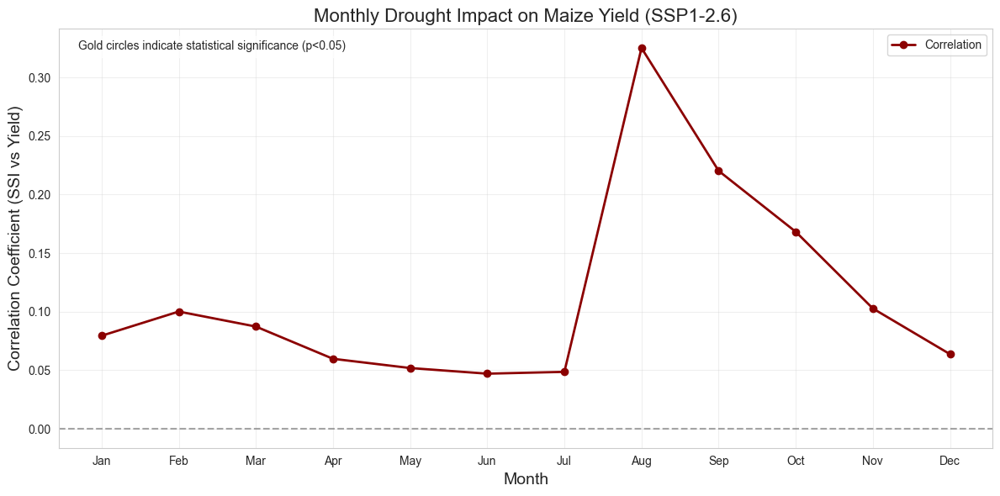

In [2]:
def calculate_correlation_with_pvalue(da1, da2, dim='time'):
    """计算相关系数和p值"""
    # 计算相关系数
    corr = xr.corr(da1, da2, dim=dim)
    
    # 计算p值
    def _pearsonr_pvalue(x, y):
        mask = ~np.isnan(x) & ~np.isnan(y)
        if np.sum(mask) < 3:  # 至少需要3个点计算p值
            return np.nan
        return stats.pearsonr(x[mask], y[mask])[1]
    
    pval = xr.apply_ufunc(
        _pearsonr_pvalue,
        da1,
        da2,
        input_core_dims=[[dim], [dim]],
        output_core_dims=[[]],
        vectorize=True,
        dask='parallelized',
        output_dtypes=[float]
    )
    
    return corr, pval

def analyze_monthly_impact():
    """分析每月干旱对玉米产量的影响（SSP1-2.6情景）"""
    ssi, yield_data = load_data()
    
    # 创建结果DataFrame
    months = range(1, 13)
    results = pd.DataFrame(index=months, columns=['Correlation', 'P-value'])
    
    # 计算每月干旱与产量的相关性
    for month in months:
        # 提取特定月份的数据
        ssi_month = ssi.where(ssi.time.dt.month == month, drop=True)
        yield_month = yield_data.where(yield_data.time.dt.month == month, drop=True)
        
        # 检查是否有足够数据点
        if len(ssi_month.time) < 3:
            results.loc[month] = [np.nan, np.nan]
            continue
            
        # 计算相关系数和p值
        corr, pval = calculate_correlation_with_pvalue(ssi_month, yield_month, dim='time')
        
        # 存储结果（使用全球平均值）
        results.loc[month, 'Correlation'] = corr.mean().item()
        results.loc[month, 'P-value'] = pval.mean().item()
    
    return results

def plot_monthly_impact(results):
    """绘制每月干旱对玉米产量影响的图表（SSP1-2.6情景）"""
    fig, ax = plt.subplots(figsize=(12, 6))
    
    # 绘制相关系数
    results['Correlation'].plot(ax=ax, marker='o', linestyle='-', linewidth=2, 
                               color='darkred', label='Correlation')
    
    # 添加显著水平标记
    significant = results['P-value'] < 0.05
    for month, sig in significant.items():
        if sig and not np.isnan(results.loc[month, 'Correlation']):
            ax.scatter(month, results.loc[month, 'Correlation'], s=100, 
                      edgecolor='gold', facecolor='none', linewidth=2, zorder=10)
    
    # 添加零线
    ax.axhline(0, color='gray', linestyle='--', alpha=0.7)
    
    # 设置标题和标签
    ax.set_title('Monthly Drought Impact on Maize Yield (SSP1-2.6)', fontsize=16)
    ax.set_xlabel('Month', fontsize=14)
    ax.set_ylabel('Correlation Coefficient (SSI vs Yield)', fontsize=14)
    ax.set_xticks(range(1, 13))
    ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
                       'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    ax.grid(True, alpha=0.3)
    ax.legend()
    
    # 添加图例说明
    ax.text(0.02, 0.95, 'Gold circles indicate statistical significance (p<0.05)',
           transform=ax.transAxes, fontsize=10, bbox=dict(facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    plt.savefig(r'D:\AAUDE\paper\paper8\fig\monthly_impact_mai_ssp126.png', dpi=300)
    plt.show()

# 执行分析并绘图
monthly_results = analyze_monthly_impact()
plot_monthly_impact(monthly_results)

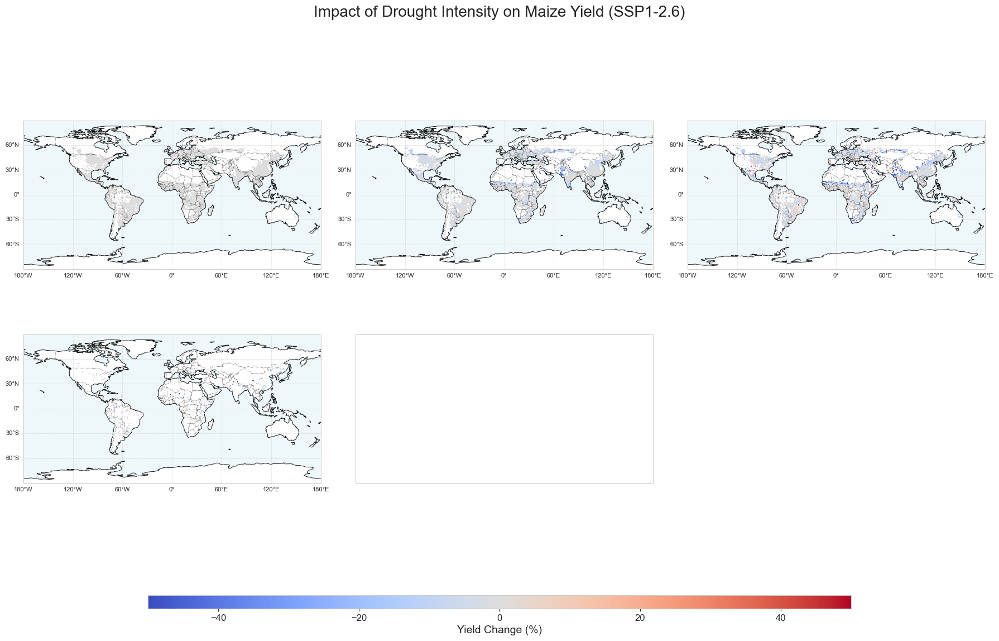

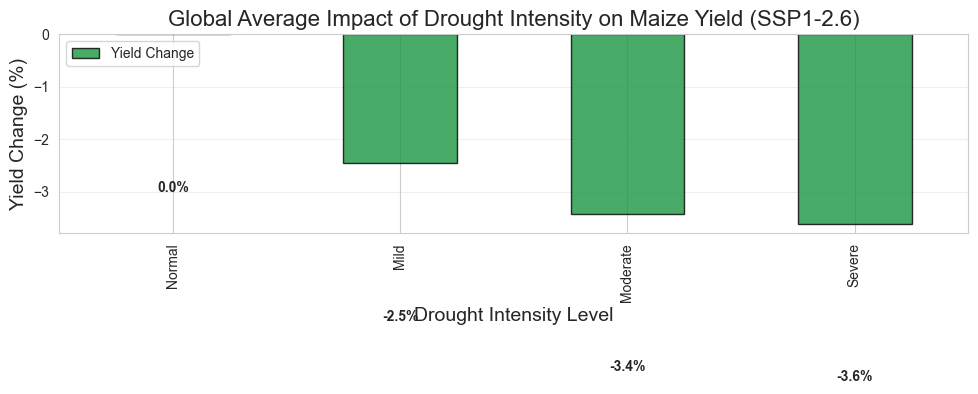

In [5]:
# 干旱强度分类阈值 (基于SSI指数)
drought_levels = {
    'Normal': (-0.5, 0.5),
    'Mild': (-1.0, -0.5),
    'Moderate': (-1.5, -1.0),
    'Severe': (-np.inf, -1.5),
}

def analyze_drought_intensity_impact():
    """分析不同干旱强度对玉米产量的影响（SSP1-2.6情景）"""
    ssi, yield_data = load_data()
    
    # 创建结果容器
    impact_results = {}
    
    # 为每个干旱强度级别计算产量影响
    for level, (lower, upper) in drought_levels.items():
        # 创建干旱强度掩码
        mask = (ssi > lower) & (ssi <= upper)
        
        # 计算该干旱强度下的平均产量
        yield_drought = yield_data.where(mask).mean(dim='time')
        
        # 计算正常条件下的平均产量（作为基准）
        normal_mask = (ssi >= drought_levels['Normal'][0]) & (ssi <= drought_levels['Normal'][1])
        yield_normal = yield_data.where(normal_mask).mean(dim='time')
        
        # 计算产量变化百分比
        with warnings.catch_warnings():
            warnings.simplefilter("ignore", category=RuntimeWarning)
            yield_change = ((yield_drought - yield_normal) / yield_normal) * 100
        
        # 存储结果
        impact_results[level] = yield_change
    
    return impact_results

def plot_drought_intensity_impact(impact_results):
    """绘制不同干旱强度对玉米产量影响的图表（SSP1-2.6情景）"""
    # 创建空间分布图
    fig, axes = plt.subplots(2, 3, figsize=(18, 12), 
                           subplot_kw={'projection': ccrs.PlateCarree()},
                           gridspec_kw={'width_ratios': [1, 1, 1]})
    
    # 设置全局标题
    fig.suptitle('Impact of Drought Intensity on Maize Yield (SSP1-2.6)', fontsize=20, y=0.95)
    
    # 绘制每个干旱强度的空间影响
    for i, (level, data) in enumerate(impact_results.items()):
        if i >= 5:  # 我们只有5个干旱级别
            break
            
        ax = axes.flatten()[i]
        
        # 添加地理特征
        ax.add_feature(cfeature.COASTLINE, linewidth=0.7)
        ax.add_feature(cfeature.BORDERS, linestyle=':', linewidth=0.5)
        ax.add_feature(cfeature.OCEAN, zorder=100, facecolor='lightblue', alpha=0.2)
        
        # 设置标题
        ax.set_title(f'{level} Drought', fontsize=14)
        
        # 绘制产量变化
        im = data.plot(ax=ax, transform=ccrs.PlateCarree(), 
                      cmap='coolwarm', 
                      vmin=-50, vmax=50, 
                      add_colorbar=False)
        
        # 添加网格线
        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                         linewidth=0.5, color='gray', alpha=0.3, linestyle='--')
        gl.top_labels = False
        gl.right_labels = False
        gl.xformatter = LONGITUDE_FORMATTER
        gl.yformatter = LATITUDE_FORMATTER
        gl.xlabel_style = {'size': 8}
        gl.ylabel_style = {'size': 8}
    
    # 添加第六个子图作为图例
    ax_legend = axes.flatten()[5]
    ax_legend.axis('off')
    
    # 添加公共颜色条
    cbar_ax = fig.add_axes([0.15, 0.05, 0.7, 0.02])
    cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
    cbar.set_label('Yield Change (%)', fontsize=14)
    cbar.ax.tick_params(labelsize=12)
    
    # 调整布局
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.savefig(r'D:\AAUDE\paper\paper8\fig\drought_intensity_impact_mai_ssp126.png', dpi=300)
    plt.show()
    
    # 创建全球平均影响柱状图
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # 计算全球平均产量变化
    global_impact = {}
    for level, data in impact_results.items():
        global_mean = np.nanmean(data.values)
        global_impact[level] = global_mean
    
    # 转换为DataFrame
    impact_df = pd.DataFrame.from_dict(global_impact, orient='index', columns=['Yield Change'])
    
    # 绘制柱状图
    colors = ['#1a9641', '#a6d96a', '#fdae61', '#f46d43', '#d7191c']
    impact_df.plot(kind='bar', ax=ax, color=colors, alpha=0.8, edgecolor='black')
    
    # 设置标题和标签
    ax.set_title('Global Average Impact of Drought Intensity on Maize Yield (SSP1-2.6)', fontsize=16)
    ax.set_xlabel('Drought Intensity Level', fontsize=14)
    ax.set_ylabel('Yield Change (%)', fontsize=14)
    ax.grid(True, axis='y', alpha=0.3)
    
    # 添加数值标签
    for i, v in enumerate(impact_df['Yield Change']):
        ax.text(i, v + 0.5 if v > 0 else v - 3, f'{v:.1f}%', 
               ha='center', fontsize=10, fontweight='bold')
    
    plt.tight_layout()
    plt.savefig(r'D:\AAUDE\paper\paper8\fig\global_drought_impact_mai_ssp126.png', dpi=300)
    plt.show()

# 执行分析并绘图
intensity_results = analyze_drought_intensity_impact()
plot_drought_intensity_impact(intensity_results)

### yyw

In [1]:
import xarray as xr
from os.path import join
import numpy as np
# 定义所有需要遍历的维度
ssps = ['historical', 'ssp126', 'ssp585']
crops = ['mai', 'soy', 'whe']
drought_vars = ['ssi', 'spei']
exps=['default','2015co2']
# var='ssi'
result_dict1 = {
    exp:{ssp: {
            crop: {} for crop in crops
    } for ssp in ssps} for exp in exps
}
def change(data,yied,ssp):
    data = data[1:].rename({'year': 'time'})
    # if ssp == 'historical':
    data['time']=yied.time.values
    return data.where(np.isfinite(data))

for exp in exps:
    for ssp in ssps:
        if exp =='2015co2' and ssp=='historical':
            continue
        for crop in crops:
            # 特殊处理小麦（合并冬小麦和春小麦）
            if crop == 'whe':
                try:
                    fp = r'D:\AAUDE\paper\paper8\data\result2'
                    area_path = join(r'D:\AAUDE\paper\paper8\data\area', f'spam2020_v1r0_global_H_wwh_R.nc')
                    area_wwh = xr.open_dataset(area_path)[list(xr.open_dataset(area_path).data_vars)[0]]
                    area_path = join(r'D:\AAUDE\paper\paper8\data\area', f'spam2020_v1r0_global_H_swh_R.nc')
                    area_swh = xr.open_dataset(area_path)[list(xr.open_dataset(area_path).data_vars)[0]]
                    ssi_data_wwh = xr.open_dataset(join(fp, f'wwh_{ssp}_ssi_growing_season_mean_parallel_{exp}.nc'))['ssi_gs_mean']
                    ssi_data_swh = xr.open_dataset(join(fp, f'swh_{ssp}_ssi_growing_season_mean_parallel_{exp}.nc'))['ssi_gs_mean']
                    spei_data_swh = xr.open_dataset(join(fp, f'swh_{ssp}_spei_scale3_growing_season_mean_parallel_default.nc'))['spei_gs_mean']
                    spei_data_wwh = xr.open_dataset(join(fp, f'wwh_{ssp}_spei_scale3_growing_season_mean_parallel_default.nc'))['spei_gs_mean']
                    yied_wwh= xr.open_dataset(join(fp, f'yield_wwh_{ssp}_median_{exp}.nc'))[f'yield-wwh-noirr'][-len(ssi_data_wwh):-1]
                    yied_swh= xr.open_dataset(join(fp, f'yield_swh_{ssp}_median_{exp}.nc'))[f'yield-swh-noirr'][-len(ssi_data_wwh):-1]
                    ssi_data_wwh=change(ssi_data_wwh,yied_wwh,ssp)
                    ssi_data_swh=change(ssi_data_swh,yied_wwh,ssp)
                    spei_data_swh=change(spei_data_swh,yied_wwh,ssp)
                    spei_data_wwh=change(spei_data_wwh,yied_wwh,ssp)
                    # swd=xr.open_dataset(rf'D:\AAUDE\paper\paper8\data\result2\swd_daily_wwh_{ssp}_{exp}.nc')['swd'].where(area_wwh>0).fillna(0)+\
                    # xr.open_dataset(rf'D:\AAUDE\paper\paper8\data\result2\swd_daily_swh_{ssp}_{exp}.nc')['swd'].where(area_swh>0).fillna(0)
                    swd=xr.open_dataset(rf'D:\AAUDE\paper\paper8\data\result2\swd_wwh_{ssp}_median_{exp}.nc')['__xarray_dataarray_variable__'].where(area_wwh>0).fillna(0)+\
                    xr.open_dataset(rf'D:\AAUDE\paper\paper8\data\result2\swd_swh_{ssp}_median_{exp}.nc')['__xarray_dataarray_variable__'].where(area_swh>0).fillna(0)
                    yied=yied_wwh.where(area_wwh>0).fillna(0)+yied_swh.where(area_swh>0).fillna(0)
                    ssi=ssi_data_wwh.where(area_wwh>0).fillna(0)+ssi_data_swh.where(area_swh>0).fillna(0)
                    spei=spei_data_wwh.where(area_wwh>0).fillna(0)+spei_data_swh.where(area_swh>0).fillna(0)
                    result_dict1[exp][ssp][crop]['yield'] =yied.where(yied!=0)
                    result_dict1[exp][ssp][crop]['spei'] = spei.where(spei!=0)
                    result_dict1[exp][ssp][crop]['ssi'] = ssi.where(ssi!=0)
                    result_dict1[exp][ssp][crop]['swd'] = swd[:-1].where(swd[:-1]!=0)
                except FileNotFoundError:
                    print(f"Warning: 缺少小麦数据文件 for {var}-{ssp}")
                    continue
            else:
                # try:
                fp = r'D:\AAUDE\paper\paper8\data\result2'
                area_path = join(r'D:\AAUDE\paper\paper8\data\area', f'spam2020_v1r0_global_H_{crop}_R.nc')
                area = xr.open_dataset(area_path)[list(xr.open_dataset(area_path).data_vars)[0]]
                ssi_data = xr.open_dataset(join(fp, f'{crop}_{ssp}_ssi_growing_season_mean_parallel_{exp}.nc'))['ssi_gs_mean']
                spei_data = xr.open_dataset(join(fp, f'{crop}_{ssp}_spei_scale3_growing_season_mean_parallel_default.nc'))['spei_gs_mean']
                yied= xr.open_dataset(join(fp, f'yield_{crop}_{ssp}_median_{exp}.nc'))[f'yield-{crop}-noirr'][-len(ssi_data):-1]
                # swd=xr.open_dataset(rf'D:\AAUDE\paper\paper8\data\result2\swd_daily_{crop}_{ssp}_{exp}.nc')['swd'].where(area>0)
                swd=xr.open_dataset(rf'D:\AAUDE\paper\paper8\data\result2\swd_{crop}_{ssp}_median_{exp}.nc')['__xarray_dataarray_variable__'].where(area>0)
                ssi_data=change(ssi_data,yied,ssp)
                spei_data=change(spei_data,yied,ssp)
                result_dict1[exp][ssp][crop]['yield'] =yied.where(area>0)
                result_dict1[exp][ssp][crop]['spei'] = spei_data.where(area>0)
                result_dict1[exp][ssp][crop]['ssi'] = ssi_data.where(area>0)
                result_dict1[exp][ssp][crop]['swd'] = swd[:-1].where(swd[:-1]!=0)

In [12]:
ssps = ['historical', 'ssp126', 'ssp585']
crops = ['mai', 'soy', 'whe']
drought_vars = ['ssi', 'spei']
# var='ssi'
result_dict2 = {
    exp:{ssp: {
            crop: {} for crop in crops
    } for ssp in ssps} for exp in exps
}
exps=['default','2015co2']
for exp in exps:
    for ssp in ssps:
        if exp =='2015co2' and ssp=='historical':
            continue
        for crop in crops:
            # 特殊处理小麦（合并冬小麦和春小麦）
            if crop == 'whe':
                fp = r'D:\AAUDE\paper\paper8\data\expect_yield'
                yied= xr.open_dataset(join(fp, f'expected_yield_wwh_{ssp}_{exp}_v2.nc'))[f'expected_yield'].fillna(0)+\
                 xr.open_dataset(join(fp, f'expected_yield_swh_{ssp}_{exp}_v2.nc'))[f'expected_yield'].fillna(0)
                p_value= xr.open_dataset(join(fp, f'expected_swd_{crop}_{ssp}_{exp}_v2.nc'))[f'expected_yield']
                
                result_dict2[exp][ssp][crop]['expect_yield'] =yied.where(yied!=0)
                result_dict2[exp][ssp][crop]['swd'] = p_value.where(p_value!=0)
    
            else:
                fp = r'D:\AAUDE\paper\paper8\data\expect_yield'
                yied= xr.open_dataset(join(fp, f'expected_yield_{crop}_{ssp}_{exp}_v2.nc'))[f'expected_yield']
                p_value= xr.open_dataset(join(fp, f'expected_swd_{crop}_{ssp}_{exp}_v2.nc'))[f'expected_yield']
                result_dict2[exp][ssp][crop]['expect_yield'] =yied
                result_dict2[exp][ssp][crop]['swd'] = p_value

In [2]:
ssps = ['historical', 'ssp126', 'ssp585']
crops = ['mai', 'soy', 'whe']
drought_vars = ['ssi', 'spei']
# var='ssi'
result_dict3 = {
    exp:{ssp: {
            crop: {} for crop in crops
    } for ssp in ssps} for exp in exps
}
exps=['default','2015co2']
for exp in exps:
    for ssp in ssps:
        if exp == '2015co2' and ssp == 'historical':
            continue
        for crop in crops:
            # 特殊处理小麦（合并冬小麦和春小麦）
            if crop == 'whe':
                fp = r'D:\AAUDE\paper\paper8\data\expect_yield'
                yied= xr.open_dataset(join(fp, f'exptct_yield_wwh_{ssp}_{exp}_smooth22.nc'))[f'yield-wwh-noirr'].fillna(0)+\
                 xr.open_dataset(join(fp, f'exptct_yield_swh_{ssp}_{exp}_smooth22.nc'))[f'yield-swh-noirr'].fillna(0)
                
                result_dict3[exp][ssp][crop]['expect_yield'] =yied.where(yied!=0)
    
            else:
                fp = r'D:\AAUDE\paper\paper8\data\expect_yield'
                yied= xr.open_dataset(join(fp, f'exptct_yield_{crop}_{ssp}_{exp}_smooth22.nc'))[f'yield-{crop}-noirr']
                result_dict3[exp][ssp][crop]['expect_yield'] =yied

In [65]:
crop='mai';ssp='ssp585';exp='2015co2';idx=100
expect_yield = result_dict3[exp][ssp][crop]['expect_yield'][-idx:]
expect_yield1 = result_dict2[exp][ssp][crop]['expect_yield'][-idx:]
yied = result_dict1[exp][ssp][crop]['yield'][-idx:]
ssi = result_dict1[exp][ssp][crop]['ssi'][-idx:]
spei = result_dict1[exp][ssp][crop]['spei'][-idx:]
area_path = join(r'D:\AAUDE\paper\paper8\data\area', f'spam2020_v1r0_global_H_{crop}_R.nc')
area = xr.open_dataset(area_path)[list(xr.open_dataset(area_path).data_vars)[0]]

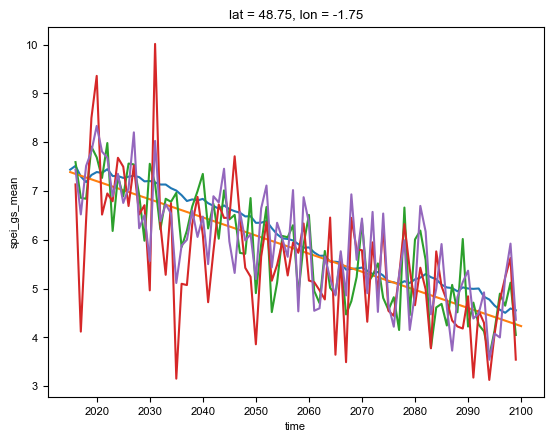

In [83]:
expect_yield[:,82,356].plot()
expect_yield1[:,82,356].plot()
yied[:,82,356].plot()
(ssi[:,82,356]*4+7).plot()
(spei[:,82,356]*2+8).plot()

In [3]:
result_dict2=result_dict3

Processing SSPs:   0%|          | 0/3 [00:00<?, ?it/s]

Processing Crops:   0%|          | 0/3 [00:00<?, ?it/s]

Processing Crops:   0%|          | 0/3 [00:00<?, ?it/s]

Processing Crops:   0%|          | 0/3 [00:00<?, ?it/s]

Processing SSPs:   0%|          | 0/3 [00:00<?, ?it/s]

Processing Crops:   0%|          | 0/3 [00:00<?, ?it/s]

Processing Crops:   0%|          | 0/3 [00:00<?, ?it/s]

default mai historical -> R²: 0.981, RMSE: 0.951
default soy historical -> R²: 0.972, RMSE: 1.326
default whe historical -> R²: 0.974, RMSE: 2.241


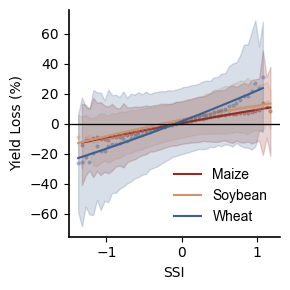

default mai ssp126 -> R²: 0.947, RMSE: 1.481
default soy ssp126 -> R²: 0.940, RMSE: 1.175
default whe ssp126 -> R²: 0.957, RMSE: 1.359


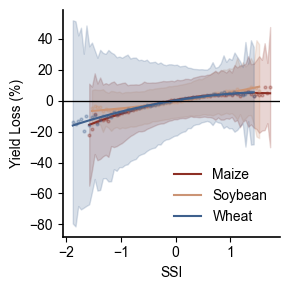

default mai ssp585 -> R²: 0.906, RMSE: 1.553
default soy ssp585 -> R²: 0.912, RMSE: 1.408
default whe ssp585 -> R²: 0.838, RMSE: 2.683


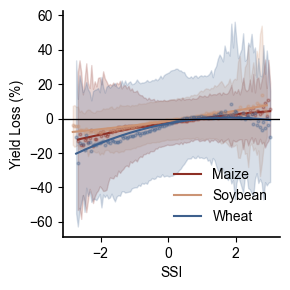

In [11]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib as mpl
from tqdm.notebook import tqdm
from numpy.polynomial import Polynomial
from scipy.optimize import curve_fit
from sklearn.metrics import r2_score, mean_squared_error
# =======================
# 参数设置
exps = ['default','2015co2']
ssps = ['historical', 'ssp126', 'ssp585']
crops = ['mai','soy','whe']

ssi_bins = np.arange(-3, 3.1, 0.05)  # 干旱指数分箱

# ----------------------
# 生成干旱指数 bin 的产量损失统计（百分比）
def analyze_drought_bins(result_dict1, result_dict2, min_count=0):
    results = {}
    for exp in exps:
        results[exp] = {}
        for ssp in tqdm(ssps, desc='Processing SSPs'):
            if exp =='2015co2' and ssp=='historical':
                continue
            results[exp][ssp] = {}
            idx = 33 if ssp=='historical' else 30
            
            for crop in tqdm(crops, desc='Processing Crops', leave=False):
                dominant_type = xr.open_dataset(
                    rf"D:\AAUDE\paper\paper8\data\PCMCI\dominant_type_{crop}_{ssp}_default.nc"
                ).spei_to_yield_strength
                
                expect_yield = result_dict2[exp][ssp][crop]['expect_yield'][-idx:]
                yied = result_dict1[exp][ssp][crop]['yield'][-idx:]
                yied = yied.where(yied>0)
                
                # 转换为百分比
                yield_loss = (yied - expect_yield) / expect_yield * 100
                
                ssi = result_dict1[exp][ssp][crop]['ssi'][-idx:]
                
                mask = (abs(yield_loss) < 300)# & ((dominant_type==2)|(dominant_type==3))  # 放大到百分比
                ssi = ssi.where(mask)
                yield_loss = yield_loss.where(mask)
                
                bin_centers = []
                yield_mean = []
                yield_std = []
                count = []
                
                for i in range(len(ssi_bins)-1):
                    lower, upper = ssi_bins[i], ssi_bins[i+1]
                    di_mask = ((ssi>=lower) & (ssi<upper)).values
                    yl_values = yield_loss.values
                    if np.any(di_mask):
                        yl_bin = yl_values[di_mask]
                        yl_bin = yl_bin[~np.isnan(yl_bin)]
                        bin_centers.append((lower+upper)/2)
                        yield_mean.append(np.mean(yl_bin) if len(yl_bin)>0 else np.nan)
                        yield_std.append(np.std(yl_bin) if len(yl_bin)>0 else np.nan)
                        count.append(len(yl_bin))
                    else:
                        bin_centers.append((lower+upper)/2)
                        yield_mean.append(np.nan)
                        yield_std.append(np.nan)
                        count.append(0)
                
                results[exp][ssp][crop] = {
                    'bins': np.array(bin_centers),
                    'yield_mean': np.array(yield_mean),
                    'yield_std': np.array(yield_std),
                    'count': np.array(count)
                }
    return results
crop_color={
    'mai':"#8d2f25",
    'soy':"#cb9475",
    'whe':"#3e608d"
}
cropname={
    'mai':"Maize",
    'soy':"Soybean",
    'whe':"Wheat"
}
# ----------------------
def drought_index_to_yield(results, exp, crop, ssp, min_count=200):
    data = results[exp][ssp][crop]
    mask = data['count'] >= min_count
    return data['bins'][mask], data['yield_mean'][mask], data['yield_std'][mask]
def plot_drought_yield_curve_polyfit(results, exp, crops, ssp, min_count=10):
    fig, ax = plt.subplots(figsize=(3,3))
    for crop in crops:
        
        mpl.rcParams['pdf.fonttype'] = 42
        plt.rcParams["font.family"] = "Arial"
        
        bin_centers, yield_mean, yield_std = drought_index_to_yield(results, exp, crop, ssp, min_count=min_count)
        
        # 原始均值 + 阴影
        ax.plot(bin_centers, yield_mean, 'o',color=crop_color[crop], markersize=2, alpha=0.3)
        ax.fill_between(bin_centers, yield_mean - yield_std, yield_mean + yield_std,color=crop_color[crop], alpha=0.2)
        
        # 二次多项式拟合
        mask = ~np.isnan(yield_mean)
        if np.sum(mask) > 2:
            p = np.polyfit(bin_centers[mask], yield_mean[mask], deg=2)
            x_fit = np.linspace(bin_centers[mask].min(), bin_centers[mask].max(), 2000)
            y_fit = np.polyval(p, x_fit)
            
            
            # 拟合优度
            y_pred = np.polyval(p, bin_centers[mask])
            r2 = r2_score(yield_mean[mask], y_pred)
            rmse = np.sqrt(mean_squared_error(yield_mean[mask], y_pred))
            print(f'{exp} {crop} {ssp} -> R²: {r2:.3f}, RMSE: {rmse:.3f}')
            ax.plot(x_fit, y_fit, label=f'{cropname[crop]}',color=crop_color[crop])
        # if ssp=='historical':
        #     ax.set_ylim(-50, 50)
        #     ax.set_xlim(-1.3, 1.3)
        
        ax.axhline(0, color='black', linewidth=0.8)
        # ax.axvline(-0.42, color='gray', linestyle='--', alpha=0.7)
        ax.set_xlabel('SSI')
        ax.set_ylabel('Yield Loss (%)')
        
        # 去掉上边框和右边框
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_linewidth(1.2)
        ax.spines['bottom'].set_linewidth(1.2)
        # 可选图例
        ax.legend(frameon=False, loc='lower right')
        
    plt.tight_layout()
    # plt.savefig(rf'D:\AAUDE\paper\paper8\manu\fig\historical_impact\conda_{ssp}_{exp}_all.pdf', dpi=300, bbox_inches='tight')
    plt.show()


# 调用示例
results = analyze_drought_bins(result_dict1, result_dict3)
for ssp in ssps:
    plot_drought_yield_curve_polyfit(results, 'default', crops, ssp, min_count=50)

In [96]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
# 作物信息
crops = ['mai','soy','whe']
cropname = {'mai':"Maize",'soy':"Soybean",'whe':"Wheat"}
color = {'Drought':"#8d2f25",'Mild Drought':"#cb9475",'Moderate Drought':"#3e608d",'Severe Drought':"#8cbf87"}

# 干旱等级阈值
thresholds = [-0.42, -0.54, -0.69]
severity_labels = ['Drought', 'Mild Drought', 'Moderate Drought', 'Severe Drought']
def re():
    results = {}
    for exp in exps:
        results[exp] = {}
        for ssp in tqdm(ssps, desc='Processing SSPs'):
            if exp == '2015co2' and ssp == 'historical':
                continue
            results[exp][ssp] = {}
            idx = 33 if ssp == 'historical' else 30  # 时间长度
    
            for crop in tqdm(crops, desc='Processing Crops', leave=False):
                # 加载主导类型数据
                dominant_type = xr.open_dataset(
                    rf"D:\AAUDE\paper\paper8\data\PCMCI\dominant_type_{crop}_{ssp}_default.nc"
                ).spei_to_yield_strength
    
                # 准备产量数据
                expect_yield = result_dict2[exp][ssp][crop]['expect_yield'][-idx-1:-1]
                yied = result_dict1[exp][ssp][crop]['yield'][-idx:]
                yied = yied.where(yied > 0)
    
                # 计算产量损失（百分比）
                yield_loss = (yied - expect_yield) / expect_yield * 100
    
                # 获取干旱指数数据（SSI）
                ssi = result_dict1[exp][ssp][crop]['ssi'][-idx:]
    
                # 筛选条件：绝对值<100% & 主导类型为0或1
                mask = (abs(yield_loss) < 100) #& ((dominant_type == 0) | (dominant_type == 1))
                ssi = ssi.where(mask)
                yield_loss = yield_loss.where(mask)
    
                # 保存到 results，转换为 numpy 数组方便绘图
                results[exp][ssp][crop] = {
                    'yield_loss': yield_loss.values,
                    'ssi': ssi.values
                }
    return results
results=re()


Processing SSPs:   0%|          | 0/3 [00:00<?, ?it/s]

Processing Crops:   0%|          | 0/3 [00:00<?, ?it/s]

Processing Crops:   0%|          | 0/3 [00:00<?, ?it/s]

Processing Crops:   0%|          | 0/3 [00:00<?, ?it/s]

Processing SSPs:   0%|          | 0/3 [00:00<?, ?it/s]

Processing Crops:   0%|          | 0/3 [00:00<?, ?it/s]

Processing Crops:   0%|          | 0/3 [00:00<?, ?it/s]

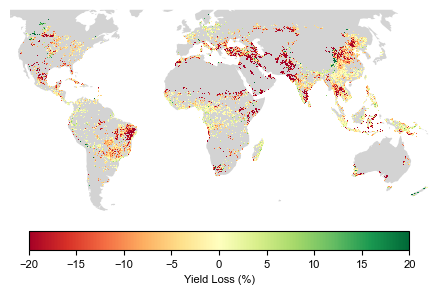

In [15]:
import matplotlib as mpl
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
def draw_dominant(dominant_type,vmax,vmin,save_path):
    # 将0值替换为NaN，这样就不会显示
    dominant_type = dominant_type.where(dominant_type != 0)

    # 绘图
    fig = plt.figure(figsize=(5,3))
    mpl.rcParams['pdf.fonttype'] = 42
    plt.rcParams["font.family"] = "Arial"
    plt.rcParams["font.size"] = 8

    # ax = plt.axes(projection=ccrs.PlateCarree())
    ax = plt.axes(projection=ccrs.Robinson())
    ax.set_extent([-120, 160, -60, 65], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor='lightgray')
    # ax.coastlines(linewidth=0.5)
    # ax.add_feature(cfeature.BORDERS, linewidth=0.3)
    ax.spines['geo'].set_visible(False)
    
    # 绘制处理后的数据（已去除0值）
    im = plt.pcolormesh(dominant_type.lon, dominant_type.lat, dominant_type,vmax=vmax,vmin=vmin,
                        cmap='RdYlGn', transform=ccrs.PlateCarree())
    

    ax.set_aspect(1)
    cbar = ax.figure.colorbar(im, ax=ax, orientation='horizontal',shrink=0.8, pad=0.05)
    cbar.set_label('Yield Loss (%)')
    
    plt.tight_layout()
    # plt.savefig(
    #     save_path,
    #     format='pdf',
    #     bbox_inches='tight',
    #     dpi=300,
    # )
    plt.show()

draw_dominant(((mild+moderate+weight)*10),20,-20,rf'D:\AAUDE\paper\paper8\manu\fig\historical_impact\spatial_distribuction_{crop}_historical.pdf')


In [ ]:
['#f4a582', '#92c5de', '#ca0020']

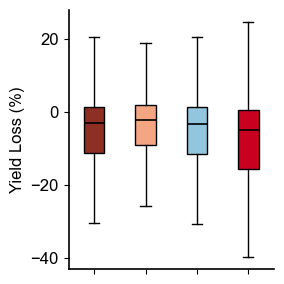

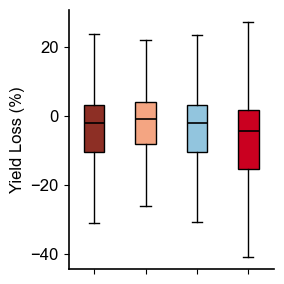

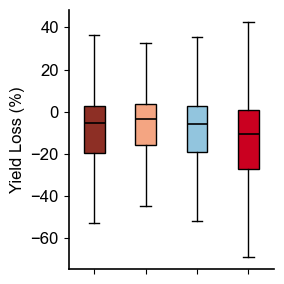

In [103]:
import numpy as np
import matplotlib.pyplot as plt

# 作物信息
crops = ['mai','soy','whe']
cropname = {'mai':"Maize",'soy':"Soybean",'whe':"Wheat"}
severity_labels = ['Drought', 'Mild Drought', 'Moderate Drought', 'Severe Drought']
severity_color = {'Drought':"#8d2f25",'Mild Drought':"#f4a582",
                  'Moderate Drought':"#92c5de",'Severe Drought':"#ca0020"}
mpl.rcParams['pdf.fonttype'] = 42
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 12
def get_yield_by_severity_raw(yield_loss, ssi):
    drought_data = []
    drought_data.append(yield_loss[ssi <= -0.42])                     # Drought
    drought_data.append(yield_loss[(ssi <= -0.42) & (ssi > -0.54)])   # Mild
    drought_data.append(yield_loss[(ssi <= -0.54) & (ssi > -0.69)])   # Moderate
    drought_data.append(yield_loss[ssi <= -0.69])                     # Severe
    return drought_data

def plot_separate_yield_boxplots_severity(results, exp, ssp, crops, min_count=10, box_width=0.5):
    for crop in crops:
        fig, ax = plt.subplots(figsize=(3, 3))
        
        yield_loss = results[exp][ssp][crop]['yield_loss']
        ssi = results[exp][ssp][crop]['ssi']
        
        valid = ~np.isnan(yield_loss)
        yield_loss = yield_loss[valid]
        ssi = ssi[valid]
        
        drought_data = get_yield_by_severity_raw(yield_loss, ssi)
        # Filter out categories with insufficient data
        filtered_data = []
        filtered_labels = []
        filtered_colors = []
        
        for i in range(len(drought_data)):
            if len(drought_data[i]) >= min_count:
                filtered_data.append(drought_data[i])
                filtered_labels.append(severity_labels[i])
                filtered_colors.append(severity_color[severity_labels[i]])
        
        if not filtered_data:  # Skip if no data meets the minimum count
            plt.close(fig)
            continue
        
        # Positions for the boxes
        positions = np.arange(len(filtered_data))
        
        # 绘制箱型图
        bplot = ax.boxplot(filtered_data, positions=positions, widths=box_width,
                          medianprops=dict(linewidth=1.2, color='black'),
                          patch_artist=True, showfliers=False)
        
        # Set colors for each box
        for patch, color in zip(bplot['boxes'], filtered_colors):
            patch.set_facecolor(color)
            patch.set_alpha(1)
        
        ax.set_ylabel('Yield Loss (%)')
        # ax.set_title(f'{cropname[crop]} Yield Loss by Drought Severity')
        ax.set_xticks(positions)
        ax.set_xticklabels('', rotation=45, ha='right')
        
        # 去掉上右边框
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_linewidth(1.2)
        ax.spines['bottom'].set_linewidth(1.2)
        
        plt.tight_layout()
        # plt.savefig(rf'D:\AAUDE\paper\paper8\manu\fig\historical_impact\box_{exp}_{crop}_{ssp}.pdf', 
        #            dpi=300, bbox_inches='tight')
        plt.show()

# 调用示例
plot_separate_yield_boxplots_severity(results, 'default', 'historical', crops, min_count=100, box_width=0.4)

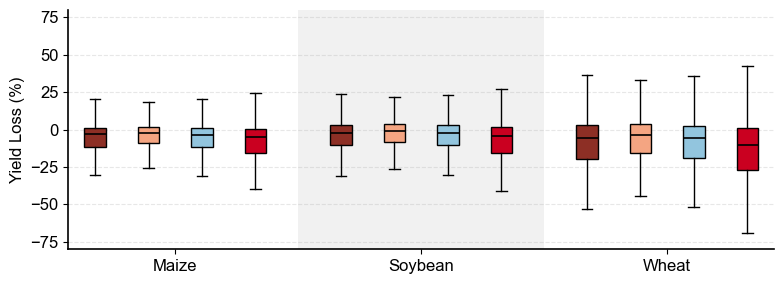

In [119]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# 作物信息
crops = ['mai','soy','whe']
cropname = {'mai':"Maize",'soy':"Soybean",'whe':"Wheat"}
severity_labels = ['Drought', 'Mild Drought', 'Moderate Drought', 'Severe Drought']
severity_color = {'Drought':"#8d2f25",'Mild Drought':"#f4a582",
                  'Moderate Drought':"#92c5de",'Severe Drought':"#ca0020"}

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 12

def get_yield_by_severity_raw(yield_loss, ssi):
    drought_data = []
    drought_data.append(yield_loss[ssi <= -0.42])                     # Drought
    drought_data.append(yield_loss[(ssi <= -0.42) & (ssi > -0.54)])   # Mild
    drought_data.append(yield_loss[(ssi <= -0.54) & (ssi > -0.69)])   # Moderate
    drought_data.append(yield_loss[ssi <= -0.69])                     # Severe
    return drought_data

def plot_combined_yield_boxplots_severity(results, exp, ssp, crops, min_count=10, box_width=0.15):
    fig, ax = plt.subplots(figsize=(8, 3))
    
    # 计算每个作物的位置
    n_severities = 4  # 4种干旱严重程度
    n_crops = len(crops)
    group_width = 0.6  # 每组作物的总宽度
    spacing = 0.6      # 组间间距
    
    positions = []
    crop_positions = []
    crop_labels = []
    
    # 为中间作物添加背景阴影
    if n_crops >= 2:
        middle_crop_start = n_severities - 0.5 + spacing/2
        middle_crop_end = middle_crop_start + n_severities + spacing
        rect = patches.Rectangle((middle_crop_start, -100), n_severities + spacing, 200, 
                               linewidth=0, edgecolor='none', facecolor='lightgray', alpha=0.3)
        ax.add_patch(rect)
    
    # 计算每个箱线图的位置
    for crop_idx, crop in enumerate(crops):
        crop_start_pos = crop_idx * (n_severities + spacing)
        crop_positions.append(crop_start_pos + n_severities/2 - 0.5)
        crop_labels.append(cropname[crop])
        
        for severity_idx in range(n_severities):
            positions.append(crop_start_pos + severity_idx)
    
    # 收集所有数据
    all_data = []
    all_colors = []
    all_labels = []
    
    for crop in crops:
        yield_loss = results[exp][ssp][crop]['yield_loss']
        ssi = results[exp][ssp][crop]['ssi']
        
        valid = ~np.isnan(yield_loss)
        yield_loss = yield_loss[valid]
        ssi = ssi[valid]
        
        drought_data = get_yield_by_severity_raw(yield_loss, ssi)
        
        for i in range(len(drought_data)):
            if len(drought_data[i]) >= min_count:
                all_data.append(drought_data[i])
                all_colors.append(severity_color[severity_labels[i]])
                all_labels.append(f'{cropname[crop]}\n{severity_labels[i]}')
            else:
                # 如果数据不足，添加空数组
                all_data.append(np.array([]))
                all_colors.append(severity_color[severity_labels[i]])
                all_labels.append('')
    
    # 绘制箱线图
    bplot = ax.boxplot(all_data, positions=positions, widths=box_width,
                      medianprops=dict(linewidth=1.2, color='black'),
                      patch_artist=True, showfliers=False)
    
    # 设置每个箱子的颜色
    for patch, color in zip(bplot['boxes'], all_colors):
        patch.set_facecolor(color)
        patch.set_alpha(1)
    
    # 设置x轴标签
    ax.set_xticks(crop_positions)
    ax.set_xticklabels(crop_labels, fontsize=12)
    
    # 添加干旱严重程度的图例
    from matplotlib.patches import Patch
    legend_elements = [Patch(facecolor=severity_color[label], label=label) 
                      for label in severity_labels]
    # ax.legend(handles=legend_elements, loc='upper right', frameon=False)
    
    ax.set_ylabel('Yield Loss (%)', fontsize=12)
    # ax.set_title(f'Yield Loss by Crop and Drought Severity ({exp} - {ssp})', fontsize=14)
    
    # 设置y轴范围
    y_min = min([np.min(data) for data in all_data if len(data) > 0])
    y_max = max([np.max(data) for data in all_data if len(data) > 0])
    ax.set_ylim(y_min - 5, y_max + 5)
    
    # 去掉上右边框
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_linewidth(1.2)
    ax.spines['bottom'].set_linewidth(1.2)
    
    # 添加网格线
    ax.grid(True, axis='y', linestyle='--', alpha=0.3)
    ax.set_ylim(-80,80)
    plt.tight_layout()
    plt.savefig(rf'D:\AAUDE\paper\paper8\manu\fig\historical_impact\box_{exp}_{ssp}.pdf', 
                   dpi=300, bbox_inches='tight')
    plt.show()

# 调用示例
plot_combined_yield_boxplots_severity(results, 'default', 'historical', crops, min_count=100, box_width=0.4)

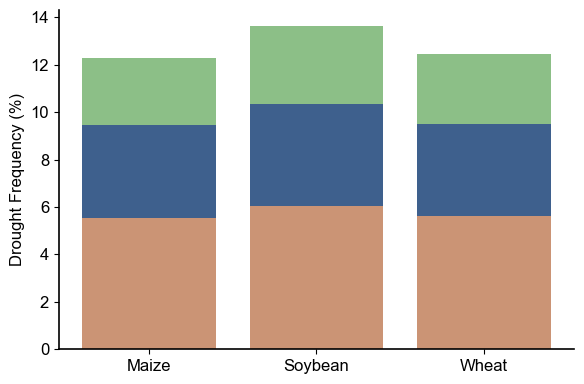

In [98]:
import numpy as np
import matplotlib.pyplot as plt

# 作物信息
crops = ['mai','soy','whe']
cropname = {'mai':"Maize",'soy':"Soybean",'whe':"Wheat"}
severity_labels = ['Mild Drought', 'Moderate Drought', 'Severe Drought']
severity_thresholds = [-0.42, -0.54, -0.69]  # SSI阈值
severity_color = {'Mild Drought':"#cb9475",'Moderate Drought':"#3e608d",'Severe Drought':"#8cbf87"}

def get_drought_frequency(ssi):
    """
    返回每种干旱等级的频率百分比（Mild / Moderate / Severe）
    """
    ssi = np.array(ssi)
    freq = []
    total = np.sum(~np.isnan(ssi))
    if total == 0:
        return [0, 0, 0]
    mild = np.sum((ssi <= -0.42) & (ssi > -0.54)) / total * 100
    moderate = np.sum((ssi <= -0.54) & (ssi > -0.69)) / total * 100
    severe = np.sum(ssi <= -0.69) / total * 100
    return [mild, moderate, severe]

def plot_drought_frequency_stack(results, exp, ssp, crops):
    # 计算每种作物频率
    freq_data = []
    for crop in crops:
        ssi = results[exp][ssp][crop]['ssi']
        valid = ~np.isnan(ssi)
        ssi = ssi[valid]
        freq_data.append(get_drought_frequency(ssi))
    
    freq_data = np.array(freq_data)  # shape: (n_crops, 3)
    
    # 绘制堆叠柱状图
    fig, ax = plt.subplots(figsize=(6,4))
    x = np.arange(len(crops))
    
    bottom = np.zeros(len(crops))
    for i, label in enumerate(severity_labels):
        ax.bar(x, freq_data[:, i], bottom=bottom, color=severity_color[label], label=label)
        bottom += freq_data[:, i]
    
    ax.set_xticks(x)
    ax.set_xticklabels([cropname[c] for c in crops])
    ax.set_ylabel('Drought Frequency (%)')
    # ax.set_ylim(0, 100)
    # ax.legend(title='Drought Severity')
    
    # 去掉上右边框
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_linewidth(1.2)
    ax.spines['bottom'].set_linewidth(1.2)
    
    plt.tight_layout()
    plt.show()

# 调用示例
plot_drought_frequency_stack(results, 'default', 'historical', crops)


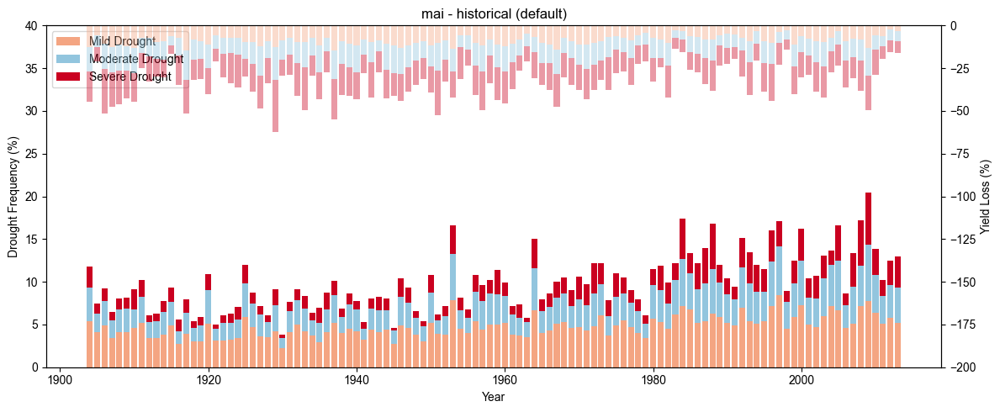

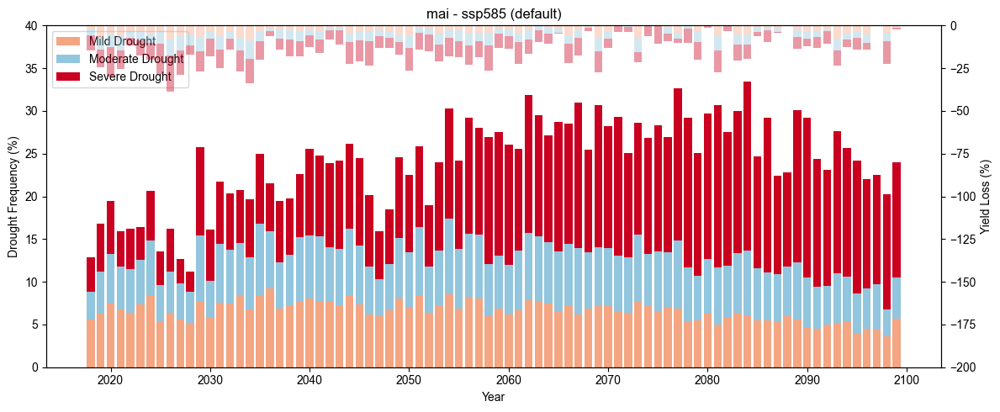

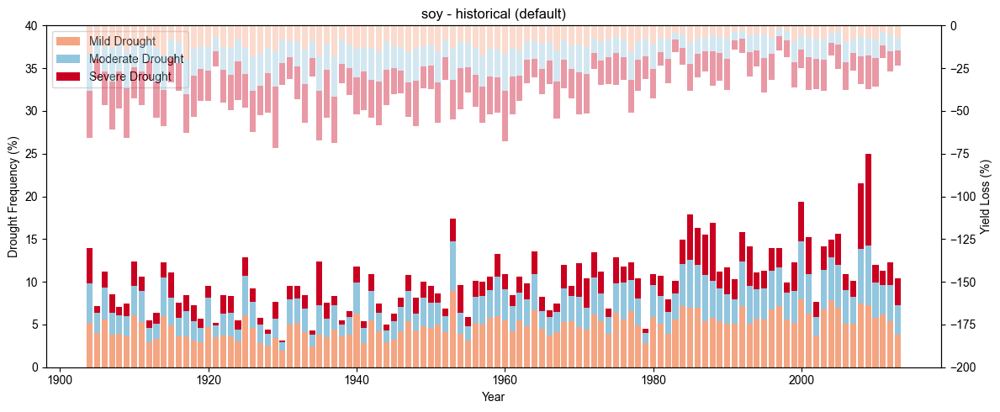

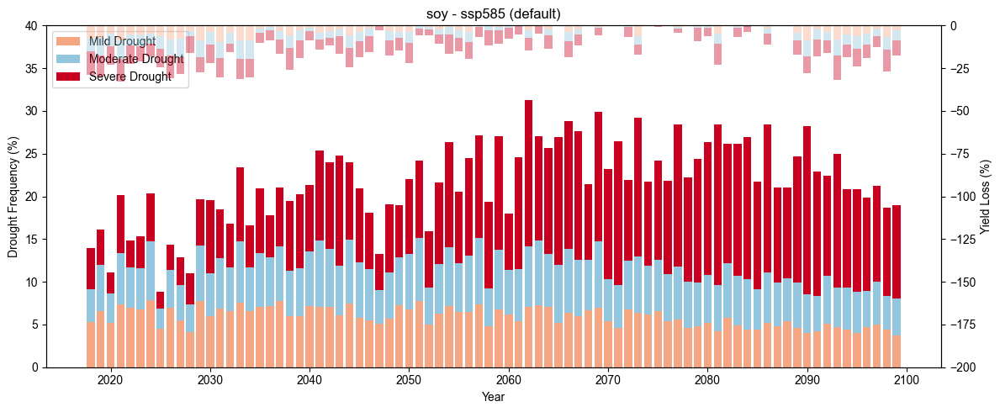

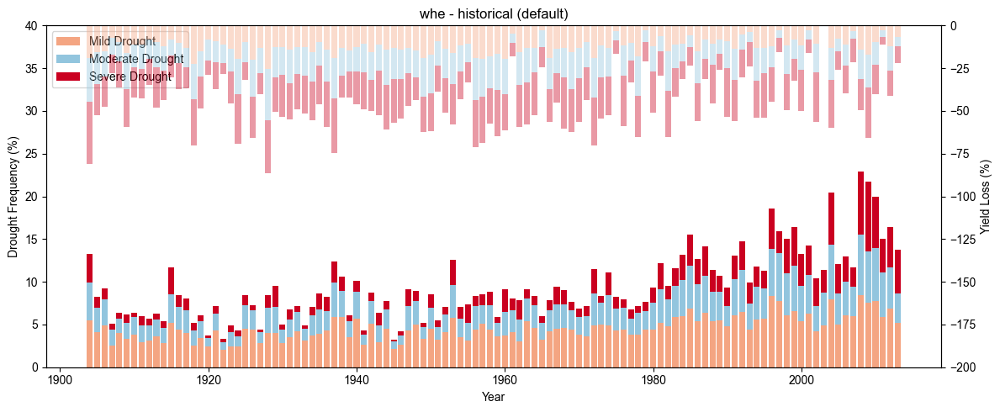

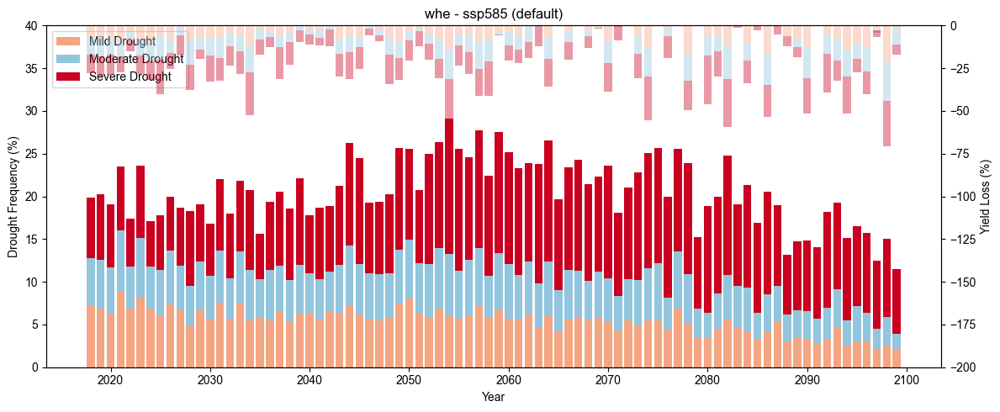

In [141]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr

# 干旱等级颜色
severity_colors = ['#f4a582', '#92c5de', '#ca0020']  # Mild, Moderate, Severe
severity_labels = ['Mild Drought', 'Moderate Drought', 'Severe Drought']

def plot_drought_frequency_and_loss_stack(results, exp, ss, crop):
    for ssp in ss:
        yield_loss = results[exp][ssp][crop]['yield_loss']
        ssi = results[exp][ssp][crop]['ssi']
        
        # 干旱频率
        mild_freq = ((ssi <= -0.42) & (ssi > -0.54)).sum(dim=['lat','lon']) / ssi.count(dim=['lat','lon']) * 100
        moderate_freq = ((ssi <= -0.54) & (ssi > -0.69)).sum(dim=['lat','lon']) / ssi.count(dim=['lat','lon']) * 100
        severe_freq = (ssi <= -0.69).sum(dim=['lat','lon']) / ssi.count(dim=['lat','lon']) * 100
        
        # 干旱条件下的产量损失
        mild_loss = yield_loss.where((ssi <= -0.42) & (ssi > -0.54)).mean(dim=['lat','lon'])
        moderate_loss = yield_loss.where((ssi <= -0.54) & (ssi > -0.69)).mean(dim=['lat','lon'])
        severe_loss = yield_loss.where(ssi <= -0.69).mean(dim=['lat','lon'])
        
        time = ssi.time.dt.year
        
        fig, ax1 = plt.subplots(figsize=(12,5))
        
        # 左侧 y 轴：干旱频率堆叠
        ax1.bar(time, mild_freq, color=severity_colors[0], label=severity_labels[0])
        ax1.bar(time, moderate_freq, bottom=mild_freq, color=severity_colors[1], label=severity_labels[1])
        ax1.bar(time, severe_freq, bottom=mild_freq+moderate_freq, color=severity_colors[2], label=severity_labels[2])
        ax1.set_ylabel('Drought Frequency (%)')
        ax1.set_xlabel('Year')
        
        # 右侧 y 轴：产量损失堆叠
        ax2 = ax1.twinx()
        ax2.bar(time, mild_loss, color=severity_colors[0], alpha=0.4)
        ax2.bar(time, moderate_loss, bottom=mild_loss, color=severity_colors[1], alpha=0.4)
        ax2.bar(time, severe_loss, bottom=mild_loss+moderate_loss, color=severity_colors[2], alpha=0.4)
        ax2.set_ylabel('Yield Loss (%)')
        ax2.xaxis.set_label_position('top')
        ax2.xaxis.tick_top()
        ax2.set_ylim(-200,0)
        ax1.set_ylim(0,40)
        # 图例（只用左轴的标签，颜色对应一致）
        ax1.legend(loc='upper left')
        
        plt.title(f'{crop} - {ssp} ({exp})')
        plt.tight_layout()
        plt.show()

# 调用
for crop in crops:
    ss = ['historical', 'ssp585']
    plot_drought_frequency_and_loss_stack(results, 'default', ss, crop)


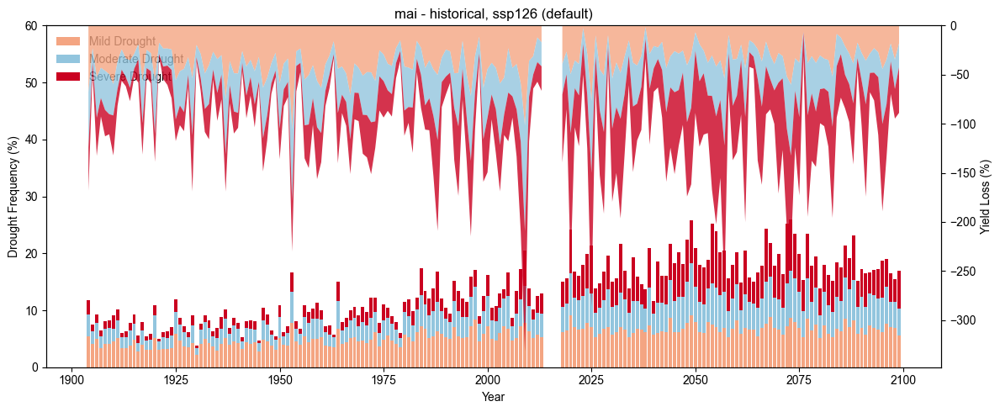

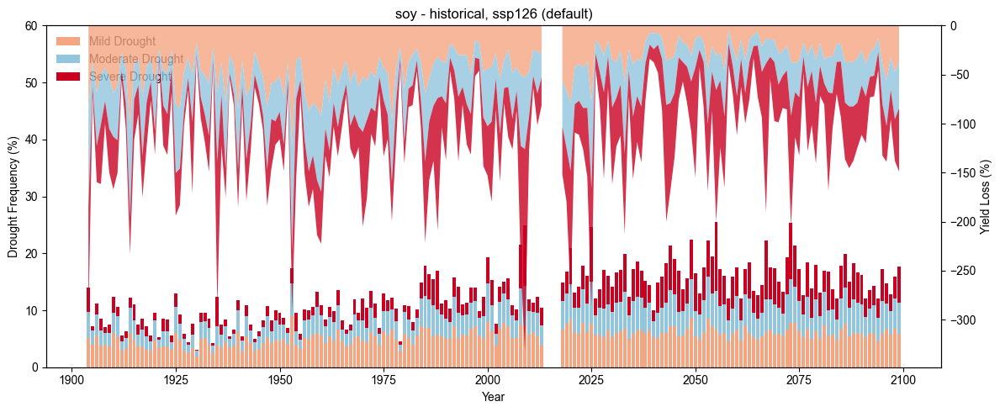

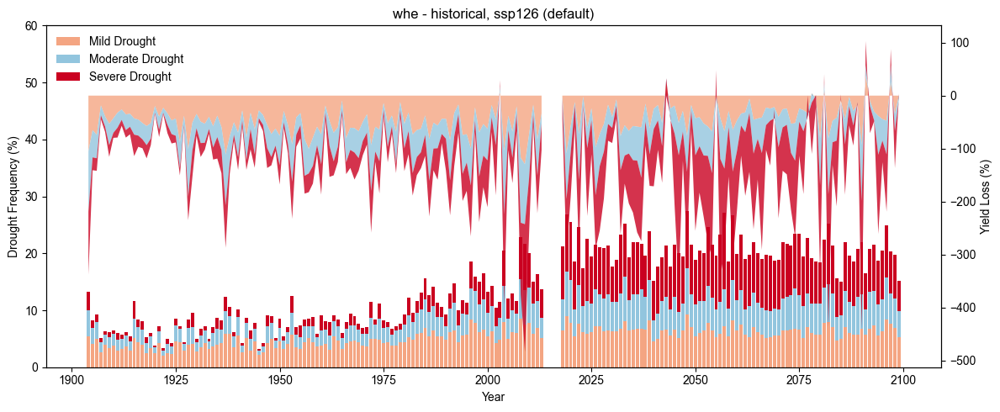

In [190]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr

# 干旱等级颜色
severity_colors = ['#f4a582', '#92c5de', '#ca0020']  # Mild, Moderate, Severe
severity_labels = ['Mild Drought', 'Moderate Drought', 'Severe Drought']

def plot_drought_frequency_and_loss_stack(results, exp, ss, crop):
    fig, ax1 = plt.subplots(figsize=(12,5))
    ax2 = ax1.twinx()
    
    for idx, ssp in enumerate(ss):
        if ssp=='ssp585':
            exp='2015co2'
        yield_loss = results[exp][ssp][crop]['yield_loss']
        ssi = results[exp][ssp][crop]['ssi']
        
        # 干旱频率
        mild_freq = ((ssi <= -0.42) & (ssi > -0.54)).sum(dim=['lat','lon']) / ssi.count(dim=['lat','lon']) * 100
        moderate_freq = ((ssi <= -0.54) & (ssi > -0.69)).sum(dim=['lat','lon']) / ssi.count(dim=['lat','lon']) * 100
        severe_freq = (ssi <= -0.69).sum(dim=['lat','lon']) / ssi.count(dim=['lat','lon']) * 100
        
        # 干旱条件下的产量损失
        mild_loss = yield_loss.where((ssi <= -0.42) & (ssi > -0.54)).sum(dim=['lat','lon'])/ ssi.count(dim=['lat','lon']) * 100
        moderate_loss = yield_loss.where((ssi <= -0.54) & (ssi > -0.69)).sum(dim=['lat','lon'])/ ssi.count(dim=['lat','lon']) * 100
        severe_loss = yield_loss.where(ssi <= -0.69).sum(dim=['lat','lon'])/ ssi.count(dim=['lat','lon']) * 100
        
        years = ssi.time.dt.year.values
        
        # 左轴：干旱频率柱状堆叠
        ax1.bar(years, mild_freq, color=severity_colors[0], label=severity_labels[0] if idx == 0 else "")
        ax1.bar(years, moderate_freq, bottom=mild_freq, color=severity_colors[1], label=severity_labels[1] if idx == 0 else "")
        ax1.bar(years, severe_freq, bottom=mild_freq+moderate_freq, color=severity_colors[2], label=severity_labels[2] if idx == 0 else "")
        
        # 右轴：产量损失堆叠面积
        ax2.stackplot(
            years,
            mild_loss,
            moderate_loss,
            severe_loss,
            # labels=[f'{ssp} Mild Loss', f'{ssp} Moderate Loss', f'{ssp} Severe Loss'],
            colors=severity_colors,
            alpha=0.8
        )
    
    ax1.set_ylabel('Drought Frequency (%)')
    ax1.set_xlabel('Year')
    ax1.set_ylim(0, 60)
    
    ax2.set_ylabel('Yield Loss (%)')
    # ax2.set_ylim(-40000, 0)
    ax2.xaxis.set_label_position('top')
    ax2.xaxis.tick_top()
    
    ax1.legend(frameon=False,loc='upper left')
    # ax2.legend(loc='upper right')
    
    plt.title(f'{crop} - {", ".join(ss)} ({exp})')
    plt.tight_layout()
    plt.show()


# 调用
for crop in crops:
    ss = ['historical', 'ssp126']
    plot_drought_frequency_and_loss_stack(results, 'default', ss, crop)

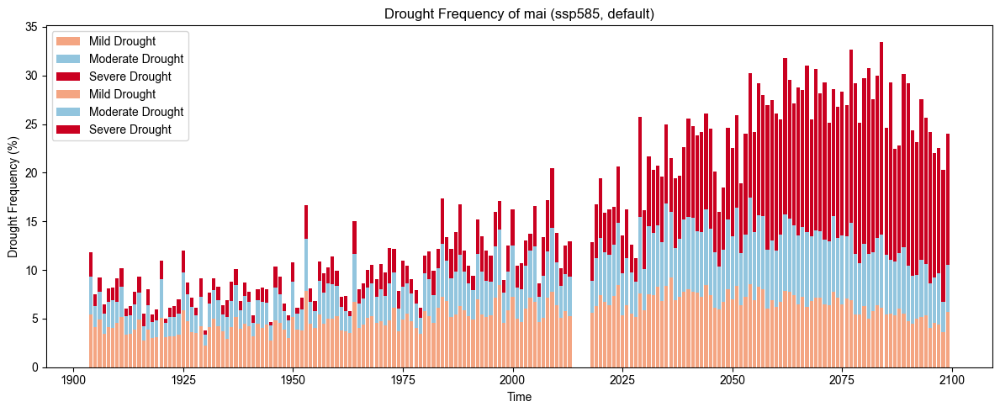

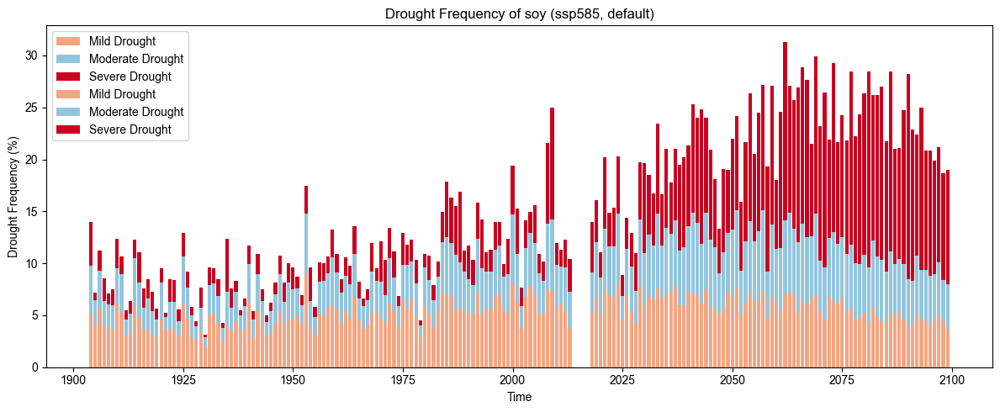

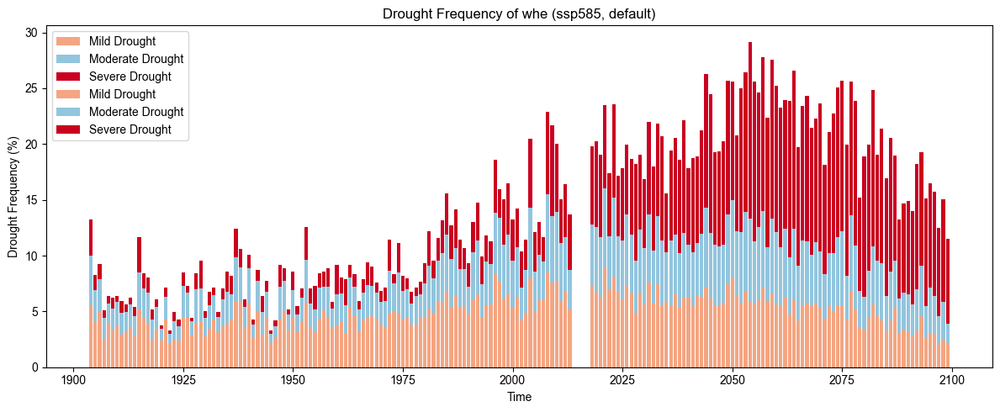

In [133]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr

# 干旱等级阈值
thresholds = [-0.42, -0.54, -0.69]
severity_labels = ['Mild', 'Moderate', 'Severe']
severity_colors = ['#f4a582', '#92c5de', '#ca0020']  # 可以根据喜好调整颜色

def plot_drought_frequency_stack(results, exp, ss, crop):
    plt.figure(figsize=(12,5))
    for ssp in ss:
        yield_loss = results[exp][ssp][crop]['yield_loss']  # xarray DataArray: time, lat, lon
        ssi = results[exp][ssp][crop]['ssi']                # xarray DataArray: time, lat, lon
    
        # 计算每个时间步三种干旱程度的网格比例
        mild_freq = ((ssi <= -0.42) & (ssi > -0.54)).sum(dim=['lat','lon']) / ssi.count(dim=['lat','lon']) * 100
        moderate_freq = ((ssi <= -0.54) & (ssi > -0.69)).sum(dim=['lat','lon']) / ssi.count(dim=['lat','lon']) * 100
        severe_freq = (ssi <= -0.69).sum(dim=['lat','lon']) / ssi.count(dim=['lat','lon']) * 100
    
        # 时间
        time = ssi.time.dt.year
    
        # 绘制堆叠柱状图
        
        plt.bar(time, mild_freq, color=severity_colors[0], label='Mild Drought')
        plt.bar(time, moderate_freq, bottom=mild_freq, color=severity_colors[1], label='Moderate Drought')
        plt.bar(time, severe_freq, bottom=mild_freq+moderate_freq, color=severity_colors[2], label='Severe Drought')
    
        plt.ylabel('Drought Frequency (%)')
        plt.xlabel('Time')
    plt.title(f'Drought Frequency of {crop} ({ssp}, {exp})')
    plt.legend()
    plt.tight_layout()
    plt.show()

# 调用示例
for crop in crops:
    ss=['historical','ssp585']
    plot_drought_frequency_stack(results, 'default', ss, crop)


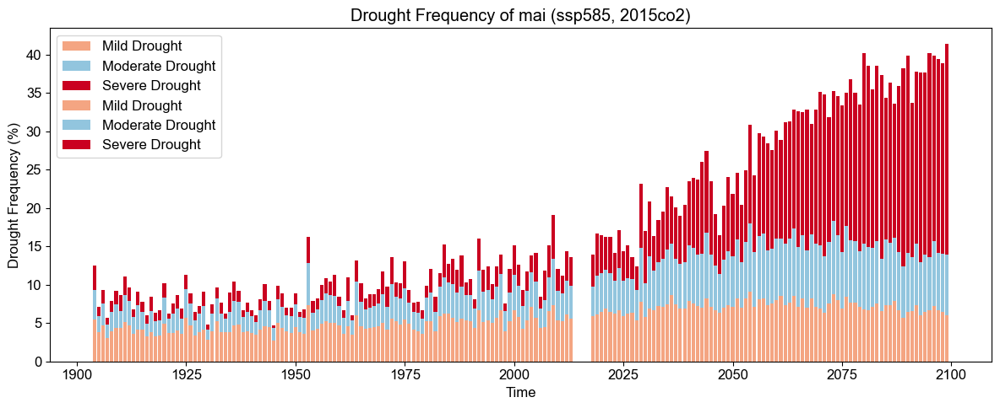

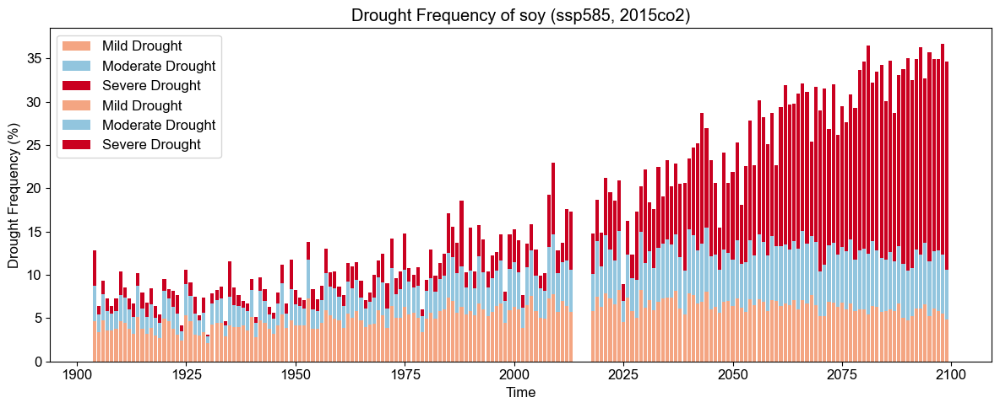

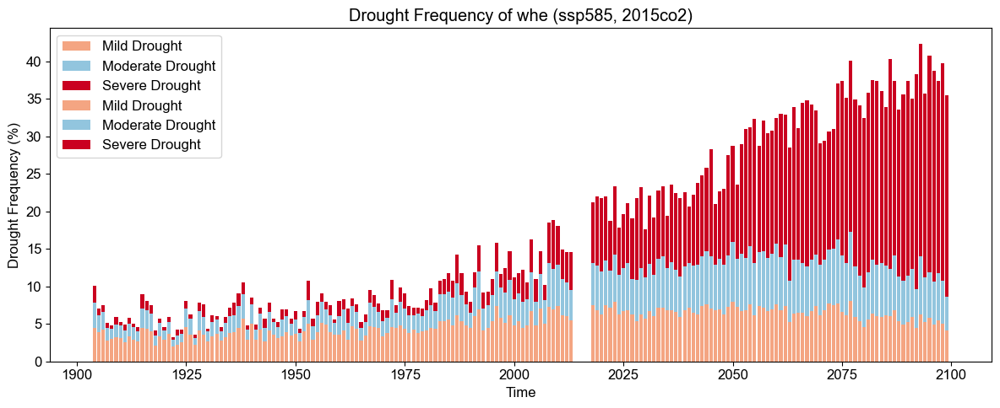

In [152]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr

# 干旱等级阈值
thresholds = [-0.42, -0.54, -0.69]
severity_labels = ['Mild', 'Moderate', 'Severe']
severity_colors = ['#f4a582', '#92c5de', '#ca0020']  # 可以根据喜好调整颜色

def plot_drought_frequency_stack(results, exp, ss, crop):
    plt.figure(figsize=(12,5))
    for ssp in ss:
        if ssp=='ssp585':
            exp='2015co2'
        yield_loss = results[exp][ssp][crop]['yield_loss']  # xarray DataArray: time, lat, lon
        ssi = results[exp][ssp][crop]['ssi']                # xarray DataArray: time, lat, lon
    
        # 计算每个时间步三种干旱程度的网格比例
        mild_freq = ((ssi <= -0.42) & (ssi > -0.54)).sum(dim=['lat','lon']) / ssi.count(dim=['lat','lon']) * 100
        moderate_freq = ((ssi <= -0.54) & (ssi > -0.69)).sum(dim=['lat','lon']) / ssi.count(dim=['lat','lon']) * 100
        severe_freq = (ssi <= -0.69).sum(dim=['lat','lon']) / ssi.count(dim=['lat','lon']) * 100
    
        # 时间
        time = ssi.time.dt.year
    
        # 绘制堆叠柱状图
        
        plt.bar(time, mild_freq, color=severity_colors[0], label='Mild Drought')
        plt.bar(time, moderate_freq, bottom=mild_freq, color=severity_colors[1], label='Moderate Drought')
        plt.bar(time, severe_freq, bottom=mild_freq+moderate_freq, color=severity_colors[2], label='Severe Drought')
    
        plt.ylabel('Drought Frequency (%)')
        plt.xlabel('Time')
    plt.title(f'Drought Frequency of {crop} ({ssp}, {exp})')
    plt.legend()
    plt.tight_layout()
    plt.show()

# 调用示例
for crop in crops:
    ss=['historical','ssp585']
    plot_drought_frequency_stack(results, 'default', ss, crop)


Processing SSPs:   0%|          | 0/3 [00:00<?, ?it/s]

Processing Crops:   0%|          | 0/3 [00:00<?, ?it/s]

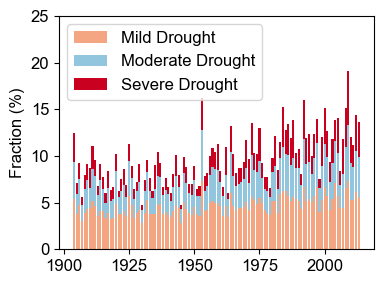

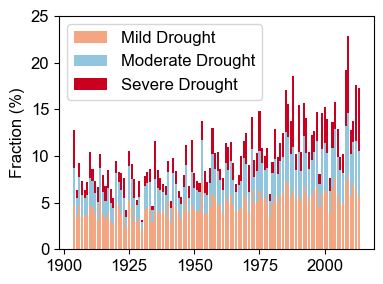

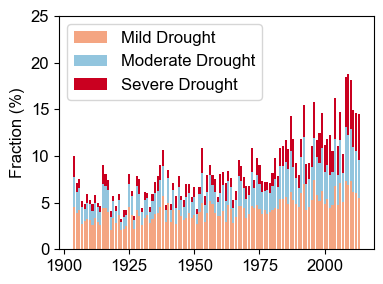

Processing Crops:   0%|          | 0/3 [00:00<?, ?it/s]

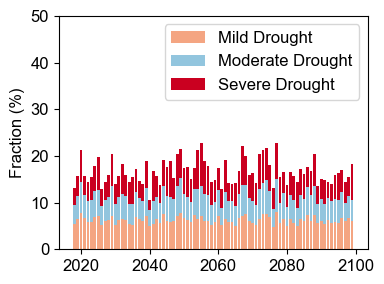

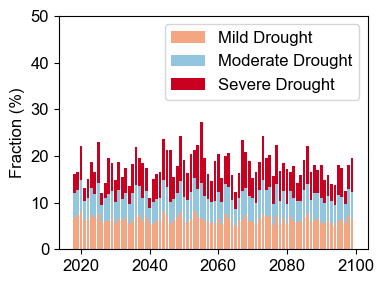

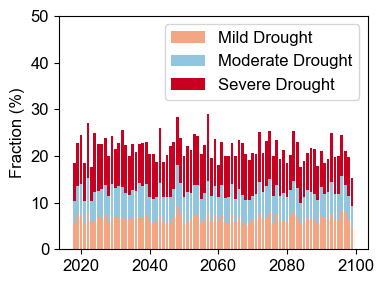

Processing Crops:   0%|          | 0/3 [00:00<?, ?it/s]

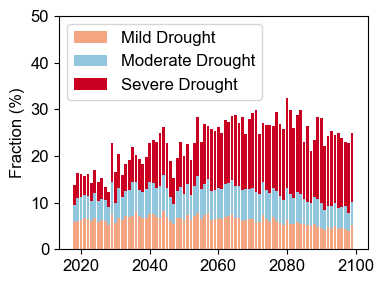

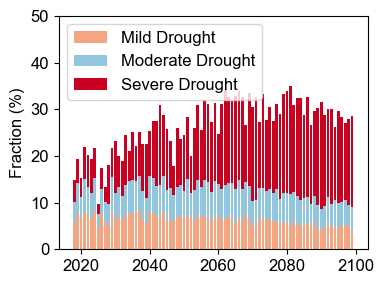

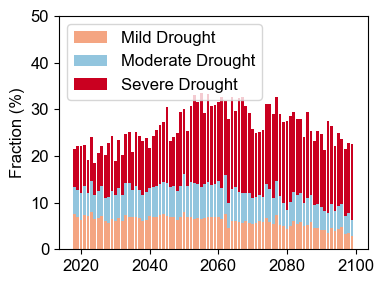

Processing SSPs:   0%|          | 0/3 [00:00<?, ?it/s]

Processing Crops:   0%|          | 0/3 [00:00<?, ?it/s]

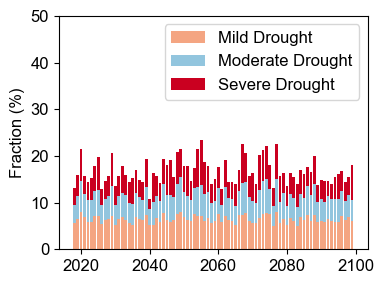

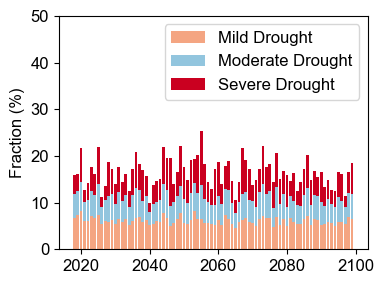

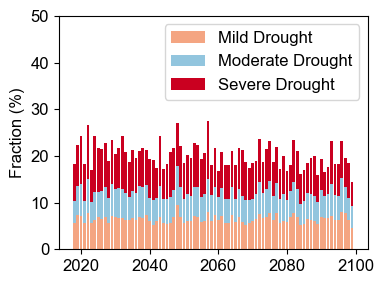

Processing Crops:   0%|          | 0/3 [00:00<?, ?it/s]

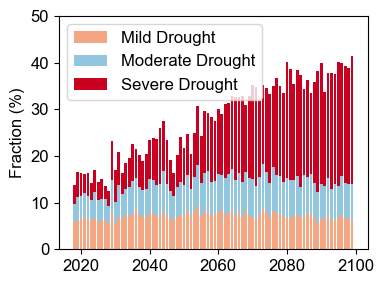

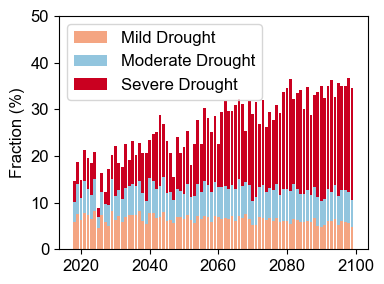

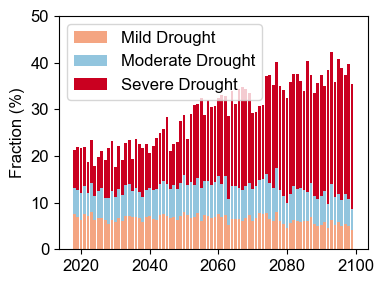

In [106]:
import matplotlib.pyplot as plt

exp = 'default'
ssp = 'historical'
crop = 'mai'
for exp in exps:
    for ssp in tqdm(ssps, desc='Processing SSPs'):
        if exp == '2015co2' and ssp == 'historical':
            continue
        for crop in tqdm(crops, desc='Processing Crops', leave=False):
            yield_loss = results[exp][ssp][crop]['yield_loss']
            ssi = results[exp][ssp][crop]['ssi']
            
            # 计算各等级干旱频率百分比
            mild_freq = ((ssi <= -0.42) & (ssi > -0.54)).sum(dim=['lat','lon']) / ssi.count(dim=['lat','lon']) * 100
            moderate_freq = ((ssi <= -0.54) & (ssi > -0.69)).sum(dim=['lat','lon']) / ssi.count(dim=['lat','lon']) * 100
            severe_freq = (ssi <= -0.69).sum(dim=['lat','lon']) / ssi.count(dim=['lat','lon']) * 100
            
            # 绘制堆叠柱状图
            plt.figure(figsize=(4,3))
            plt.bar(ssi.time.dt.year, mild_freq, color='#f4a582', label='Mild Drought')
            plt.bar(ssi.time.dt.year, moderate_freq, bottom=mild_freq, color='#92c5de', label='Moderate Drought')
            plt.bar(ssi.time.dt.year, severe_freq, bottom=mild_freq+moderate_freq, color='#ca0020', label='Severe Drought')
            if ssp=='historical':
                plt.ylim(0,25)
                plt.yticks(np.arange(0, 26, 5))
            else:
                plt.ylim(0,50)
                plt.yticks(np.arange(0, 51, 10))
            plt.ylabel('Fraction (%)')
            # plt.xlabel('Time')
            # plt.title(f'Drought Frequency of {crop} ({ssp}, {exp})')
            plt.legend()
            plt.tight_layout()
            # plt.savefig(rf'D:\AAUDE\paper\paper8\manu\fig\historical_impact\Fraction_{exp}_{crop}_{ssp}_{exp}.pdf', dpi=300, bbox_inches='tight')
            plt.show()

mai
-0.48518032332718763
whe
-0.5724618181603168
soy
-0.48803805740889905


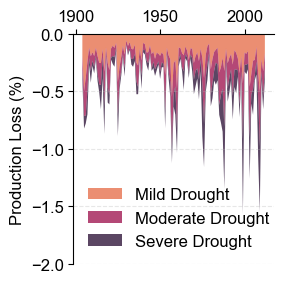

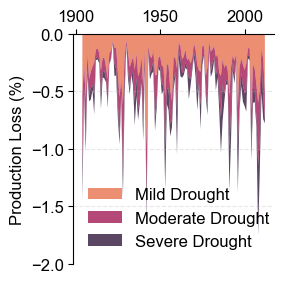

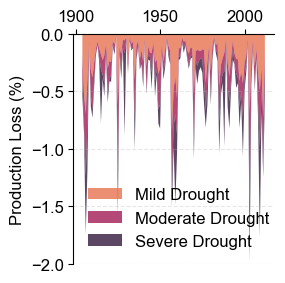

In [95]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr

# 干旱等级颜色
severity_colors = ['#e7724f', '#a21a54', '#32183c']  # Mild, Moderate, Severe
severity_labels = ['Mild Drought', 'Moderate Drought', 'Severe Drought']

def plot_yield_loss_stack(results, exp, ss, crop):
    fig, ax = plt.subplots(figsize=(3,3))
    mpl.rcParams['pdf.fonttype'] = 42
    plt.rcParams["font.family"] = "Arial"
    plt.rcParams["font.size"] = 12
    for idx, ssp in enumerate(ss):
        # if ssp == 'ssp585':
        #     exp = '2015co2'
        
        yield_loss = (results[exp][ssp][crop]['production_loss']/1e4)
        # production = /1e6
        ssi = results[exp][ssp][crop]['ssi']
        
        # 干旱区损失率
        # mild_loss = yield_loss.where((ssi <= -0.42) & (ssi > -0.54)).sum(dim=['lat','lon'])/(results[exp][ssp][crop]['production']/1e4).where((ssi <= -0.42) & (ssi > -0.54)).sum(dim=['lat','lon'])
        # moderate_loss = yield_loss.where((ssi <= -0.54) & (ssi > -0.69)).sum(dim=['lat','lon'])/(results[exp][ssp][crop]['production']/1e4).where((ssi <= -0.54) & (ssi > -0.69)).sum(dim=['lat','lon'])
        # severe_loss = yield_loss.where(ssi <= -0.69).sum(dim=['lat','lon'])/(results[exp][ssp][crop]['production']/1e4).where(ssi <= -0.69).sum(dim=['lat','lon'])
        # 全球损失率
        mild_loss = yield_loss.where((ssi <= -0.42) & (ssi > -0.54)&(yield_loss<0)).sum(dim=['lat','lon'])/(results[exp][ssp][crop]['production']/1e4).sum(dim=['lat','lon'])*100
        moderate_loss = yield_loss.where((ssi <= -0.54) & (ssi > -0.69)&(yield_loss<0)).sum(dim=['lat','lon'])/(results[exp][ssp][crop]['production']/1e4).sum(dim=['lat','lon'])*100
        severe_loss = yield_loss.where((ssi <= -0.69)&(yield_loss<0)).sum(dim=['lat','lon'])/(results[exp][ssp][crop]['production']/1e4).sum(dim=['lat','lon'])*100
        # print(mild_loss+moderate_loss+severe_loss)
        # mild_loss = yield_loss.where((ssi <= -0.42) & (ssi > -0.54)).sum(dim=['lat','lon'])
        # moderate_loss = yield_loss.where((ssi <= -0.54) & (ssi > -0.69)).sum(dim=['lat','lon'])
        # severe_loss = yield_loss.where(ssi <= -0.69).sum(dim=['lat','lon'])
        years = ssi.time.dt.year.values
        print(crop)
        # print(severe_loss[-30:].mean(dim='time').values/(mild_loss+moderate_loss+severe_loss)[-30:].mean(dim='time').values*100)
        # print(severe_loss[-30:].mean(dim='time').values)
        
        # 保留两位小数并打印
        # print(f"{mild_loss[-30:].mean(dim='time').values:.2f} ± {mild_loss[-30:].std(dim='time').values:.2f}")
        # print(f"{moderate_loss[-30:].mean(dim='time').values:.2f} ± {moderate_loss[-30:].std(dim='time').values:.2f}")
        # print(f"{severe_loss[-30:].mean(dim='time').values:.2f} ± {severe_loss[-30:].std(dim='time').values:.2f}")
        print(mild_loss.mean(dim='time').values+moderate_loss.mean(dim='time').values+severe_loss.mean(dim='time').values)
        # 绘制堆叠面积图
        ax.stackplot(
            years,
            mild_loss,
            moderate_loss,
            severe_loss,
            labels=[f'{label}' for label in severity_labels],
            colors=severity_colors,
            alpha=0.8
        )
    
    ax.set_ylabel('Yield Loss (MIlion ton)')
    ax.set_ylabel('Production Loss (%)')
    # ax.set_xlabel('Year')  # x轴在底部
    # ax.set_title(f'{crop} Yield Loss by Drought Severity ({exp})')
    
    # 添加图例
    ax.legend(frameon=False)
    
    # 美化图形
    ax.spines['bottom'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.xaxis.set_label_position('top')
    ax.xaxis.tick_top()
    ax.grid(axis='y', linestyle='--', alpha=0.3)
    ax.set_ylim(-2,0)
    plt.tight_layout()
    # plt.savefig(rf'D:\AAUDE\paper\paper8\manu\fig\historical_impact\time_yieldloss_{exp}_{crop}_{ssp}.pdf', dpi=300, bbox_inches='tight')
    # plt.show()

# 调用
for crop in crops:
    ss = ['historical']
    plot_yield_loss_stack(results, 'default', ss, crop)

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr

# 干旱等级颜色
severity_colors = ['#e7724f', '#a21a54', '#32183c']  # Mild, Moderate, Severe
severity_labels = ['Mild Drought', 'Moderate Drought', 'Severe Drought']

def plot_yield_loss_stack(results, exp, ss, crop):
    for idx, ssp in enumerate(ss):
        # if ssp == 'ssp585':
        #     exp = '2015co2'
        
        yield_loss = (results[exp][ssp][crop]['production_loss']/1e4)
        # production = /1e6
        ssi = results[exp][ssp][crop]['ssi']
        
        # 干旱区损失率
        # mild_loss = yield_loss.where((ssi <= -0.42) & (ssi > -0.54)).sum(dim=['lat','lon'])/(results[exp][ssp][crop]['production']/1e4).where((ssi <= -0.42) & (ssi > -0.54)).sum(dim=['lat','lon'])
        # moderate_loss = yield_loss.where((ssi <= -0.54) & (ssi > -0.69)).sum(dim=['lat','lon'])/(results[exp][ssp][crop]['production']/1e4).where((ssi <= -0.54) & (ssi > -0.69)).sum(dim=['lat','lon'])
        # severe_loss = yield_loss.where(ssi <= -0.69).sum(dim=['lat','lon'])/(results[exp][ssp][crop]['production']/1e4).where(ssi <= -0.69).sum(dim=['lat','lon'])
        # 全球损失率
        mild_loss = yield_loss.where((ssi <= -0.42) & (ssi > -0.54)&(yield_loss<0)).sum(dim=['lat','lon'])/(results[exp][ssp][crop]['production']/1e4).sum(dim=['lat','lon'])*100
        moderate_loss = yield_loss.where((ssi <= -0.54) & (ssi > -0.69)&(yield_loss<0)).sum(dim=['lat','lon'])/(results[exp][ssp][crop]['production']/1e4).sum(dim=['lat','lon'])*100
        severe_loss = yield_loss.where((ssi <= -0.69)&(yield_loss<0)).sum(dim=['lat','lon'])/(results[exp][ssp][crop]['production']/1e4).sum(dim=['lat','lon'])*100
        # print(mild_loss+moderate_loss+severe_loss)
        # mild_loss = yield_loss.where((ssi <= -0.42) & (ssi > -0.54)).sum(dim=['lat','lon'])
        # moderate_loss = yield_loss.where((ssi <= -0.54) & (ssi > -0.69)).sum(dim=['lat','lon'])
        # severe_loss = yield_loss.where(ssi <= -0.69).sum(dim=['lat','lon'])
        years = ssi.time.dt.year.values
        print(crop)
        # print(severe_loss[-30:].mean(dim='time').values/(mild_loss+moderate_loss+severe_loss)[-30:].mean(dim='time').values*100)
        # print(severe_loss[-30:].mean(dim='time').values)
        
        print(f"Crop: {crop}, Scenario: {ssp}, Exp: {exp}")

        if len(mild_loss) > 0:
            print(f"   Mild Drought: {np.nanmean(mild_loss):.2f} ± {np.nanstd(mild_loss):.2f}")
        else:
            print("   Mild Drought: No Data")
        
        if len(moderate_loss) > 0:
            print(f"   Moderate Drought: {np.nanmean(moderate_loss):.2f} ± {np.nanstd(moderate_loss):.2f}")
        else:
            print("   Moderate Drought: No Data")
        
        if len(severe_loss) > 0:
            print(f"   Severe Drought: {np.nanmean(severe_loss):.2f} ± {np.nanstd(severe_loss):.2f}")
        else:
            print("   Severe Drought: No Data")
        
        al=mild_loss.mean(dim='time').values+moderate_loss.mean(dim='time').values+severe_loss.mean(dim='time').values

        # print(severe_loss.mean(dim='time').values/al*100)
        print(al)
        print("-"*60)
        # 绘制堆叠面积图

# 调用
for crop in crops:
    ss = ['historical']
    plot_yield_loss_stack(results, 'default', ss, crop)
for crop in crops:
    ss = ['ssp585']
    plot_yield_loss_stack(results, 'default', ss, crop)
for crop in crops:
    ss = ['ssp585']
    plot_yield_loss_stack(results, '2015co2', ss, crop)

mai
Crop: mai, Scenario: historical, Exp: default
   Mild Drought: -0.21 ± 0.10
   Moderate Drought: -0.16 ± 0.10
   Severe Drought: -0.12 ± 0.12
-0.48518032332718763
------------------------------------------------------------
whe
Crop: whe, Scenario: historical, Exp: default
   Mild Drought: -0.28 ± 0.16
   Moderate Drought: -0.19 ± 0.12
   Severe Drought: -0.11 ± 0.10
-0.5724618181603168
------------------------------------------------------------
soy
Crop: soy, Scenario: historical, Exp: default
   Mild Drought: -0.22 ± 0.17
   Moderate Drought: -0.15 ± 0.14
   Severe Drought: -0.12 ± 0.16
-0.48803805740889905
------------------------------------------------------------
mai
Crop: mai, Scenario: ssp585, Exp: default
   Mild Drought: -0.41 ± 0.22
   Moderate Drought: -0.38 ± 0.24
   Severe Drought: -0.56 ± 0.46
-1.3548041899428003
------------------------------------------------------------
whe
Crop: whe, Scenario: ssp585, Exp: default
   Mild Drought: -0.26 ± 0.10
   Moderate Drough

Crop: mai, Scenario: historical, Exp: default
   Mild Drought: -3.88 ± 12.19
   Moderate Drought: -5.60 ± 13.55
   Severe Drought: -8.26 ± 15.31
    Drought: -8.26 ± 15.31
------------------------------------------------------------
Crop: mai, Scenario: ssp126, Exp: default
   Mild Drought: -3.78 ± 10.53
   Moderate Drought: -4.67 ± 11.18
   Severe Drought: -7.12 ± 11.66
    Drought: -7.12 ± 11.66
------------------------------------------------------------
Crop: mai, Scenario: ssp126, Exp: 2015co2
   Mild Drought: -3.53 ± 10.78
   Moderate Drought: -4.49 ± 10.88
   Severe Drought: -6.40 ± 12.22
    Drought: -6.40 ± 12.22
------------------------------------------------------------
Crop: mai, Scenario: ssp585, Exp: default
   Mild Drought: -5.37 ± 12.74
   Moderate Drought: -5.87 ± 13.05
   Severe Drought: -8.74 ± 11.09
    Drought: -8.74 ± 11.09
------------------------------------------------------------
Crop: mai, Scenario: ssp585, Exp: 2015co2
   Mild Drought: -8.24 ± 12.00
   Mode

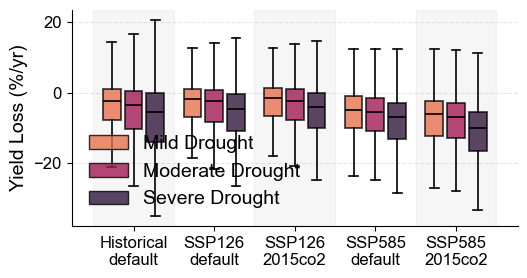

Crop: whe, Scenario: historical, Exp: default
   Mild Drought: -5.91 ± 18.49
   Moderate Drought: -8.14 ± 21.10
   Severe Drought: -12.66 ± 23.01
    Drought: -12.66 ± 23.01
------------------------------------------------------------
Crop: whe, Scenario: ssp126, Exp: default
   Mild Drought: -4.75 ± 18.79
   Moderate Drought: -6.16 ± 18.80
   Severe Drought: -9.16 ± 19.08
    Drought: -9.16 ± 19.08
------------------------------------------------------------
Crop: whe, Scenario: ssp126, Exp: 2015co2
   Mild Drought: -4.64 ± 20.46
   Moderate Drought: -5.88 ± 20.41
   Severe Drought: -8.86 ± 21.33
    Drought: -8.86 ± 21.33
------------------------------------------------------------
Crop: whe, Scenario: ssp585, Exp: default
   Mild Drought: -8.65 ± 24.39
   Moderate Drought: -10.30 ± 24.55
   Severe Drought: -14.50 ± 22.93
    Drought: -14.50 ± 22.93
------------------------------------------------------------
Crop: whe, Scenario: ssp585, Exp: 2015co2
   Mild Drought: -15.59 ± 24.64
 

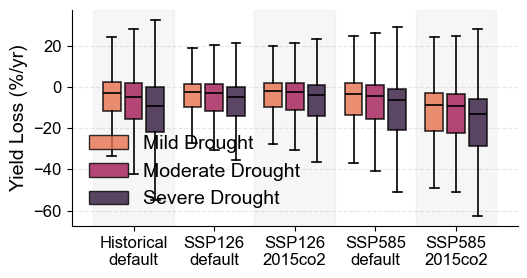

Crop: soy, Scenario: historical, Exp: default
   Mild Drought: -2.19 ± 11.01
   Moderate Drought: -3.99 ± 12.32
   Severe Drought: -7.10 ± 14.30
    Drought: -7.10 ± 14.30
------------------------------------------------------------
Crop: soy, Scenario: ssp126, Exp: default
   Mild Drought: -4.44 ± 8.43
   Moderate Drought: -5.47 ± 8.73
   Severe Drought: -7.33 ± 9.82
    Drought: -7.33 ± 9.82
------------------------------------------------------------
Crop: soy, Scenario: ssp126, Exp: 2015co2
   Mild Drought: -3.74 ± 8.54
   Moderate Drought: -4.69 ± 9.14
   Severe Drought: -6.33 ± 10.03
    Drought: -6.33 ± 10.03
------------------------------------------------------------
Crop: soy, Scenario: ssp585, Exp: default
   Mild Drought: -2.97 ± 10.65
   Moderate Drought: -3.57 ± 10.08
   Severe Drought: -6.70 ± 8.95
    Drought: -6.70 ± 8.95
------------------------------------------------------------
Crop: soy, Scenario: ssp585, Exp: 2015co2
   Mild Drought: -10.20 ± 11.08
   Moderate Dr

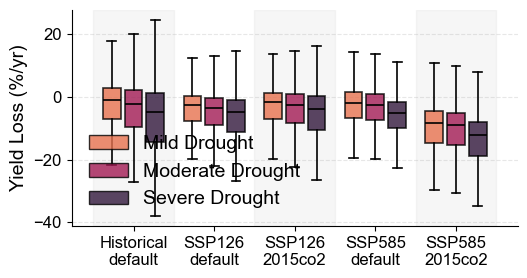

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
import matplotlib as mpl

# 设置全局样式
mpl.rcParams['pdf.fonttype'] = 42
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 12

# 干旱等级颜色和标签
severity_colors = ['#e7724f', '#a21a54', '#32183c']  # Mild, Moderate, Severe
severity_labels = ['Mild Drought', 'Moderate Drought', 'Severe Drought']
ss={'historical':'Historical',
   'ssp126':'SSP126',
   'ssp585':"SSP585"}
def plot_yield_loss_boxplot_by_scenario(results, crops, scenarios, last_n_years=30):
    # 为每种作物创建一个图形
    for crop in crops:
        fig, ax = plt.subplots(figsize=(5.5, 3))
        mpl.rcParams['pdf.fonttype'] = 42
        plt.rcParams["font.family"] = "Arial"
        plt.rcParams["font.size"] = 14
            # 准备存储所有情景的数据
        all_data = {severity: [] for severity in severity_labels}
        scenario_names = []
        exp_names = []
        
        for ssp in scenarios:
            for exp in ['default', '2015co2']:  # 假设有两种实验
                if exp == '2015co2' and ssp == 'historical':
                    continue  # 跳过无效组合
                
                try:
                    yield_loss = results[exp][ssp][crop]['yield_loss'][-last_n_years:]
                    ssi = results[exp][ssp][crop]['ssi'][-last_n_years:]
                    drought = yield_loss.where((ssi <= -0.42) & (ssi > -0.54) ).mean(dim='time')
                    # 获取各干旱等级下的产量损失& (yield_loss < 0)
                    mild_loss = yield_loss.where((ssi <= -0.42) & (ssi > -0.54) )
                    moderate_loss = yield_loss.where((ssi <= -0.54) & (ssi > -0.69) )
                    severe_loss = yield_loss.where((ssi <= -0.69) )
                    mild_loss = mild_loss.mean(dim='time')
                    moderate_loss = moderate_loss.mean(dim='time')
                    severe_loss = severe_loss.mean(dim='time')
                    
                    # 转换为numpy数组并移除NaN值
                    mild_data = mild_loss.where(mild_loss!=0).values.flatten()
                    mild_data = mild_data[~np.isnan(mild_data)]
                    
                    moderate_data = moderate_loss.where(moderate_loss!=0).values.flatten()
                    moderate_data = moderate_data[~np.isnan(moderate_data)]
                    
                    severe_data = severe_loss.where(severe_loss!=0).values.flatten()
                    severe_data = severe_data[~np.isnan(severe_data)]
                    
                    # 确保至少有1个数据点，否则用空数组
                    mild_data = mild_data if len(mild_data) > 0 else np.array([])
                    moderate_data = moderate_data if len(moderate_data) > 0 else np.array([])
                    severe_data = severe_data if len(severe_data) > 0 else np.array([])
                    
                    # 存储数据
                    all_data['Mild Drought'].append(mild_data)
                    all_data['Moderate Drought'].append(moderate_data)
                    all_data['Severe Drought'].append(severe_data)
                    
                    # 记录情景名称
                    scenario_names.append(f"{ss[ssp]}\n{exp}")
                    exp_names.append(exp)
                    print(f"Crop: {crop}, Scenario: {ssp}, Exp: {exp}")

                    if len(mild_data) > 0:
                        print(f"   Mild Drought: {np.nanmean(mild_data):.2f} ± {np.nanstd(mild_data):.2f}")
                    else:
                        print("   Mild Drought: No Data")
                    
                    if len(moderate_data) > 0:
                        print(f"   Moderate Drought: {np.nanmean(moderate_data):.2f} ± {np.nanstd(moderate_data):.2f}")
                    else:
                        print("   Moderate Drought: No Data")
                    
                    if len(severe_data) > 0:
                        print(f"   Severe Drought: {np.nanmean(severe_data):.2f} ± {np.nanstd(severe_data):.2f}")
                    else:
                        print("   Severe Drought: No Data")
                    drought = yield_loss.where((ssi <= -0.42) ).mean(dim='time')
                    drought = drought.where(drought!=0).values.flatten()
                    drought = drought[~np.isnan(drought)]
                    print(f"    Drought: {np.nanmean(severe_data):.2f} ± {np.nanstd(severe_data):.2f}")
                    print("-"*60)
                except KeyError:
                    continue
        
        # 检查数据是否为空
        valid_data = False
        for severity in severity_labels:
            if any(len(data) > 0 for data in all_data[severity]):
                valid_data = True
                break
        
        if not valid_data:
            print(f"No valid data for {crop}, skipping...")
            plt.close(fig)
            continue
        
        # 设置x轴位置（每个情景为一个组）
        n_scenarios = len(scenario_names)
        group_spacing = 1.0            # 控制组之间的间距（可调小一点）
        x_positions = np.arange(n_scenarios) * group_spacing
        n_severity = len(severity_labels)
        box_width = 0.22               # 每个箱型图的宽度
        inner_spacing = 0.05           # 组内箱体之间的间隔

        # 绘制背景：间隔一个情景灰色背景
        for i, xpos in enumerate(x_positions):
            if i % 2 == 0:
                ax.axvspan(xpos - 0.5, xpos + 0.5, color='lightgray', alpha=0.2, zorder=0)

        # 为每种干旱等级绘制箱型图
        for i, (severity, color) in enumerate(zip(severity_labels, severity_colors)):
            # 在组内的偏移，例如 [-0.25, 0, +0.25]
            offset = (i - (n_severity - 1)/2) * (box_width + inner_spacing)
            positions = x_positions + offset

            box = ax.boxplot(all_data[severity],
                             positions=positions,
                             widths=box_width,
                             patch_artist=True,
                             showfliers=False)

            # 设置箱体样式（边框 + 填充色）
            for patch in box['boxes']:
                patch.set_facecolor(color)
                patch.set_alpha(0.8)
                patch.set_edgecolor('black')
                patch.set_linewidth(1.2)

            # 设置线条样式
            for element in ['whiskers', 'caps', 'medians']:
                plt.setp(box[element], color='black', linewidth=1.2)

        # 设置x轴标签（在组中心）
        ax.set_xticks(x_positions)
        ax.set_xticklabels(scenario_names, rotation=0, ha='center',fontsize=12)
        

        
        # 设置y轴标签和标题
        ax.set_ylabel('Yield Loss (%/yr)', fontsize=14)
        # ax.set_title(f'{crop} Yield Loss by Drought Severity (Last {last_n_years} Years)', fontsize=12, pad=20)
        
        # 添加图例
        patches = [plt.Rectangle((0,0),1,1, fc=color, alpha=0.8, edgecolor='black') 
                 for color in severity_colors]
        ax.legend(patches, severity_labels, loc='lower left', frameon=False)
        
        # 美化图形
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.grid(axis='y', linestyle='--', alpha=0.3)
        
        # 调整y轴范围
        # ax.set_ylim(bottom=0)
        ax.tick_params(axis='y', labelsize=12)
        plt.tight_layout()
        # plt.savefig(rf'D:\AAUDE\paper\paper8\manu\fig\future_compare\yield_loss_boxplot_{crop}_by_scenario.pdf', dpi=300, bbox_inches='tight')
        plt.show()

# 调用
crops = ['mai', 'whe', 'soy']  # 假设的作物列表
scenarios = ['historical', 'ssp126', 'ssp585']  # 情景列表
plot_yield_loss_boxplot_by_scenario(results, crops, scenarios, last_n_years=30)

Crop: mai, Scenario: historical, Exp: default
   Mild Drought: -0.29 ± 0.89
   Moderate Drought: -0.37 ± 0.95
   Severe Drought: -0.51 ± 1.16
    Drought: -0.51 ± 1.16
------------------------------------------------------------
Crop: mai, Scenario: ssp126, Exp: default
   Mild Drought: -0.28 ± 0.86
   Moderate Drought: -0.35 ± 0.93
   Severe Drought: -0.74 ± 1.74
    Drought: -0.74 ± 1.74
------------------------------------------------------------
Crop: mai, Scenario: ssp126, Exp: 2015co2
   Mild Drought: -0.26 ± 0.83
   Moderate Drought: -0.31 ± 0.82
   Severe Drought: -0.55 ± 1.18
    Drought: -0.55 ± 1.18
------------------------------------------------------------
Crop: mai, Scenario: ssp585, Exp: default
   Mild Drought: -0.46 ± 1.03
   Moderate Drought: -0.54 ± 1.21
   Severe Drought: -1.63 ± 3.85
    Drought: -1.63 ± 3.85
------------------------------------------------------------
Crop: mai, Scenario: ssp585, Exp: 2015co2
   Mild Drought: -0.79 ± 1.07
   Moderate Drought: -0.

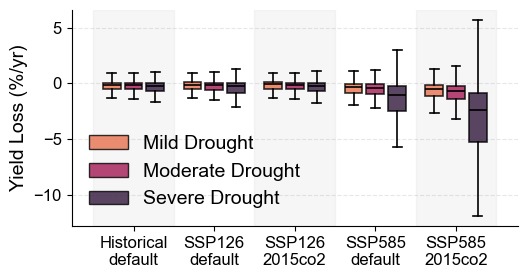

Crop: whe, Scenario: historical, Exp: default
   Mild Drought: -0.46 ± 1.49
   Moderate Drought: -0.54 ± 1.50
   Severe Drought: -0.85 ± 1.94
    Drought: -0.85 ± 1.94
------------------------------------------------------------
Crop: whe, Scenario: ssp126, Exp: default
   Mild Drought: -0.37 ± 1.72
   Moderate Drought: -0.49 ± 1.84
   Severe Drought: -1.37 ± 3.76
    Drought: -1.37 ± 3.76
------------------------------------------------------------
Crop: whe, Scenario: ssp126, Exp: 2015co2
   Mild Drought: -0.34 ± 1.78
   Moderate Drought: -0.41 ± 1.77
   Severe Drought: -1.11 ± 3.54
    Drought: -1.11 ± 3.54
------------------------------------------------------------
Crop: whe, Scenario: ssp585, Exp: default
   Mild Drought: -0.70 ± 1.87
   Moderate Drought: -0.88 ± 2.10
   Severe Drought: -3.58 ± 6.99
    Drought: -3.58 ± 6.99
------------------------------------------------------------
Crop: whe, Scenario: ssp585, Exp: 2015co2
   Mild Drought: -1.44 ± 2.29
   Moderate Drought: -1.

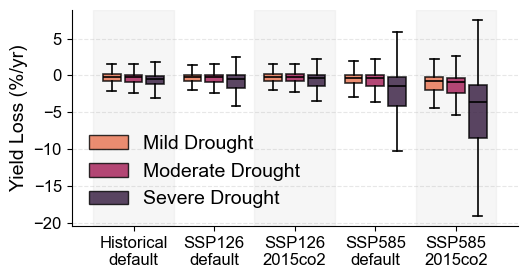

Crop: soy, Scenario: historical, Exp: default
   Mild Drought: -0.17 ± 0.80
   Moderate Drought: -0.26 ± 0.80
   Severe Drought: -0.45 ± 0.97
    Drought: -0.45 ± 0.97
------------------------------------------------------------
Crop: soy, Scenario: ssp126, Exp: default
   Mild Drought: -0.34 ± 0.68
   Moderate Drought: -0.42 ± 0.69
   Severe Drought: -0.69 ± 1.09
    Drought: -0.69 ± 1.09
------------------------------------------------------------
Crop: soy, Scenario: ssp126, Exp: 2015co2
   Mild Drought: -0.26 ± 0.65
   Moderate Drought: -0.33 ± 0.66
   Severe Drought: -0.51 ± 0.94
    Drought: -0.51 ± 0.94
------------------------------------------------------------
Crop: soy, Scenario: ssp585, Exp: default
   Mild Drought: -0.22 ± 0.81
   Moderate Drought: -0.30 ± 0.93
   Severe Drought: -1.77 ± 3.16
    Drought: -1.77 ± 3.16
------------------------------------------------------------
Crop: soy, Scenario: ssp585, Exp: 2015co2
   Mild Drought: -0.93 ± 1.03
   Moderate Drought: -1.

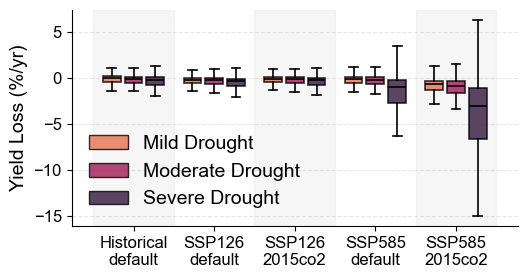

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
import matplotlib as mpl

# 设置全局样式
mpl.rcParams['pdf.fonttype'] = 42
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 12

# 干旱等级颜色和标签
severity_colors = ['#e7724f', '#a21a54', '#32183c']  # Mild, Moderate, Severe
severity_labels = ['Mild Drought', 'Moderate Drought', 'Severe Drought']
ss={'historical':'Historical',
   'ssp126':'SSP126',
   'ssp585':"SSP585"}
def plot_yield_loss_boxplot_by_scenario(results, crops, scenarios, last_n_years=30):
    # 为每种作物创建一个图形
    for crop in crops:
        fig, ax = plt.subplots(figsize=(5.5, 3))
        mpl.rcParams['pdf.fonttype'] = 42
        plt.rcParams["font.family"] = "Arial"
        plt.rcParams["font.size"] = 14
            # 准备存储所有情景的数据
        all_data = {severity: [] for severity in severity_labels}
        scenario_names = []
        exp_names = []
        
        for ssp in scenarios:
            for exp in ['default', '2015co2']:  # 假设有两种实验
                if exp == '2015co2' and ssp == 'historical':
                    continue  # 跳过无效组合
                
                try:
                    yield_loss = results[exp][ssp][crop]['yield_loss'][-last_n_years:]
                    ssi = results[exp][ssp][crop]['ssi'][-last_n_years:]
                    
                    # 获取各干旱等级下的产量损失& (yield_loss < 0)
                    mild_loss = yield_loss.where((ssi <= -0.42) & (ssi > -0.54) )
                    moderate_loss = yield_loss.where((ssi <= -0.54) & (ssi > -0.69) )
                    severe_loss = yield_loss.where((ssi <= -0.69) )
                    mild_loss = mild_loss.sum(dim='time')/last_n_years
                    moderate_loss = moderate_loss.sum(dim='time')/last_n_years
                    severe_loss = severe_loss.sum(dim='time')/last_n_years
                    
                    # 转换为numpy数组并移除NaN值
                    mild_data = mild_loss.where(mild_loss!=0).values.flatten()
                    mild_data = mild_data[~np.isnan(mild_data)]
                    
                    moderate_data = moderate_loss.where(moderate_loss!=0).values.flatten()
                    moderate_data = moderate_data[~np.isnan(moderate_data)]
                    
                    severe_data = severe_loss.where(severe_loss!=0).values.flatten()
                    severe_data = severe_data[~np.isnan(severe_data)]
                    
                    # 确保至少有1个数据点，否则用空数组
                    mild_data = mild_data if len(mild_data) > 0 else np.array([])
                    moderate_data = moderate_data if len(moderate_data) > 0 else np.array([])
                    severe_data = severe_data if len(severe_data) > 0 else np.array([])
                    
                    # 存储数据
                    all_data['Mild Drought'].append(mild_data)
                    all_data['Moderate Drought'].append(moderate_data)
                    all_data['Severe Drought'].append(severe_data)
                    
                    # 记录情景名称
                    scenario_names.append(f"{ss[ssp]}\n{exp}")
                    exp_names.append(exp)
                    print(f"Crop: {crop}, Scenario: {ssp}, Exp: {exp}")
                    
                    if len(mild_data) > 0:
                        print(f"   Mild Drought: {np.nanmean(mild_data):.2f} ± {np.nanstd(mild_data):.2f}")
                    else:
                        print("   Mild Drought: No Data")
                    
                    if len(moderate_data) > 0:
                        print(f"   Moderate Drought: {np.nanmean(moderate_data):.2f} ± {np.nanstd(moderate_data):.2f}")
                    else:
                        print("   Moderate Drought: No Data")
                    
                    if len(severe_data) > 0:
                        print(f"   Severe Drought: {np.nanmean(severe_data):.2f} ± {np.nanstd(severe_data):.2f}")
                    else:
                        print("   Severe Drought: No Data")
                    drought = yield_loss.where((ssi <= -0.42) ).sum(dim='time')/last_n_years
                    drought = drought.where(drought!=0).values.flatten()
                    drought = drought[~np.isnan(drought)]
                    print(f"    Drought: {np.nanmean(severe_data):.2f} ± {np.nanstd(severe_data):.2f}")
                    print("-"*60)
                except KeyError:
                    continue
        
        # 检查数据是否为空
        valid_data = False
        for severity in severity_labels:
            if any(len(data) > 0 for data in all_data[severity]):
                valid_data = True
                break
        
        if not valid_data:
            print(f"No valid data for {crop}, skipping...")
            plt.close(fig)
            continue
        
        # 设置x轴位置（每个情景为一个组）
        n_scenarios = len(scenario_names)
        group_spacing = 1.0            # 控制组之间的间距（可调小一点）
        x_positions = np.arange(n_scenarios) * group_spacing
        n_severity = len(severity_labels)
        box_width = 0.22               # 每个箱型图的宽度
        inner_spacing = 0.05           # 组内箱体之间的间隔

        # 绘制背景：间隔一个情景灰色背景
        for i, xpos in enumerate(x_positions):
            if i % 2 == 0:
                ax.axvspan(xpos - 0.5, xpos + 0.5, color='lightgray', alpha=0.2, zorder=0)

        # 为每种干旱等级绘制箱型图
        for i, (severity, color) in enumerate(zip(severity_labels, severity_colors)):
            # 在组内的偏移，例如 [-0.25, 0, +0.25]
            offset = (i - (n_severity - 1)/2) * (box_width + inner_spacing)
            positions = x_positions + offset

            box = ax.boxplot(all_data[severity],
                             positions=positions,
                             widths=box_width,
                             patch_artist=True,
                             showfliers=False)

            # 设置箱体样式（边框 + 填充色）
            for patch in box['boxes']:
                patch.set_facecolor(color)
                patch.set_alpha(0.8)
                patch.set_edgecolor('black')
                patch.set_linewidth(1.2)

            # 设置线条样式
            for element in ['whiskers', 'caps', 'medians']:
                plt.setp(box[element], color='black', linewidth=1.2)

        # 设置x轴标签（在组中心）
        ax.set_xticks(x_positions)
        ax.set_xticklabels(scenario_names, rotation=0, ha='center',fontsize=12)
        

        
        # 设置y轴标签和标题
        ax.set_ylabel('Yield Loss (%/yr)', fontsize=14)
        # ax.set_title(f'{crop} Yield Loss by Drought Severity (Last {last_n_years} Years)', fontsize=12, pad=20)
        
        # 添加图例
        patches = [plt.Rectangle((0,0),1,1, fc=color, alpha=0.8, edgecolor='black') 
                 for color in severity_colors]
        ax.legend(patches, severity_labels, loc='lower left', frameon=False)
        
        # 美化图形
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.grid(axis='y', linestyle='--', alpha=0.3)
        
        # 调整y轴范围
        # ax.set_ylim(bottom=0)
        ax.tick_params(axis='y', labelsize=12)
        plt.tight_layout()
        # plt.savefig(rf'D:\AAUDE\paper\paper8\manu\fig\future_compare\yield_loss_boxplot_{crop}_by_scenario.pdf', dpi=300, bbox_inches='tight')
        plt.show()

# 调用
crops = ['mai', 'whe', 'soy']  # 假设的作物列表
scenarios = ['historical', 'ssp126', 'ssp585']  # 情景列表
plot_yield_loss_boxplot_by_scenario(results, crops, scenarios, last_n_years=30)

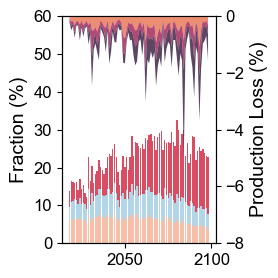

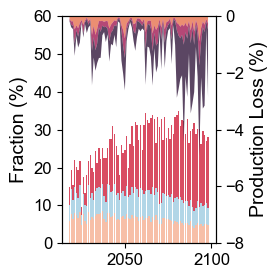

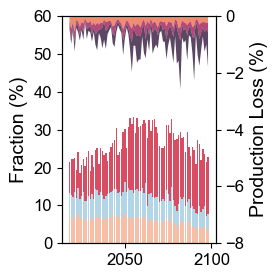

In [166]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr

def plot_combined_stack(results, exp, ssp, crop):
    # 创建图形和双y轴
    fig, ax1 = plt.subplots(figsize=(3, 3))
    mpl.rcParams['pdf.fonttype'] = 42
    plt.rcParams["font.family"] = "Arial"
    plt.rcParams["font.size"] = 14
    ax2 = ax1.twinx()  # 共享x轴的双y轴
    
    # 获取数据
    yield_loss = (results[exp][ssp][crop]['production_loss']/1e4)
    ssi = results[exp][ssp][crop]['ssi']
    years = ssi.time.dt.year.values
    
    # 干旱等级颜色和标签
    colors = ['#f4a582', '#92c5de', '#ca0020']
    labels = ['Mild Drought', 'Moderate Drought', 'Severe Drought']
    severity_colors = ['#e7724f', '#a21a54', '#32183c']
    # --- 干旱频率堆叠图 (左侧y轴) ---
    # 计算各等级干旱频率
    mild_freq = ((ssi <= -0.42) & (ssi > -0.54)).sum(dim=['lat','lon']) / ssi.count(dim=['lat','lon']) * 100
    moderate_freq = ((ssi <= -0.54) & (ssi > -0.69)).sum(dim=['lat','lon']) / ssi.count(dim=['lat','lon']) * 100
    severe_freq = (ssi <= -0.69).sum(dim=['lat','lon']) / ssi.count(dim=['lat','lon']) * 100
    
    # 绘制频率堆叠柱状图
    ax1.bar(years, mild_freq, color=colors[0], label=labels[0]+'', alpha=0.7)
    ax1.bar(years, moderate_freq, bottom=mild_freq, color=colors[1], label=labels[1]+'', alpha=0.7)
    ax1.bar(years, severe_freq, bottom=mild_freq+moderate_freq, color=colors[2], label=labels[2]+'', alpha=0.7)
    
    # 设置左侧y轴范围
    if ssp == 'historical':
        ax1.set_ylim(0, 25)
        ax1.set_yticks(np.arange(0, 26, 5))
    else:
        ax1.set_ylim(0, 60)
        ax1.set_yticks(np.arange(0, 61, 10))
    ax1.set_ylabel('Fraction (%)', fontsize=14)
    
    # --- 产量损失堆叠图 (右侧y轴) ---
    # 计算各等级干旱导致的产量损失
    mild_loss = yield_loss.where((ssi <= -0.42) & (ssi > -0.54) & (yield_loss < 0)).sum(dim=['lat','lon'])/(results[exp][ssp][crop]['production']/1e4).sum(dim=['lat','lon'])*100
    moderate_loss = yield_loss.where((ssi <= -0.54) & (ssi > -0.69) & (yield_loss < 0)).sum(dim=['lat','lon'])/(results[exp][ssp][crop]['production']/1e4).sum(dim=['lat','lon'])*100
    severe_loss = yield_loss.where((ssi <= -0.69) & (yield_loss < 0)).sum(dim=['lat','lon'])/(results[exp][ssp][crop]['production']/1e4).sum(dim=['lat','lon'])*100
    
    # 绘制损失堆叠面积图
    ax2.stackplot(years, mild_loss, moderate_loss, severe_loss, 
                 colors=severity_colors, alpha=0.8, 
                 labels=[label for label in labels])
    
    # 设置右侧y轴范围
    ax2.set_ylim(-8, 0)
    ax2.set_ylabel('Production Loss (%)', fontsize=14)
    ax2.grid(False)  # 关闭右侧y轴的网格
    
    # 图例处理（合并两个轴的图例）
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    # ax1.legend(lines1 + lines2, labels1 + labels2, 
    #           loc='upper left', frameon=False, ncol=1)
    
    ax1.tick_params(axis='both', which='major', labelsize=12)
    ax2.tick_params(axis='both', which='major', labelsize=12)
    # ax1.spines['top'].set_visible(False)
    # ax2.spines['top'].set_visible(False)
    # ax1.set_xlabel('00', fontsize=12)
    # plt.title(f'{crop} 干旱频率与产量损失 ({exp}, {ssp})', fontsize=14, pad=20)
    plt.tight_layout()
    
    # 保存和显示
    plt.savefig(rf'D:\AAUDE\paper\paper8\manu\fig\future_compare\Combined_Stack_{exp}_{crop}_{ssp}.pdf', dpi=300, bbox_inches='tight')
    plt.show()

# 使用示例
for crop in crops:
    plot_combined_stack(results, 'default', 'ssp585', crop)

In [5]:
import numpy as np
import xarray as xr
from tqdm.notebook import tqdm

crops = ['mai','soy','whe']
ssps = ['historical', 'ssp126', 'ssp585']
exps = ['default', '2015co2']

def generate_results(result_dict1, result_dict2):
    results = {}
    for exp in exps:
        results[exp] = {}
        for ssp in tqdm(ssps, desc='Processing SSPs'):
            if exp == '2015co2' and ssp == 'historical':
                continue
            results[exp][ssp] = {}
            idx =-2  # 时间长度
            
            for crop in tqdm(crops, desc='Processing Crops', leave=False):
                area_path = join(r'D:\AAUDE\paper\paper8\data\area', f'spam2020_v1r0_global_H_{crop}_R.nc')
                area = xr.open_dataset(area_path)[list(xr.open_dataset(area_path).data_vars)[0]]
                # 加载主导类型
                dominant_type = xr.open_dataset(
                    rf"D:\AAUDE\paper\paper8\data\PCMCI\dominant_type_{crop}_{ssp}_default.nc"
                ).spei_to_yield_strength
                
                # 产量数据
                expect_yield = result_dict2[exp][ssp][crop]['expect_yield'][-idx-1:-1]
                
                yied = result_dict1[exp][ssp][crop]['yield'][-idx:]
                yied = yied.where(yied > 0)
                
                yield_loss = (yied - expect_yield) / expect_yield*100
                
                # 干旱指数
                ssi = result_dict1[exp][ssp][crop]['ssi'][-idx:]
                # swd = (result_dict1[exp][ssp][crop]['swd'][-idx:]-result_dict1[exp][ssp][crop]['swd'][:10].mean(dim='time'))/result_dict1[exp][ssp][crop]['swd'][:10].mean(dim='time')
                swd = result_dict1[exp][ssp][crop]['swd'][-idx:]
                # swd = (result_dict1[exp][ssp][crop]['swd'][-idx:]-result_dict2[exp][ssp][crop]['swd'][-idx:])/result_dict2[exp][ssp][crop]['swd'][-idx:]
                
                # 筛选条件
                mask = (abs(yield_loss) < 200) #& ((dominant_type == 0) | (dominant_type == 1))
                yield_loss = yield_loss.where(mask)
                ssi = ssi.where(mask)
                swd = swd.where(mask)
                
                # 保存到 results
                results[exp][ssp][crop] = {
                    'yield_loss': yield_loss,
                    'ssi': ssi,
                    'swd': swd,
                    'production_loss': (yied - expect_yield)*area,
                    'production': (yied)*area
                }
    return results

# 调用示例
results = generate_results(result_dict1, result_dict2)


Processing SSPs:   0%|          | 0/3 [00:00<?, ?it/s]

Processing Crops:   0%|          | 0/3 [00:00<?, ?it/s]

Processing Crops:   0%|          | 0/3 [00:00<?, ?it/s]

Processing Crops:   0%|          | 0/3 [00:00<?, ?it/s]

Processing SSPs:   0%|          | 0/3 [00:00<?, ?it/s]

Processing Crops:   0%|          | 0/3 [00:00<?, ?it/s]

Processing Crops:   0%|          | 0/3 [00:00<?, ?it/s]

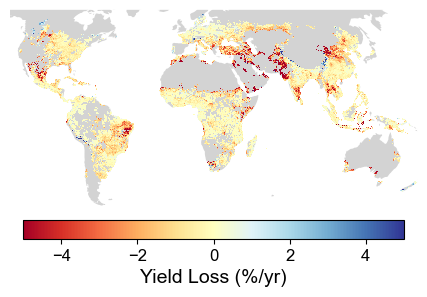

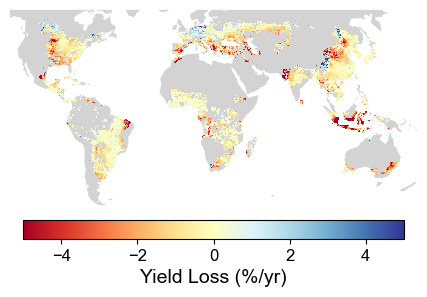

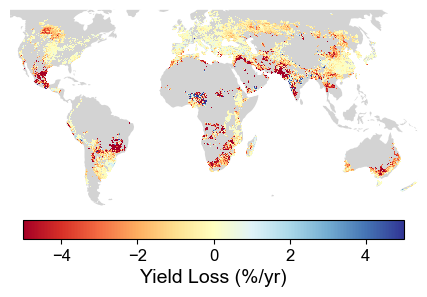

In [141]:
import matplotlib as mpl
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
def draw_dominant(dominant_type,vmax,vmin,save_path):
    # 将0值替换为NaN，这样就不会显示
    dominant_type = dominant_type.where(dominant_type != 0)

    # 绘图
    fig = plt.figure(figsize=(5,3))
    mpl.rcParams['pdf.fonttype'] = 42
    plt.rcParams["font.family"] = "Arial"
    plt.rcParams["font.size"] = 8

    # ax = plt.axes(projection=ccrs.PlateCarree())
    ax = plt.axes(projection=ccrs.Robinson())
    ax.set_extent([-120, 160, -60, 65], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor='lightgray')
    # ax.coastlines(linewidth=0.5)
    # ax.add_feature(cfeature.BORDERS, linewidth=0.3)
    ax.spines['geo'].set_visible(False)
    
    # 绘制处理后的数据（已去除0值）
    im = plt.pcolormesh(dominant_type.lon, dominant_type.lat, dominant_type,vmax=vmax,vmin=vmin,
                        cmap='RdYlBu', transform=ccrs.PlateCarree())
    

    ax.set_aspect(1)
    cbar = ax.figure.colorbar(im, ax=ax, orientation='horizontal',shrink=0.8, pad=0.03)
    cbar.ax.tick_params(labelsize=12)
    cbar.set_label('Yield Loss (%/yr)',fontsize=14)
    
    plt.tight_layout()
    # plt.savefig(
    #     save_path,
    #     format='pdf',
    #     bbox_inches='tight',
    #     dpi=300,
    # )
    plt.show()
for crop in crops:
    ssp='historical'
    yield_loss=results['default'][ssp][crop]['yield_loss'][-30:]
    ssi=results['default'][ssp][crop]['ssi'][-30:]
    losses=yield_loss.where(ssi<-0.42).sum(dim='time')/30
    draw_dominant(losses,5,-5,rf'D:\AAUDE\paper\paper8\manu\fig\historical_impact\spatial_distribuction_{crop}_historical.pdf')

In [64]:
for crop in crops:
    ssp='ssp585'
    losses=results['2015co2'][ssp][crop]['yield_loss'][-30:].where(results['2015co2'][ssp][crop]['ssi'][-30:]<-0.42).mean(dim='time')
    print(losses.mean().values)

-11.31857590276503
-13.551547905828777
-18.668239157617514


In [65]:
for crop in crops:
    ssp='historical'
    losses=results['default'][ssp][crop]['yield_loss'][-30:].where(results['default'][ssp][crop]['ssi'][-30:]<-0.42).mean(dim='time')
    print(losses.mean().values)

-5.041506770507783
-3.7688397889783376
-7.57871487177873


In [63]:
for crop in crops:
    ssp='ssp585'
    losses=results['default'][ssp][crop]['yield_loss'][-30:].where(results['default'][ssp][crop]['ssi'][-30:]<-0.42).mean(dim='time')
    print(losses.mean().values)

-7.778554038110052
-5.896362277611355
-12.316151658115219


In [ ]:
for crop in crops:
    ssp='ssp585'
    yield_loss=results['default'][ssp][crop]['yield_loss'][-30:]
    mild_freq = yield_loss.where((ssi <= -0.42) & (ssi > -0.54)).mean(dim='time')
    moderate_freq = yield_loss.where((ssi <= -0.54) & (ssi > -0.69)).mean(dim='time')
    severe_freq = yield_loss.where(ssi <= -0.69).mean(dim='time')
    print(crop)
    print(f'mild_freq{mild_freq.mean().values:.1f},{mild_freq.std().values:.1f}')
    print(f'moderate_freq{moderate_freq.mean().values:.1f},{moderate_freq.std().values:.1f}')
    print(f'severe_freq{severe_freq.mean().values:.1f},{severe_freq.std().values:.1f}')

In [12]:
for crop in crops:
    ssp='historical'
    yield_loss=results['default'][ssp][crop]['yield_loss'][-30:]
    ssi=results['default'][ssp][crop]['ssi'][-30:]
    mild_freq = yield_loss.where((ssi <= -0.42) & (ssi > -0.54)).mean(dim='time')
    moderate_freq = yield_loss.where((ssi <= -0.54) & (ssi > -0.69)).mean(dim='time')
    severe_freq = yield_loss.where(ssi <= -0.69).mean(dim='time')
    print(crop)
    print(f'mild_freq{mild_freq.mean().values:.1f},{mild_freq.std().values:.1f}')
    print(f'moderate_freq{moderate_freq.mean().values:.1f},{moderate_freq.std().values:.1f}')
    print(f'severe_freq{severe_freq.mean().values:.1f},{severe_freq.std().values:.1f}')

mai
mild_freq-4.1,11.4
moderate_freq-5.8,12.7
severe_freq-8.3,14.7
soy
mild_freq-2.9,10.3
moderate_freq-4.6,11.8
severe_freq-7.6,13.7
whe
mild_freq-6.7,17.5
moderate_freq-9.0,19.4
severe_freq-13.5,21.4


In [9]:
for crop in crops:
    ssp='historical'
    yield_loss=results['default'][ssp][crop]['yield_loss'][-30:]
    ssi=results['default'][ssp][crop]['ssi'][-30:]
    losses=yield_loss.where(ssi<-0.42).mean(dim='time')
    print(f'{losses.mean().values:.1f},{losses.std().values:.1f}')

-5.3,10.2
-4.4,9.6
-8.4,14.8


mai_default_historical,-0.6,-0.4


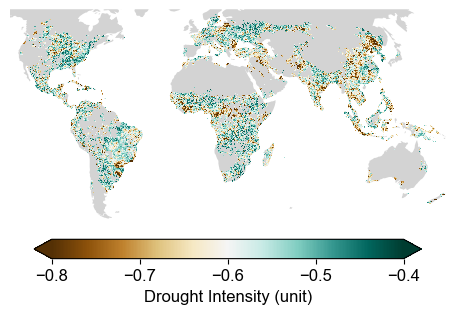

mai_default_ssp126,-0.6,-0.4


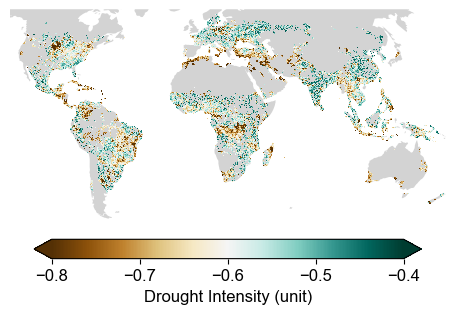

mai_default_ssp585,-0.7,-0.4


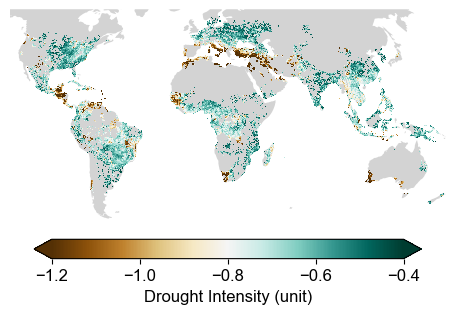

soy_default_historical,-0.6,-0.4


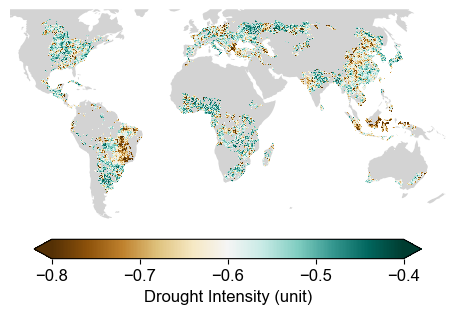

soy_default_ssp126,-0.6,-0.4


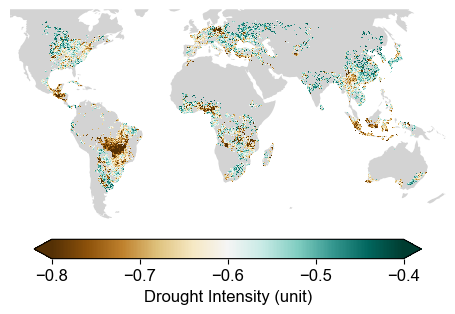

soy_default_ssp585,-0.8,-0.4


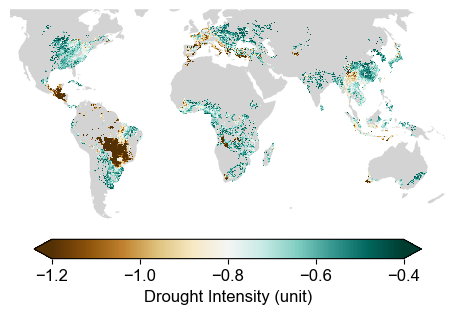

whe_default_historical,-0.6,-0.4


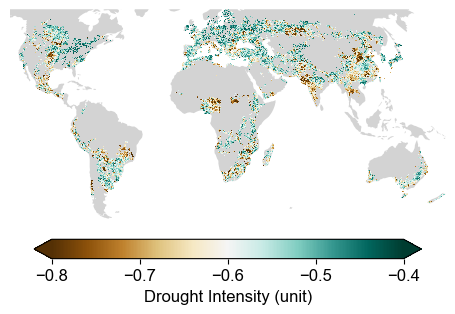

whe_default_ssp126,-0.6,-0.4


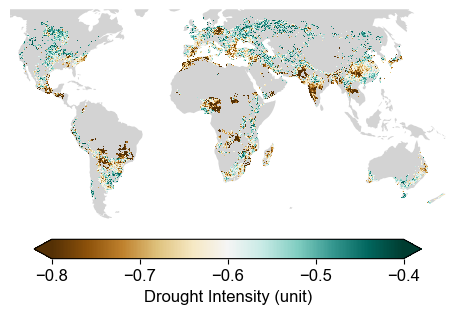

whe_default_ssp585,-0.8,-0.4


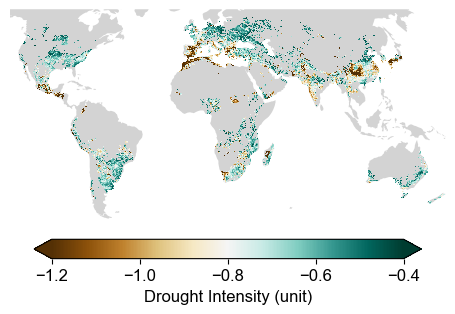

mai_2015co2_ssp126,-0.6,-0.4


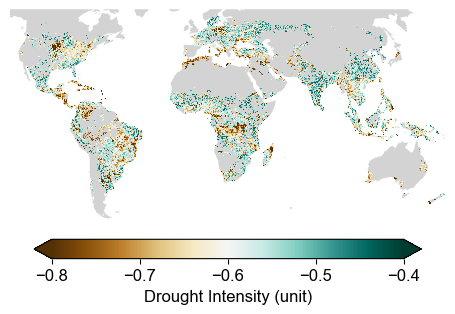

mai_2015co2_ssp585,-0.7,-0.4


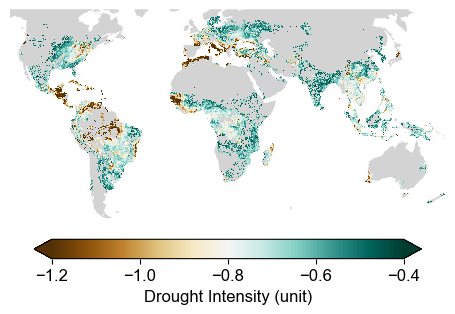

soy_2015co2_ssp126,-0.6,-0.4


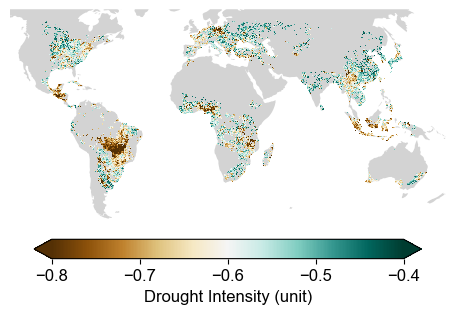

soy_2015co2_ssp585,-0.8,-0.4


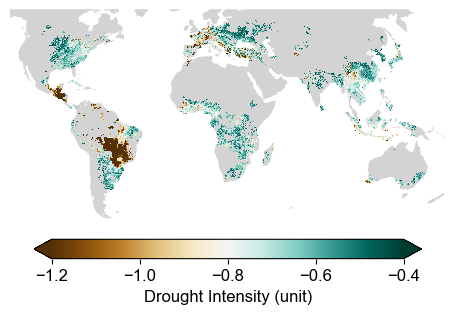

whe_2015co2_ssp126,-0.6,-0.4


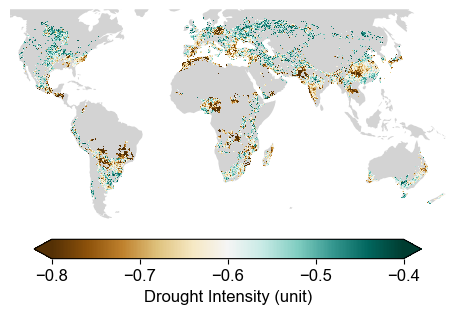

whe_2015co2_ssp585,-0.8,-0.4


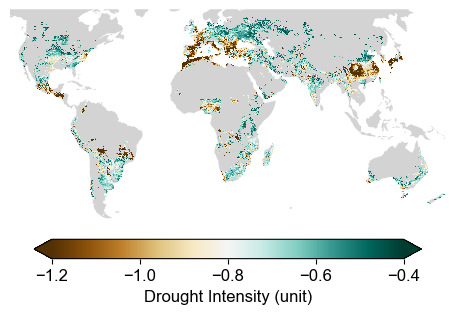

In [66]:
import matplotlib as mpl
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
def draw_dominant(dominant_type,vmax,vmin,save_path):
    # 将0值替换为NaN，这样就不会显示
    dominant_type = dominant_type.where(dominant_type != 0)

    # 绘图
    fig = plt.figure(figsize=(5.2,3.3))
    mpl.rcParams['pdf.fonttype'] = 42
    plt.rcParams["font.family"] = "Arial"
    plt.rcParams["font.size"] = 12

    # ax = plt.axes(projection=ccrs.PlateCarree())
    ax = plt.axes(projection=ccrs.Robinson())
    ax.set_extent([-120, 160, -60, 65], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor='lightgray')
    # ax.coastlines(linewidth=0.5)
    # ax.add_feature(cfeature.BORDERS, linewidth=0.3)
    ax.spines['geo'].set_visible(False)
    
    # 绘制处理后的数据（已去除0值）
    im = plt.pcolormesh(dominant_type.lon, dominant_type.lat, dominant_type,vmax=vmax,vmin=vmin,
                        cmap='BrBG', transform=ccrs.PlateCarree())
    

    ax.set_aspect(1)
    cbar = ax.figure.colorbar(im, ax=ax, orientation='horizontal',shrink=0.8, pad=0.05,extend="both")
    cbar.set_label('Drought Intensity (unit)')
    
    plt.tight_layout()
    # plt.savefig(
    #     save_path,
    #     format='pdf',
    #     bbox_inches='tight',
    #     dpi=300,
    # )
    plt.show()
exp='2015co2'
crops = ['mai','soy','whe']

for exp in exps:
    for crop in crops:
        for ssp in ssps:
            # ssp='historical'
            if exp == '2015co2' and ssp == 'historical':
                    continue
            if ssp=='ssp585':
                vmax=1.2
            elif ssp=='ssp126':
                vmax=0.8
            elif ssp=='historical':
                vmax=0.8
            yield_loss=results[exp][ssp][crop]['swd'][-30:]
            # yield_loss[2].plot()
            # plt.show()
            ssi=results[exp][ssp][crop]['ssi'][-30:]
            
            losses=ssi.where(ssi<-0.42).mean(dim='time')
            losses=losses.where(losses<0)
            print(f'{crop}_{exp}_{ssp},{losses.mean().values:.1f},{losses.max().values:.1f}')
            draw_dominant(losses,-0.4,-vmax,rf'D:\AAUDE\paper\paper8\manu\fig\historical_impact\drought_intensity_spatial_distribuction_{crop}_{ssp}_{exp}.pdf')


# for crop in crops:
#         ssp='ssp585'
        
#         losses=results['2015co2'][ssp][crop]['ssi'][-30:].where(results['2015co2'][ssp][crop]['ssi'][-30:]<-0.42).mean(dim='time')-\
#         results['default'][ssp][crop]['ssi'][-30:].where(results['default'][ssp][crop]['ssi'][-30:]<-0.42).mean(dim='time')

#         print(f'{crop}_{exp}_{ssp},{losses.mean().values:.1f},{losses.max().values:.1f}')
#         draw_dominant(losses,0.4,-0.4,rf'D:\AAUDE\paper\paper8\manu\fig\historical_impact\drought_intensity_spatial_distribuction_{crop}_ssp585_delta.pdf')

mai_default_historical,18.7,0.9


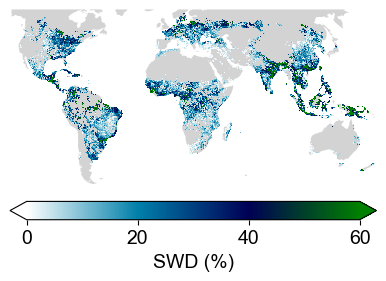

mai_default_ssp126,17.3,0.9


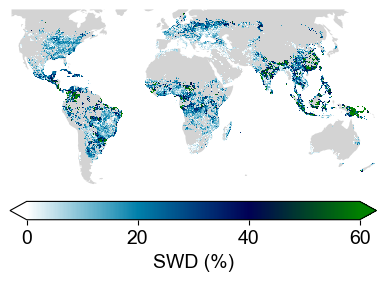

mai_default_ssp585,20.8,0.9


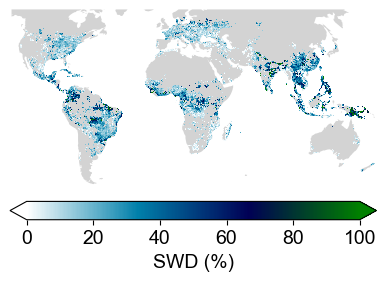

soy_default_historical,18.8,0.9


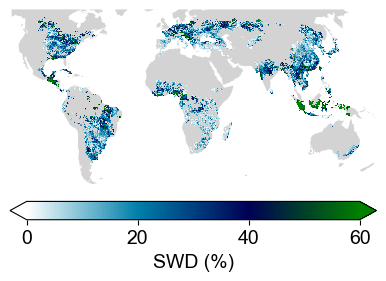

soy_default_ssp126,16.9,0.9


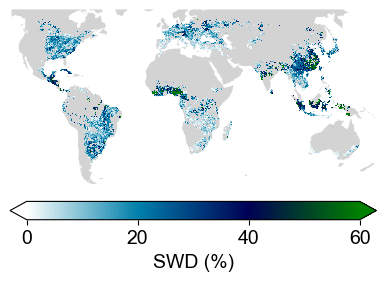

soy_default_ssp585,18.1,0.9


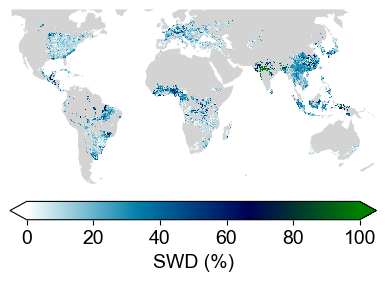

whe_default_historical,10.0,0.8


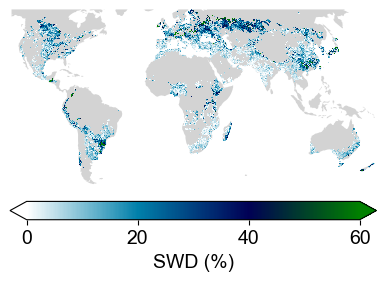

whe_default_ssp126,8.1,0.8


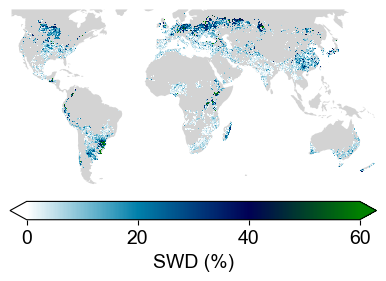

whe_default_ssp585,9.6,0.8


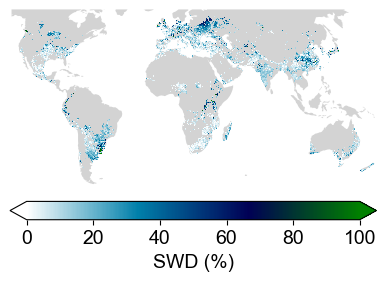

mai_2015co2_ssp126,17.5,0.9


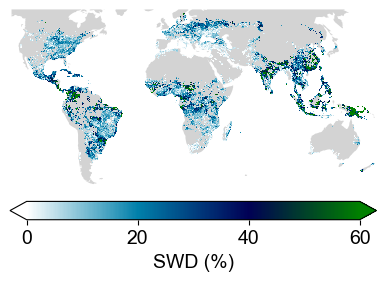

mai_2015co2_ssp585,16.7,0.9


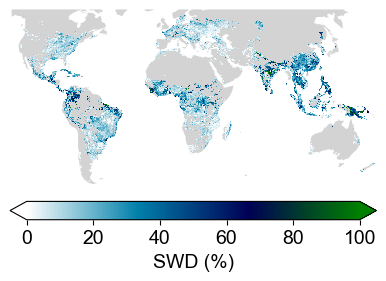

soy_2015co2_ssp126,17.3,0.9


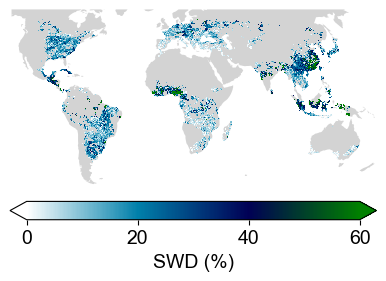

soy_2015co2_ssp585,17.4,0.9


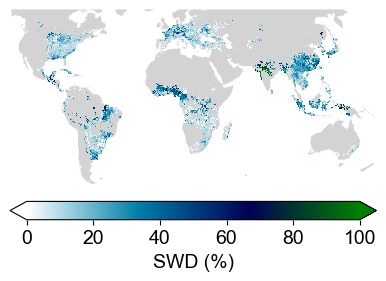

whe_2015co2_ssp126,8.0,0.8


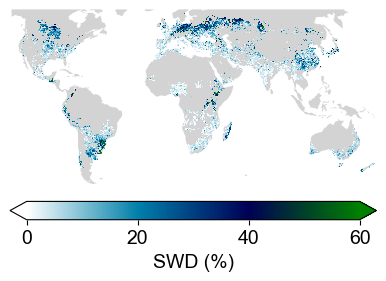

whe_2015co2_ssp585,6.8,0.8


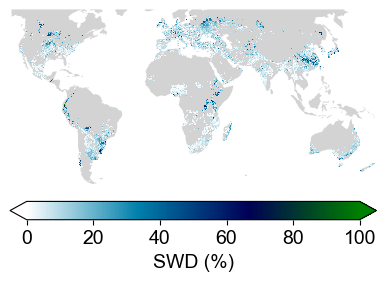

In [127]:
import matplotlib as mpl
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
mpl.rcParams['pdf.fonttype'] = 42
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 14
def draw_dominant(dominant_type,vmax,vmin,save_path):
    # 将0值替换为NaN，这样就不会显示
    dominant_type = dominant_type.where(dominant_type != 0)

    # 绘图
    fig = plt.figure(figsize=(5,3))
    

    # ax = plt.axes(projection=ccrs.PlateCarree())
    ax = plt.axes(projection=ccrs.Robinson())
    ax.set_extent([-120, 160, -60, 65], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor='lightgray')
    # ax.coastlines(linewidth=0.5)
    # ax.add_feature(cfeature.BORDERS, linewidth=0.3)
    ax.spines['geo'].set_visible(False)
    
    # 绘制处理后的数据（已去除0值）
    im = plt.pcolormesh(dominant_type.lon, dominant_type.lat, dominant_type,vmax=vmax,vmin=vmin,
                        cmap='ocean_r', transform=ccrs.PlateCarree())
    

    ax.set_aspect(1)
    cbar = ax.figure.colorbar(im, ax=ax, orientation='horizontal',shrink=0.8, pad=0.05,extend="both")
    cbar.set_label('SWD (%)')
    
    plt.tight_layout()
    # plt.savefig(
    #     save_path,
    #     format='pdf',
    #     bbox_inches='tight',
    #     dpi=300,
    # )
    plt.show()
exp='default'
crops = ['mai','soy','whe']

for exp in exps:

    for crop in crops:
        for ssp in ssps:
            # ssp='historical'
            if exp == '2015co2' and ssp == 'historical':
                    continue
            if ssp!='ssp585':
                vmax=60
            else:
                vmax=100
            yield_loss=results[exp][ssp][crop]['swd']
            # yield_loss[2].plot()
            # plt.show()
            ssi=results[exp][ssp][crop]['ssi'][-30:]
            
            losses=(yield_loss[-30:].where(ssi<-0.42).mean(dim='time')-yield_loss[-30:].where(ssi>-0.42).mean(dim='time'))/yield_loss[-30:].mean(dim='time')*100
            # losses=yield_loss.where(ssi<-0.42).mean(dim='time')
            losses=losses.where(losses!=0)
            print(f'{crop}_{exp}_{ssp},{losses.mean().values:.1f},{((losses>0).sum().values/(losses).count().values):.1f}')
            draw_dominant(abs(losses),vmax,-0,rf'D:\AAUDE\paper\paper8\manu\fig\historical_impact\swd_spatial_distribuction_{crop}_{ssp}_{exp}.pdf')

# for exp in exps:
#     for crop in crops:
#         for ssp in ssps:
#             # ssp='ssp585'
#             if exp == '2015co2' and ssp == 'historical':
#                     continue
#             if ssp!='ssp585':
#                 vmax=20
#             else:
#                 vmax=100
#             yield_loss=results[exp][ssp][crop]['swd'][-30:]
#             # yield_loss[2].plot()
#             # plt.show()
#             ssi=results[exp][ssp][crop]['ssi'][-30:]
            
#             losses=yield_loss.where(ssi<-0.42).sum(dim='time')*100/30
#             losses=losses.where(losses!=0)
#             print(f'{crop}_{exp}_{ssp},{losses.mean().values:.1f},{((losses>0).sum().values/(losses).count().values):.1f}')
#             draw_dominant(losses,vmax,-vmax,rf'D:\AAUDE\paper\paper8\manu\fig\historical_impact\swd_spatial_distribuction_{crop}_{ssp}_{exp}.pdf')
# exp='2015co2'
# crops = ['mai','soy','whe']
# for crop in crops:
#     # for ssp in ssps:
#         ssp='ssp585'

#         yield_loss=results[exp][ssp][crop]['swd'][-30:]
#         # yield_loss[2].plot()
#         # plt.show()
#         ssi=results[exp][ssp][crop]['ssi'][-30:]
        
#         losses=results[exp][ssp][crop]['swd'][-30:].where(results[exp][ssp][crop]['ssi'][-30:]<-0.42).sum(dim='time')*100-\
#     results['default'][ssp][crop]['swd'][-30:].where(results['default'][ssp][crop]['ssi'][-30:]<-0.42).sum(dim='time')*100
        
#         losses=(losses/30).where(losses!=0)
#         print(f'{crop}_{exp}_{ssp},{losses.median().values:.1f},{((losses>0).sum().values/(losses).count().values):.1f}')
#         draw_dominant(losses,20,-20,rf'D:\AAUDE\paper\paper8\manu\fig\historical_impact\swd_spatial_distribuction_{crop}_{ssp}_delta.pdf')

mai 13.401229902914208 5.571579954948984
mai 17.667249161347605 6.864414426036764
mai 45.43403927524863 15.967335703950683
mai 42.88554449321973 17.9191528410102
mai 27.482890227146104 11.591487984048483


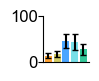

soy 17.746696451708495 8.066304533766507
soy 18.65051712575212 7.569527287235466
soy 32.37021800200048 12.712930255746832
soy 30.51147277023419 11.449242291840784
soy 25.34385922437353 10.079868686259694


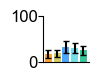

whe 12.23559502788549 5.533039930818033
whe 12.316344560151045 6.42829132240811
whe 26.800511064406166 12.145752348440023
whe 25.850893742035083 14.180928475836328
whe 14.778635738313259 8.093544106641351


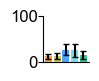

In [128]:
mpl.rcParams['pdf.fonttype'] = 42
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 12
colors = ['#FF8C00', '#C6BF3E', '#1E90FF', '#56D7E3','#00B980']
exp='default'
for crop in crops:
    all_probs = []
    all_std = []
    ssp='historical'
    yield_loss=results[exp][ssp][crop]['swd'][:]
    ssi=results[exp][ssp][crop]['ssi'][:]
    # prob=(yield_loss[-30:].where(ssi<-0.42).mean(dim='time')-yield_loss[-30:].mean(dim='time'))/yield_loss.mean(dim='time')*100
    prob=(yield_loss[-30:].where(ssi<-0.42).mean(dim='time')-yield_loss[-30:].where(ssi>-0.42).mean(dim='time'))/yield_loss[-30:].mean(dim='time')*100
    prob=(prob.where(prob!=0))
    prob=prob.where(prob>0)
    dominant_type=dom(crop,ssp)
    for i in range(5):
        all_probs.append(float(prob.where(dominant_type==i).mean().values))
        all_std.append(float(0.5*prob.where(dominant_type==i).std().values))
        print(crop,float(prob.where(dominant_type==i).mean().values),float(0.5*prob.where(dominant_type==i).std().values))
    fig, ax = plt.subplots(figsize=(0.6,0.6))
    
    bars = plt.bar(range(len(all_probs)), all_probs, 
                   yerr=all_std, 
                   capsize=2, 
                   color=colors,
                   alpha=0.8)
    ax.set_ylim(0,100)
    ax.set_xticks([])       # 去掉刻度
    ax.set_xticklabels([])  # 去掉标签
    ax.tick_params(axis='x', which='both', length=0)  # 去掉刻度线
    ax.yaxis.set_tick_params(pad=0)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    plt.savefig(
        rf'D:\AAUDE\paper\paper8\manu\fig\historical_impact\swd_dmonati_prob_{crop}_{ssp}.pdf',
        format='pdf',
        bbox_inches='tight',
        dpi=300,
    )
    plt.show()

mai_historical:66.74232137053203±21.704490304777085


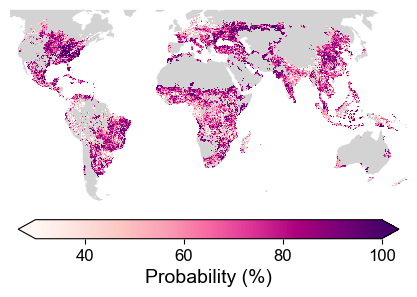

soy_historical:65.13457562268607±22.861518110820157


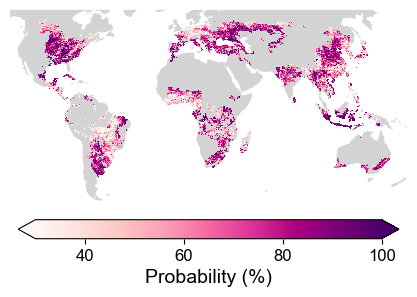

whe_historical:68.52359005571469±22.066215920300575


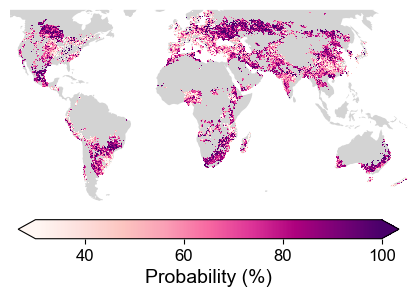

In [83]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib as mpl

def draw_dominant(dominant_type,vmax,vmin,save_path):
    # 将0值替换为NaN，这样就不会显示
    dominant_type = dominant_type.where(dominant_type != 0)

    # 绘图
    fig = plt.figure(figsize=(5,3))
    mpl.rcParams['pdf.fonttype'] = 42
    plt.rcParams["font.family"] = "Arial"
    plt.rcParams["font.size"] = 8

    # ax = plt.axes(projection=ccrs.PlateCarree())
    ax = plt.axes(projection=ccrs.Robinson())
    ax.set_extent([-120, 160, -60, 65], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor='lightgray')
    # ax.coastlines(linewidth=0.5)
    # ax.add_feature(cfeature.BORDERS, linewidth=0.3)
    ax.spines['geo'].set_visible(False)
    
    # 绘制处理后的数据（已去除0值）
    im = plt.pcolormesh(dominant_type.lon, dominant_type.lat, dominant_type,vmax=vmax,vmin=vmin,
                        cmap='RdPu', transform=ccrs.PlateCarree())
    

    ax.set_aspect(1)
    cbar = ax.figure.colorbar(im, ax=ax, orientation='horizontal',shrink=0.8, pad=0.05,extend="both")
    cbar.set_label('Probability (%)', fontsize=14)  # 设置色带标签字体大小
    cbar.ax.tick_params(labelsize=12)
    
    plt.tight_layout()
    plt.savefig(
        save_path,
        format='pdf',
        bbox_inches='tight',
        dpi=300,
    )
    plt.show()
exp='default'
for crop in crops:
    # for ssp in ssps:
    ssp='historical'
    yield_loss=results[exp][ssp][crop]['yield_loss'][:]
    ssi=results[exp][ssp][crop]['ssi'][:]
    prob=(((yield_loss<0)&(ssi<-0.42)).sum(dim='time')/(ssi<-0.42).sum(dim='time'))*100
    prob=prob.where(prob!=0)
    print(f'{crop}_{ssp}:{(prob).mean(skipna=True).values}±{prob.std(skipna=True).values}')
    draw_dominant(prob,100,30,rf'D:\AAUDE\paper\paper8\manu\fig\historical_impact\drought_yield_prob_{crop}_{ssp}_{exp}.pdf')

C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


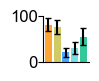

C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


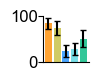

C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


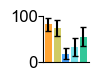

In [89]:
mpl.rcParams['pdf.fonttype'] = 42
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 12
for crop in crops:
    all_probs = []
    all_std = []
    ssp='historical'
    yield_loss=results[exp][ssp][crop]['yield_loss'][:]
    ssi=results[exp][ssp][crop]['ssi'][:]
    prob=(((yield_loss<0)&(ssi<-0.42)).sum(dim='time')/(ssi<-0.42).sum(dim='time'))*100
    prob=prob.where(prob!=0)
    dominant_type=dom(crop,ssp)
    for i in range(6):
        all_probs.append(float(prob.where(dominant_type==i).mean().values))
        all_std.append(float(prob.where(dominant_type==i).std().values))
    fig, ax = plt.subplots(figsize=(0.6,0.6))
    
    bars = plt.bar(range(len(all_probs)), all_probs, 
                   yerr=all_std, 
                   capsize=2, 
                   color=colors,
                   alpha=0.8)
    ax.set_ylim(0,100)
    ax.set_xticks([])       # 去掉刻度
    ax.set_xticklabels([])  # 去掉标签
    ax.tick_params(axis='x', which='both', length=0)  # 去掉刻度线
    ax.yaxis.set_tick_params(pad=0)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    plt.savefig(
        rf'D:\AAUDE\paper\paper8\manu\fig\historical_impact\drought_dmonati_prob_{crop}_{ssp}.pdf',
        format='pdf',
        bbox_inches='tight',
        dpi=300,
    )
    plt.show()

In [34]:
import numpy as np
import xarray as xr
from os.path import join
ssps = ['historical', 'ssp126', 'ssp585']
crops = ['mai', 'soy', 'whe']
def dom(crop,ssp):
    ds = xr.open_dataset(rf"D:\AAUDE\paper\paper8\data\PCMCI\pcmci_{crop}_{ssp}_default.nc")
    area_path = join(r'D:\AAUDE\paper\paper8\data\area', f'spam2020_v1r0_global_H_{crop}_R.nc')
    area = xr.open_dataset(area_path)[list(xr.open_dataset(area_path).data_vars)[0]]
    val_spei = ds['spei_to_yield_strength']
    pval_spei = ds['spei_to_yield_pval']
    val_ssi = ds['ssi_to_yield_strength']
    pval_ssi = ds['ssi_to_yield_pval']
    
    
    dominant_type = xr.full_like(val_spei, 4, dtype=int)  # 初始化为4，代表“无主导”或“未分类”
    
    # 条件先定义，注意这里是替换条件，不用取反
    cond_drought1 = ((pval_spei < 0.05) & (val_spei > 0.5)) | ((pval_ssi < 0.05) & (val_ssi > 0.5))  # 强干旱
    cond_drought = ((pval_spei < 0.05) & (val_spei > 0.3)) | ((pval_ssi < 0.05) & (val_ssi > 0.3))    # 弱干旱
    
    cond_flood1 = ((pval_ssi < 0.05) & (val_ssi < -0.5)) | ((pval_spei < 0.05) & (val_spei < -0.5))  # 强洪涝
    cond_flood = ((pval_ssi < 0.05) & (val_ssi < -0.3)) | ((pval_spei < 0.05) & (val_spei < -0.3))   # 弱洪涝
    
    # 先赋予强条件
    
    
    # 再赋予弱条件（只有原值不是强条件才会赋）
    dominant_type = dominant_type.where(~cond_drought,1)  # 弱干旱赋1
    dominant_type = dominant_type.where(~cond_flood,3)    # 弱洪涝赋2
    dominant_type = dominant_type.where(~cond_drought1, 0)  # 强干旱赋0
    dominant_type = dominant_type.where(~cond_flood1, 2)    # 强洪涝赋3
    # dominant_type.name = "dominant_type"
    dominant_type.attrs["long_name"] = "主导类型（0强干旱，1弱干旱，2强洪涝，3弱洪涝，4主导）"

    dominant_type=dominant_type.where(area>1000)
    return(dominant_type)

In [28]:

for crop in crops:
    # for ssp in ssps:
    ssp='ssp585'
    exp='2015co2'
    yield_loss=results[exp][ssp][crop]['yield_loss'][-30:]
    # yield_loss[2].plot()
    # plt.show()
    ssi=results[exp][ssp][crop]['ssi'][-30:]

    losses=(results[exp][ssp][crop]['yield_loss'][-30:].where(results[exp][ssp][crop]['ssi'][-30:]<-0.42).mean()-\
    results['default'][ssp][crop]['yield_loss'][-30:].where(results['default'][ssp][crop]['ssi'][-30:]<-0.42).mean())/\
    results['default'][ssp][crop]['yield_loss'][-30:].where(results['default'][ssp][crop]['ssi'][-30:]<-0.42).mean()
    print(f'{losses.mean().values:.1f}±{losses.std().values:.1f}')

0.5±0.0
1.5±0.0
0.4±0.0


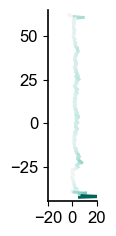

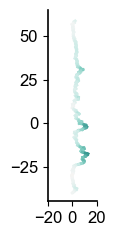

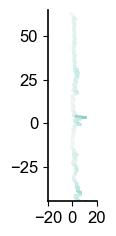

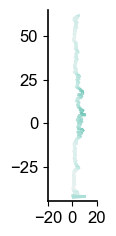

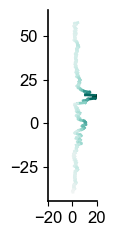

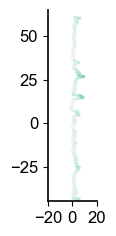

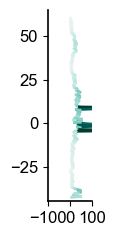

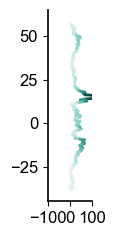

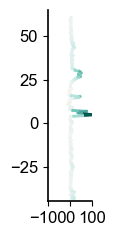

In [12]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

def plot_latitude_profile(prob_da, vmax=100, vmin=30, xlabel='Probability (%)', save_path=None):
    # 按经度方向平均
    lat_mean = prob_da.mean(dim='lon', skipna=True)
    
    fig, ax = plt.subplots(figsize=(1.2, 2.4))
    mpl.rcParams['pdf.fonttype'] = 42
    plt.rcParams["font.family"] = "Arial"
    plt.rcParams["font.size"] = 8
    
    # 创建颜色映射 (RdPu colormap)
    cmap = plt.get_cmap('BrBG')
    norm = plt.Normalize(vmin=vmin, vmax=vmax)
    
    # 为每个纬度点创建渐变颜色
    latitudes = lat_mean['lat'].values
    prob_values = lat_mean.values
    
    # 绘制渐变线
    for i in range(len(latitudes)-1):
        ax.plot([prob_values[i], prob_values[i+1]], 
                [latitudes[i], latitudes[i+1]], 
                color=cmap(norm((prob_values[i]+prob_values[i+1])/2)),  # 取中间值颜色
                linewidth=2)
    
    # 添加colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    # cbar = plt.colorbar(sm, ax=ax, pad=0.02, aspect=10)
    # cbar.set_label(xlabel, labelpad=2)
    
    # ax.set_ylabel('Latitude (°)')
    ax.set_ylim(-45, 65)
    ax.set_xlim(vmin, vmax)
    
    ax.grid(False)  # 不显示网格

    # 去掉右侧和上方边框
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    
    # 保留左和下边框
    ax.spines['left'].set_linewidth(1.2)
    ax.spines['bottom'].set_linewidth(1.2)
    ax.tick_params(axis='y', labelsize=12)
    ax.tick_params(axis='x', labelsize=12)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

# 调用示例
exp = 'default'
for ssp in ssps:
    # ssp='historical'
    if exp == '2015co2' and ssp == 'historical':
            continue
    if ssp!='ssp585':
        vmax=20
    else:
        vmax=100
    for crop in crops:
        yield_loss=results[exp][ssp][crop]['swd'][-30:]
            # yield_loss[2].plot()
            # plt.show()
        ssi=results[exp][ssp][crop]['ssi'][-30:]
        
        losses=yield_loss.where(ssi<-0.42).sum(dim='time')*100/30
        losses=losses.where(losses!=0)
        plot_latitude_profile(losses, vmax=vmax, vmin=-vmax,
                            save_path=rf'D:\AAUDE\paper\paper8\manu\fig\historical_impact\{crop}_{ssp}_probability_loss_latitude.pdf')

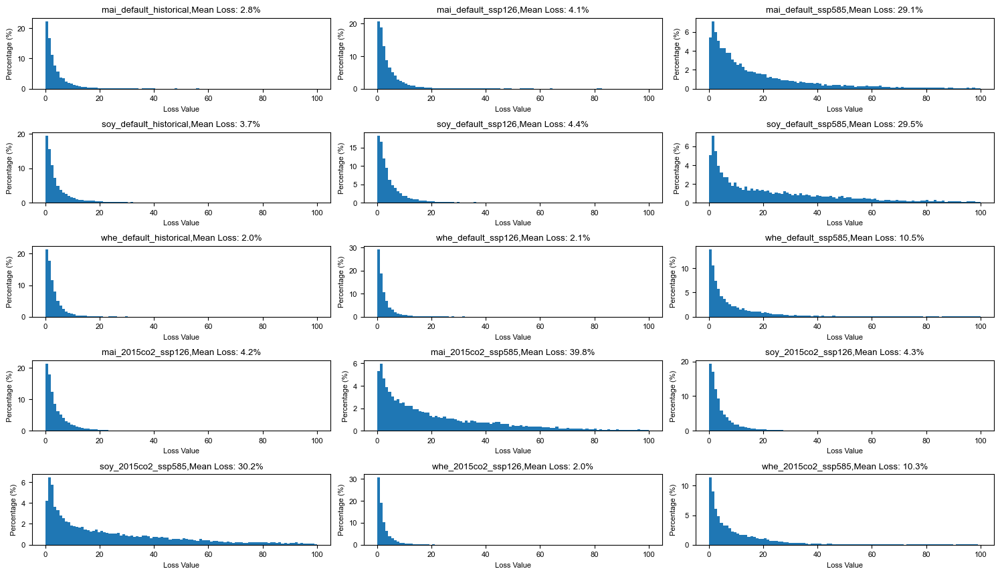

In [61]:
import matplotlib.pyplot as plt
import numpy as np

crops = ['mai','soy','whe']
bins = np.linspace(0, 100, 100)  # 20个等间距的bin

# 创建图形
plt.figure(figsize=(15, 10))

plot_num = 1
for exp in exps:
    for crop in crops:
        for ssp in ssps:
            if exp == '2015co2' and ssp == 'historical':
                continue
                
            yield_loss = results[exp][ssp][crop]['swd'][-30:]
            ssi = results[exp][ssp][crop]['ssi'][-30:]
            losses = yield_loss.where(ssi<-0.42).sum(dim='time')*100/30
            losses = losses.where(losses!=0)
            
            # 转换为numpy数组并过滤nan值
            losses_values = losses.values.flatten()
            losses_values = losses_values[~np.isnan(losses_values)]
            
            # 创建子图
            plt.subplot(len(exps)*len(crops), len(ssps), plot_num)
            
            # 绘制直方图
            hist, bin_edges = np.histogram(losses_values, bins=bins)
            bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
            percentages = hist / len(losses_values) * 100
            
            plt.bar(bin_centers, percentages, width=bin_edges[1]-bin_edges[0])
            
            plt.title(f'{crop}_{exp}_{ssp},Mean Loss: {losses.mean().values:.1f}%')
            plt.xlabel('Loss Value')
            plt.ylabel('Percentage (%)')
            
            plot_num += 1

plt.tight_layout()
plt.show()

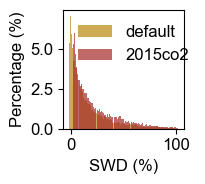

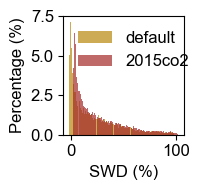

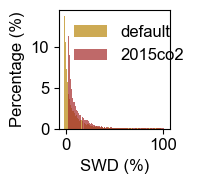

In [134]:
import matplotlib.pyplot as plt
import numpy as np

crops = ['mai', 'soy', 'whe']
ssps_to_plot = ['ssp126', 'ssp585']  # 两种SSP情景
exps_to_plot = ['default', '2015co2']  # 两种实验
bins = np.linspace(0, 100, 100)  # 20个bin
color=['darkgoldenrod','brown']
# plt.figure(figsize=(15, 10))

# 创建子图：每行一种SSP，每列一种作物
# for  ssp in (ssps_to_plot):
ssp=ssps[-1]
for i, crop in enumerate(crops):
    plt.figure(figsize=(2, 2))
    mpl.rcParams['pdf.fonttype'] = 42
    plt.rcParams["font.family"] = "Arial"
    plt.rcParams["font.size"] = 12
    for j,exp in enumerate(exps_to_plot):
        # 跳过无效组合
        if exp == '2015co2' and ssp == 'historical':
            continue
            
        # 获取数据
        yield_loss = results[exp][ssp][crop]['swd'][-30:]
        ssi = results[exp][ssp][crop]['ssi'][-30:]
        losses = yield_loss.where(ssi < -0.42).sum(dim='time') * 100 / 30
        losses = losses.where(losses != 0)
        
        # 处理数据
        losses_values = losses.values.flatten()
        losses_values = losses_values[~np.isnan(losses_values)]
        
        # 计算直方图
        hist, bin_edges = np.histogram(losses_values, bins=bins)
        bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
        percentages = hist / len(losses_values) * 100 if len(losses_values) > 0 else np.zeros_like(bin_centers)
        
        # 绘制柱状图
        label = f'{exp}'
        offset = 2 if exp == '2015co2' else -2  # 实验间偏移
        plt.bar(
            bin_centers + offset,
            percentages,
            width=bin_edges[1] - bin_edges[0] - 2,
            alpha=0.7,
            label=label,
            color=color[j]
        )
    
    # 设置子图属性
    # plt.title(f'{crop} ({ssp})')
    plt.xlabel('SWD (%)')
    plt.ylabel('Percentage (%)')
    plt.legend(frameon=False) 
    # plt.grid(True, linestyle='--', alpha=0.5)
    # plt.ylim(0, 100)  # 统一y轴范围
    plt.savefig(rf'D:\AAUDE\paper\paper8\manu\fig\historical_impact\{crop}_{ssp}_percentage.pdf', dpi=300, bbox_inches='tight')
    plt.tight_layout()
    plt.show()

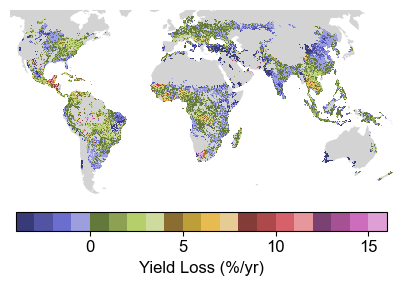

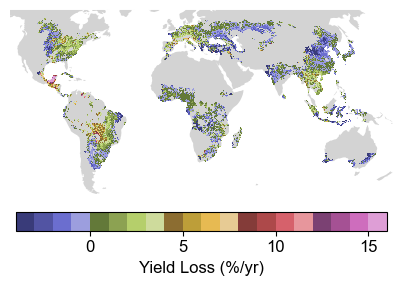

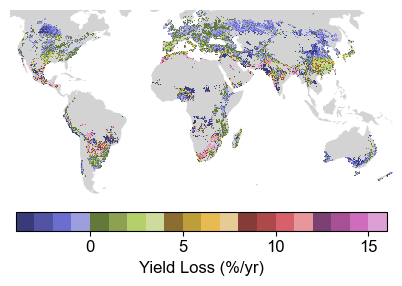

In [194]:
import matplotlib as mpl
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
def draw_dominant(dominant_type,vmax,vmin,save_path):
    # 将0值替换为NaN，这样就不会显示
    dominant_type = dominant_type.where(dominant_type != 0)

    # 绘图
    fig = plt.figure(figsize=(5,3))
    mpl.rcParams['pdf.fonttype'] = 42
    plt.rcParams["font.family"] = "Arial"
    plt.rcParams["font.size"] = 12

    # ax = plt.axes(projection=ccrs.PlateCarree())
    ax = plt.axes(projection=ccrs.Robinson())
    ax.set_extent([-120, 160, -60, 65], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor='lightgray')
    # ax.coastlines(linewidth=0.5)
    # ax.add_feature(cfeature.BORDERS, linewidth=0.3)
    ax.spines['geo'].set_visible(False)
    
    # 绘制处理后的数据（已去除0值）
    im = plt.pcolormesh(dominant_type.lon, dominant_type.lat, dominant_type,vmax=vmax,vmin=vmin,
                        cmap='tab20b', transform=ccrs.PlateCarree())
    

    ax.set_aspect(1)
    cbar = ax.figure.colorbar(im, ax=ax, orientation='horizontal',shrink=0.8, pad=0.05)
    cbar.set_label('Yield Loss (%/yr)')
    
    plt.tight_layout()
    # plt.savefig(
    #     save_path,
    #     format='pdf',
    #     bbox_inches='tight',
    #     dpi=300,
    # )
    plt.show()
exp='2015co2'
# for crop in crops:
#     for ssp in ssps:
#         if ssp=='ssp585':
#             vmax=6
#         else:
#             vmax=3
#         yield_loss=results['default'][ssp][crop]['yield_loss'][-30:]
#         ssi=results['default'][ssp][crop]['ssi'][-30:]
#         losses=yield_loss.where(ssi<-0.42).sum(dim='time')
#         # losses=ssi.where(ssi<-0.42).sum(dim='time')
#         draw_dominant(-losses/30,vmax,-0,rf'D:\AAUDE\paper\paper8\manu\fig\future_compare\spatial_yield_loss_{crop}_{ssp}.pdf')
# for crop in crops:
#     # for ssp in ssps:
#         ssp='ssp585'
#         yield_loss=results[exp][ssp][crop]['yield_loss'][-30:]
#         ssi=results[exp][ssp][crop]['ssi'][-30:]
#         losses=yield_loss.where(ssi<-0.42).sum(dim='time')
#         # losses=ssi.where(ssi<-0.42).sum(dim='time')
#         draw_dominant(-losses/30,6,-0,rf'D:\AAUDE\paper\paper8\manu\fig\future_compare\spatial_yield_loss_{crop}_{ssp}_2015co2.pdf')
for crop in crops:
    # for ssp in ssps:
        ssp='ssp585';exp='default'
        losses=results[exp][ssp][crop]['yield_loss'][-30:].where(results[exp][ssp][crop]['ssi'][-30:]<-0.42).sum(dim='time')-\
    results['default']['historical'][crop]['yield_loss'][-30:].where(results['default']['historical'][crop]['ssi'][-30:]<-0.42).sum(dim='time')
        # losses=ssi.where(ssi<-0.42).sum(dim='time')
        draw_dominant(-losses/30,16,-4,rf'D:\AAUDE\paper\paper8\manu\fig\future_compare\spatial_yield_loss_{crop}_{ssp}_2015co2.pdf')
# for crop in crops:
#     # for ssp in ssps:
#         ssp='ssp585'
#         yield_loss=results['2015co2'][ssp][crop]['yield_loss'][-30:]
#         ssi=results['default'][ssp][crop]['ssi'][-30:]
#         losses=results['2015co2'][ssp][crop]['yield_loss'][-30:].where(results['2015co2'][ssp][crop]['ssi'][-30:]<-0.42).sum(dim='time')-\
#     results['default'][ssp][crop]['yield_loss'][-30:].where(results['default'][ssp][crop]['ssi'][-30:]<-0.42).sum(dim='time')
#         # losses=ssi.where(ssi<-0.42).sum(dim='time')
#         draw_dominant(-losses/30,6,-0,rf'D:\AAUDE\paper\paper8\manu\fig\future_compare\spatial_yield_loss_{crop}_{ssp}_delta.pdf')

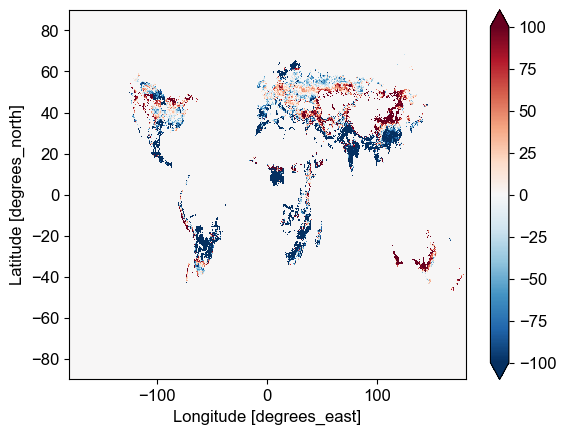

In [198]:
results[exp][ssp][crop]['yield_loss'][-30:].sum(dim='time').plot(vmax=100)

<xarray.DataArray 'yield-mai-noirr' ()> Size: 8B
array(86.89552239)
39.11216002175648


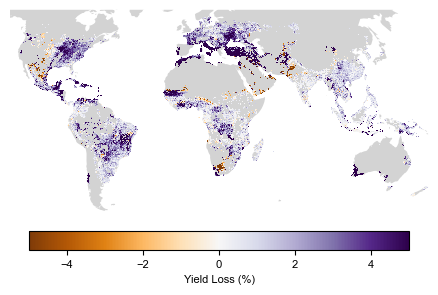

<xarray.DataArray 'yield-soy-noirr' ()> Size: 8B
array(93.78761062)
62.253363784058095


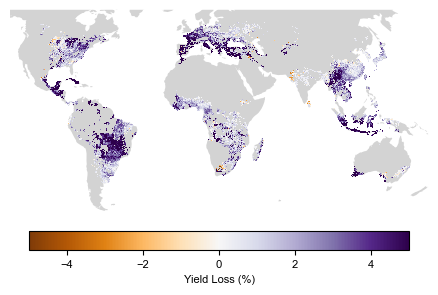

<xarray.DataArray ()> Size: 8B
array(87.5424881)
66.73848030410613


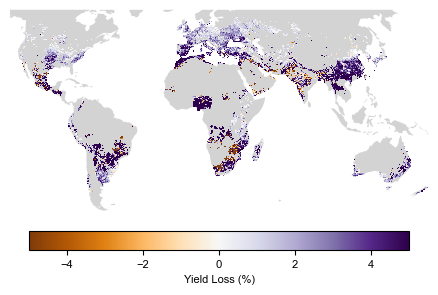

In [19]:
import matplotlib as mpl
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
def draw_dominant(dominant_type,vmax,vmin,save_path):
    # 将0值替换为NaN，这样就不会显示
    dominant_type = dominant_type.where(dominant_type != 0)

    # 绘图
    fig = plt.figure(figsize=(5,3))
    mpl.rcParams['pdf.fonttype'] = 42
    plt.rcParams["font.family"] = "Arial"
    plt.rcParams["font.size"] = 8

    # ax = plt.axes(projection=ccrs.PlateCarree())
    ax = plt.axes(projection=ccrs.Robinson())
    ax.set_extent([-120, 160, -60, 65], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor='lightgray')
    # ax.coastlines(linewidth=0.5)
    # ax.add_feature(cfeature.BORDERS, linewidth=0.3)
    ax.spines['geo'].set_visible(False)
    
    # 绘制处理后的数据（已去除0值）
    im = plt.pcolormesh(dominant_type.lon, dominant_type.lat, dominant_type,vmax=vmax,vmin=vmin,
                        cmap='PuOr', transform=ccrs.PlateCarree())
    

    ax.set_aspect(1)
    cbar = ax.figure.colorbar(im, ax=ax, orientation='horizontal',shrink=0.8, pad=0.05)
    cbar.set_label('Yield Loss (%)')
    
    plt.tight_layout()
    # plt.savefig(
    #     save_path,
    #     format='pdf',
    #     bbox_inches='tight',
    #     dpi=300,
    # )
    plt.show()
# for crop in crops:
#     ssp='ssp585'
#     yield_loss=results['default'][ssp][crop]['yield_loss'][-30:]
#     ssi=results['default'][ssp][crop]['ssi'][-30:]
#     # losses=yield_loss.where(ssi<-0.42).mean(dim='time')
#     losses=ssi.where(ssi<-0.42).sum(dim='time')
#     draw_dominant(losses,20,-20,rf'D:\AAUDE\paper\paper8\manu\fig\historical_impact\spatial_distribuction_{crop}_historical.pdf')
for crop in crops:
    ssp='ssp585';exp='2015co2'
    yield_loss_default=results['default'][ssp][crop]['yield_loss'][-30:]
    yield_loss_2015co2=results['2015co2'][ssp][crop]['yield_loss'][-30:]
    ssi_default=results['default'][ssp][crop]['ssi'][-30:]
    ssi_2015co2=results['2015co2'][ssp][crop]['ssi'][-30:]
    # losses=yield_loss.where(ssi<-0.42).mean(dim='time')
    losses=yield_loss_default.where(ssi_default<-0.42).sum(dim='time')-yield_loss_2015co2.where(ssi_2015co2<-0.42).sum(dim='time')
    losses=losses.where(losses!=0)
    print((losses>0).sum()/losses.count()*100)
    print(losses.median().values)
    draw_dominant(losses/30,5,-5,rf'D:\AAUDE\paper\paper8\manu\fig\future_compare\spatial_yield_compare_{crop}_historical.pdf')
# for crop in crops:
#     ssp='ssp585';exp='2015co2'
#     yield_loss=results['2015co2'][ssp][crop]['yield_loss'][-30:]
#     ssi=results[exp][ssp][crop]['ssi'][-30:]
#     # losses=yield_loss.where(ssi<-0.42).mean(dim='time')
#     losses=results[exp][ssp][crop]['ssi'][-30:].where(results[exp][ssp][crop]['ssi'][-30:]<-0.42).count(dim='time')-\
#     results['default'][ssp][crop]['ssi'][-30:].where(results['default'][ssp][crop]['ssi'][-30:]<-0.42).count(dim='time')
#     losses=losses.where(losses!=0)
#     print((losses>0).sum()/losses.count()*100)
#     draw_dominant(losses/30*100,50,0,rf'D:\AAUDE\paper\paper8\manu\fig\historical_impact\spatial_distribuction_{crop}_historical.pdf')

12.43843265973752


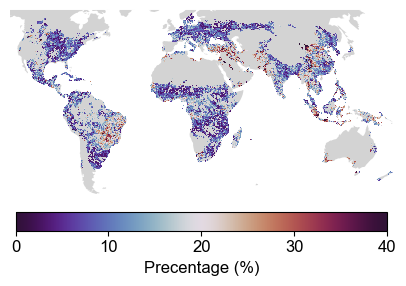

16.525475272703268


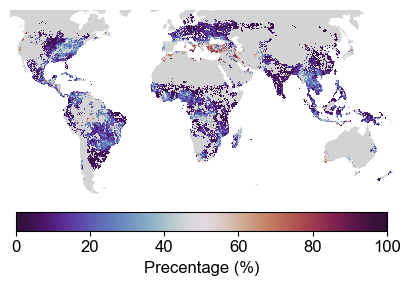

26.327300674937092


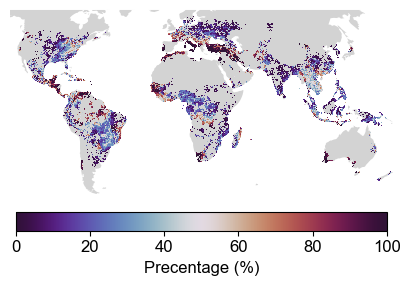

13.75034295068774


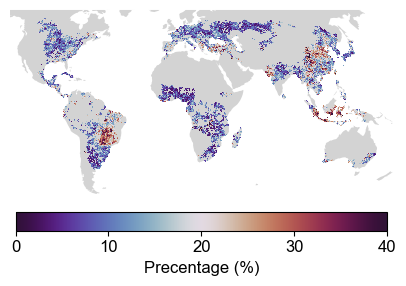

17.467602710330382


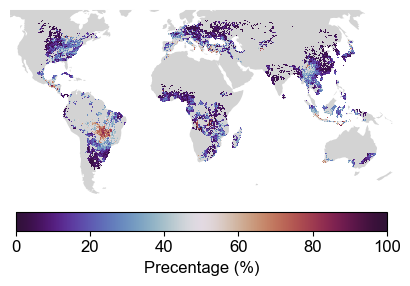

30.27864407013153


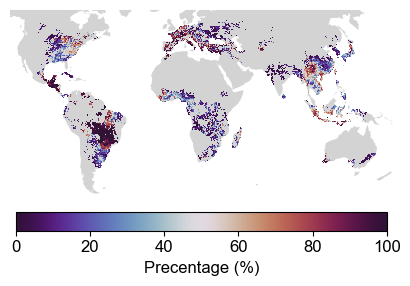

12.764297616013355


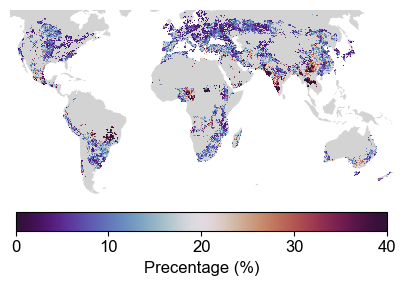

21.246948541718922


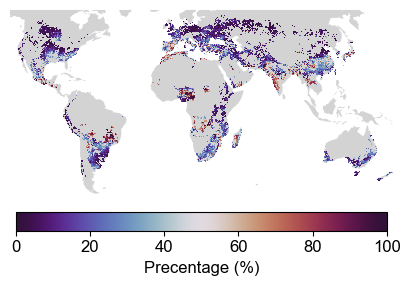

26.550991849382058


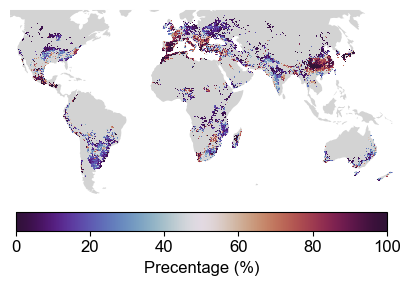

In [183]:
import matplotlib as mpl
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
def draw_dominant(dominant_type,vmax,vmin,save_path):
    # 将0值替换为NaN，这样就不会显示
    dominant_type = dominant_type.where(dominant_type != 0)

    # 绘图
    fig = plt.figure(figsize=(5,3))
    mpl.rcParams['pdf.fonttype'] = 42
    plt.rcParams["font.family"] = "Arial"
    plt.rcParams["font.size"] = 12

    # ax = plt.axes(projection=ccrs.PlateCarree())
    ax = plt.axes(projection=ccrs.Robinson())
    ax.set_extent([-120, 160, -60, 65], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor='lightgray')
    # ax.coastlines(linewidth=0.5)
    # ax.add_feature(cfeature.BORDERS, linewidth=0.3)
    ax.spines['geo'].set_visible(False)
    
    # 绘制处理后的数据（已去除0值）
    im = plt.pcolormesh(dominant_type.lon, dominant_type.lat, dominant_type,vmax=vmax,vmin=vmin,
                        cmap='twilight_shifted', transform=ccrs.PlateCarree())
    

    ax.set_aspect(1)
    cbar = ax.figure.colorbar(im, ax=ax, orientation='horizontal',shrink=0.8, pad=0.05)
    cbar.set_label('Precentage (%)')
    
    plt.tight_layout()
    # plt.savefig(
    #     save_path,
    #     format='pdf',
    #     bbox_inches='tight',
    #     dpi=300,
    # )
    plt.show()
# for crop in crops:
#     for ssp in ssps:
#         if ssp=='historical':
#             vmax=40
#         else:
#             vmax=100
#         # yield_loss=results['default']['historical'][crop]['yield_loss'][-30:]
#         ssi=results['default'][ssp][crop]['ssi'][-30:]
#         losses=(ssi<-0.42).sum(dim='time')/(ssi).count(dim='time')*100
#         draw_dominant(losses,vmax,0,rf'D:\AAUDE\paper\paper8\manu\fig\historical_impact\spatial_distribuction_{crop}_{ssp}.pdf')
for crop in crops:
    for ssp in ssps:
        # ssp=ssps[-1]
        if ssp=='historical':
            vmax=40
        else:
            vmax=100
        # yield_loss=results['default']['historical'][crop]['yield_loss'][-30:]
        ssi=results['default'][ssp][crop]['ssi'][-30:]
        losses=(ssi<-0.42).sum(dim='time')/(ssi).count(dim='time')*100
        print(losses.mean().values)
        draw_dominant(losses,vmax,0,rf'D:\AAUDE\paper\paper8\manu\fig\historical_impact\spatial_distribuction_{crop}_{ssp}_2015co2.pdf')


# for crop in crops:
#     # for ssp in ssps:
#         ssp=ssps[-1]
#         if ssp=='historical':
#             vmax=40
#         else:
#             vmax=30
#         ssi=results['2015co2'][ssp][crop]['ssi'][-30:]
#         losses=(results['2015co2'][ssp][crop]['ssi'][-30:]<-0.42).sum(dim='time')/(results['2015co2'][ssp][crop]['ssi'][-30:]).count(dim='time')*100-\
#     (results['default'][ssp][crop]['ssi'][-30:]<-0.42).sum(dim='time')/(results['default'][ssp][crop]['ssi'][-30:]).count(dim='time')*100
#         draw_dominant(losses,vmax,0,rf'D:\AAUDE\paper\paper8\manu\fig\historical_impact\spatial_distribuction_{crop}_{ssp}_delta.pdf')

ERROR! Session/line number was not unique in database. History logging moved to new session 1041


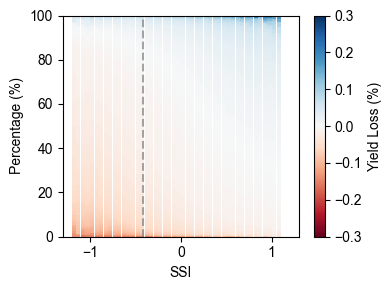

KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x000001E29C15D3A0> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x000001E333083CE0> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

In [7]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm
import matplotlib as mpl
from pathlib import Path
import matplotlib.ticker as mticker

plt.rcParams['font.family'] = 'Arial'

# =======================
# 参数设置
exps = ['default','2015co2']
ssps = ['historical', 'ssp126', 'ssp585']
crops = ['mai','soy','whe']

ssi_bins = np.arange(-3, 3.1, 0.05)     # 干旱指数 bin
yield_bins = np.arange(-2, 2.1, 0.02)   # 产量损失 bin

# =======================
# 生成结果函数
def analyze_drought_bins_stacked(result_dict1, result_dict2):
    results = {}
    for exp in exps:
        results[exp] = {}
        for ssp in tqdm(ssps, desc='Processing SSPs'):
            if exp=='2015co2' and ssp=='historical':
                continue
            results[exp][ssp] = {}
            idx = 33 if ssp=='historical' else 30
            for crop in tqdm(crops, desc='Processing Crops', leave=False):
                dominant_type = xr.open_dataset(
                    rf"D:\AAUDE\paper\paper8\data\PCMCI\dominant_type_{crop}_{ssp}_default.nc"
                ).spei_to_yield_strength

                expect_yield = result_dict2[exp][ssp][crop]['expect_yield'][-idx:]
                yied = result_dict1[exp][ssp][crop]['yield'][-idx:]
                yied = yied.where(yied>0)
                yield_loss = (yied - expect_yield) / expect_yield  # 比例

                ssi = result_dict1[exp][ssp][crop]['ssi'][-idx:]
                mask = (abs(yield_loss)<2) & ((dominant_type==0)|(dominant_type==1))
                ssi = ssi.where(mask)
                yield_loss = yield_loss.where(mask)

                # 统计每个干旱指数 bin 中产量损失落在 yield_bins 的数量
                counts = []
                for i in range(len(ssi_bins)-1):
                    lower, upper = ssi_bins[i], ssi_bins[i+1]
                    di_mask = ((ssi>=lower) & (ssi<upper)).values
                    yl_bin = yield_loss.values[di_mask]
                    yl_bin = yl_bin[~np.isnan(yl_bin)]
                    # np.histogram 统计数量
                    hist, _ = np.histogram(yl_bin, bins=yield_bins)
                    counts.append(hist)
                results[exp][ssp][crop] = np.array(counts)  # shape=(len(ssi_bins)-1, len(yield_bins)-1)
    return results

# =======================
# 绘制堆叠柱状图（y 轴百分比，过滤<200样本的区间）
def plot_drought_yield_stacked_percent(results, exp, crop, ssp, 
                                       ssi_bins=ssi_bins, yield_bins=yield_bins, 
                                       min_count=100):
    
    counts = results[exp][ssp][crop].astype(float)
    
    # 按行计算总样本数
    row_sums = counts.sum(axis=1)
    mask_valid = row_sums >= min_count
    counts[~mask_valid, :] = np.nan
    
    # 百分比
    counts_percent = (counts.T / row_sums).T * 100

    # 用干旱指数 bin 中心值作为 x 坐标
    center_vals = np.array([(ssi_bins[i] + ssi_bins[i+1]) / 2 for i in range(len(ssi_bins)-1)])
    width = (ssi_bins[1] - ssi_bins[0]) * 0.9  # 宽度占 bin 间距的 90%
    
    # 颜色映射
    colors = plt.cm.RdBu(np.linspace(0, 1, len(yield_bins)-1))

    fig, ax = plt.subplots(figsize=(4,3))
    bottoms = np.zeros(len(center_vals))
    for j in range(len(yield_bins)-1):
        ax.bar(center_vals, counts_percent[:, j], width, 
               bottom=bottoms, color=colors[j], edgecolor='none', align='center')
        valid_vals = np.nan_to_num(counts_percent[:, j], nan=0.0)
        bottoms += valid_vals
    
    ax.set_xlabel('SSI')
    ax.set_ylabel('Percentage (%)')
    if ssp == 'ssp585':
        x_min, x_max = -2.2, 2.2
    else:
        x_min, x_max = -1.3, 1.3
    ax.set_xlim(x_min, x_max)
    
    # 只保留范围内的刻度
    # xtick_vals = center_vals[(center_vals >= x_min) & (center_vals <= x_max)]
    # ax.set_xticks(xtick_vals[::5])
    # ax.set_xticklabels([f'{v:.1f}' for v in xtick_vals[::5]], rotation=45)

    ax.axvline(-0.42, color='gray', linestyle='--', alpha=0.7, label='Drought Threshold')

    # colorbar
    sm = plt.cm.ScalarMappable(cmap='RdBu', norm=plt.Normalize(vmin=-0.3, vmax=0.3))
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label('Yield Loss (%)')
    # plt.savefig(rf'D:\AAUDE\paper\paper8\manu\fig\historical_impact\loss_percentage_{crop}_{ssp}_{exp}.pdf', dpi=300, bbox_inches='tight')
    plt.tight_layout()
    plt.show()


# results = analyze_drought_bins_stacked(result_dict1, result_dict2)

for exp in exps:
    for ssp in ssps:
        if exp=='2015co2' and ssp=='historical':
            continue
        for crop in crops:
            plot_drought_yield_stacked_percent(results, exp, crop, ssp)


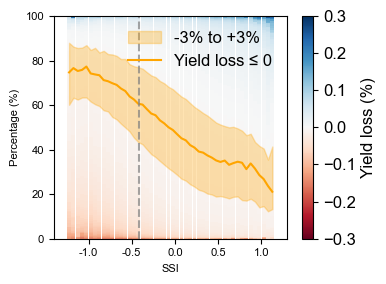

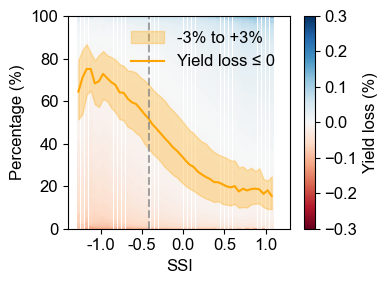

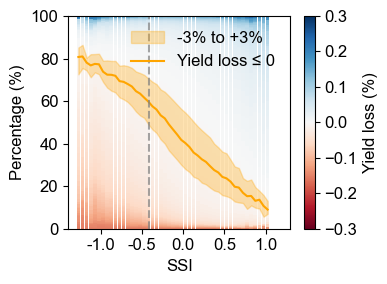

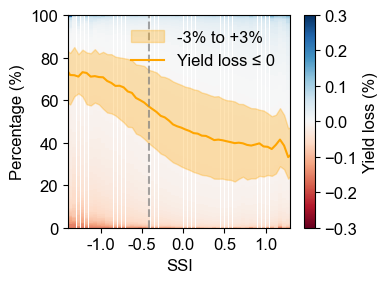

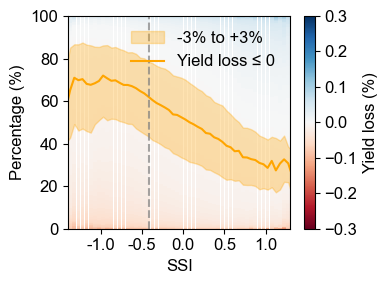

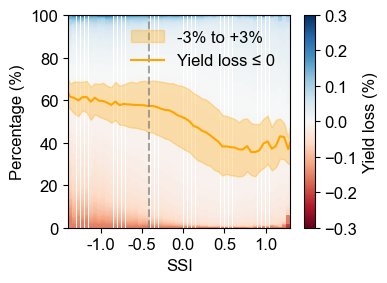

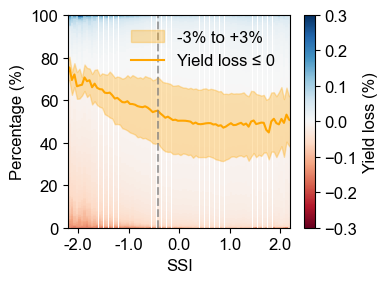

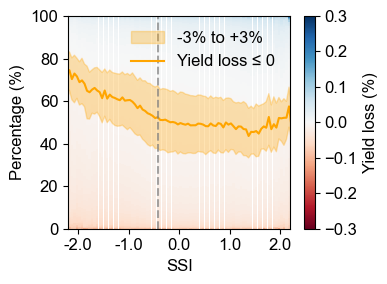

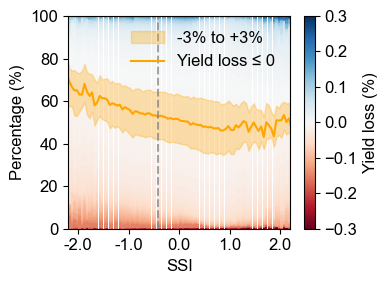

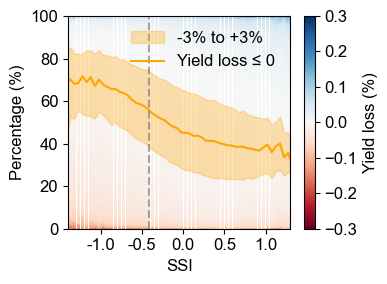

KeyboardInterrupt: 


KeyboardInterrupt



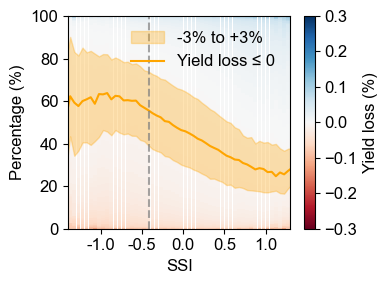

In [150]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

plt.rcParams['font.family'] = 'Arial'

# -----------------------
# 配置
exps = ['default','2015co2']
ssps = ['historical', 'ssp126', 'ssp585']
crops = ['mai','soy','whe']

ssi_bins   = np.arange(-3, 3.1, 0.05)   # 干旱指数 bin
yield_bins = np.arange(-2, 2.1, 0.02)   # 产量损失（比例）bin

# -----------------------
# -----------------------
# 分析数据：增加 -5~0 和 0~5 区间的比例
def analyze_drought_bins_stacked(result_dict1, result_dict2):
    results = {}
    for exp in exps:
        results[exp] = {}
        for ssp in tqdm(ssps, desc='Processing SSPs'):
            if exp=='2015co2' and ssp=='historical':
                continue
            results[exp][ssp] = {}
            idx = 33 if ssp=='historical' else 30

            for crop in tqdm(crops, desc='Processing Crops', leave=False):
                dominant_type = xr.open_dataset(
                    rf"D:\AAUDE\paper\paper8\data\PCMCI\dominant_type_{crop}_{ssp}_default.nc"
                ).spei_to_yield_strength

                expect_yield = result_dict2[exp][ssp][crop]['expect_yield'][-idx:]
                yied         = result_dict1[exp][ssp][crop]['yield'][-idx:]
                yied         = yied.where(yied > 0)
                yield_loss   = (yied - expect_yield) / expect_yield   # 比例

                ssi  = result_dict1[exp][ssp][crop]['ssi'][-idx:]
                mask = (np.abs(yield_loss) < 2) #& ((dominant_type==0)|(dominant_type==1))
                ssi  = ssi.where(mask)
                yield_loss = yield_loss.where(mask)

                counts_list   = []
                row_sums_list = []
                pct_nonpos    = []
                pct_neg5_0    = []  # -5%~0%
                pct_0_pos5    = []  # 0%~5%
                centers       = []

                for i in range(len(ssi_bins)-1):
                    lower, upper = ssi_bins[i], ssi_bins[i+1]
                    centers.append((lower+upper)/2)

                    di_mask = ((ssi >= lower) & (ssi < upper)).values
                    yl_bin  = yield_loss.values[di_mask]
                    yl_bin  = yl_bin[~np.isnan(yl_bin)]

                    hist, _ = np.histogram(yl_bin, bins=yield_bins)
                    counts_list.append(hist)

                    n_total = len(yl_bin)
                    row_sums_list.append(n_total)
                    if n_total > 0:
                        pct_nonpos.append(100.0 * np.sum(yl_bin <= 0) / n_total)
                        pct_neg5_0.append(100.0 * np.sum((yl_bin > -0.03) & (yl_bin <= 0)) / n_total)
                        pct_0_pos5.append(100.0 * np.sum((yl_bin > 0) & (yl_bin <= 0.03)) / n_total)
                    else:
                        pct_nonpos.append(np.nan)
                        pct_neg5_0.append(np.nan)
                        pct_0_pos5.append(np.nan)

                results[exp][ssp][crop] = {
                    'counts':     np.array(counts_list),
                    'centers':    np.array(centers),
                    'row_sums':   np.array(row_sums_list),
                    'pct_nonpos': np.array(pct_nonpos),
                    'pct_neg5_0': np.array(pct_neg5_0),
                    'pct_0_pos5': np.array(pct_0_pos5)
                }
    return results

# -----------------------
def plot_drought_yield_stacked_percent(results, exp, crop, ssp,
                                       ssi_bins=ssi_bins, yield_bins=yield_bins,
                                       min_count=100):

    R = results[exp][ssp][crop]
    counts    = R['counts'].astype(float)
    centers   = R['centers']
    row_sums  = R['row_sums'].astype(float)
    pct_line  = R['pct_nonpos'].astype(float)
    pct_neg5_0 = R['pct_neg5_0'].astype(float)
    pct_0_pos5 = R['pct_0_pos5'].astype(float)

    valid = row_sums >= min_count
    counts[~valid, :] = np.nan
    pct_line[~valid] = np.nan
    pct_neg5_0[~valid] = np.nan
    pct_0_pos5[~valid] = np.nan

    with np.errstate(invalid='ignore', divide='ignore'):
        counts_percent = (counts.T / row_sums).T * 100

    width  = (ssi_bins[1] - ssi_bins[0]) * 0.9
    colors = plt.cm.RdBu(np.linspace(0, 1, len(yield_bins)-1))

    fig, ax = plt.subplots(figsize=(4,3))
    mpl.rcParams['pdf.fonttype'] = 42
    plt.rcParams["font.family"] = "Arial"
    plt.rcParams["font.size"] = 12
    bottoms = np.zeros_like(centers, dtype=float)

    for j in range(len(yield_bins)-1):
        vals = counts_percent[:, j]
        vals = np.nan_to_num(vals, nan=0.0)
        ax.bar(centers, vals, width, bottom=bottoms, color=colors[j], edgecolor='none', align='center')
        bottoms += vals

    # 阴影：下边界 = pct_neg5_0, 上边界 = pct_neg5_0 + pct_0_pos5
    lower = pct_line-pct_neg5_0
    upper = pct_line + pct_0_pos5
    ax.fill_between(centers, lower, upper, color='orange', alpha=0.3, label='-3% to +3%')

    # 折线marker='o',
    ax.plot(centers, pct_line, color='orange', lw=1.5,  ms=2.5, label='Yield loss ≤ 0')

    ax.set_xlabel('SSI')
    ax.set_ylabel('Percentage (%)')

    if ssp == 'ssp585':
        x_min, x_max = -2.2, 2.2
        ax.set_xlim(x_min, x_max)
        tick_start = np.ceil(x_min / 0.5) * 0.5
        ticks = np.arange(tick_start, x_max + 1e-9, 1)
        ax.set_xticks(ticks)
        ax.set_xticklabels([f'{t:.1f}' for t in ticks])
    else:
        x_min, x_max = -1.4, 1.3
        ax.set_xlim(x_min, x_max)
        tick_start = np.ceil(x_min / 0.5) * 0.5
        ticks = np.arange(tick_start, x_max + 1e-9, 0.5)
        ax.set_xticks(ticks)
        ax.set_xticklabels([f'{t:.1f}' for t in ticks])

    ax.axvline(-0.42, color='gray', linestyle='--', alpha=0.7)

    sm = plt.cm.ScalarMappable(cmap='RdBu', norm=plt.Normalize(vmin=-0.3, vmax=0.3))
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label('Yield loss (%)')

    ax.legend(frameon=False, loc='upper right')
    plt.tight_layout()
    plt.savefig(rf'D:\AAUDE\paper\paper8\manu\fig\historical_impact\loss_percentage_{crop}_{ssp}_{exp}_all.pdf', dpi=300, bbox_inches='tight')
    plt.show()

# results = analyze_drought_bins_stacked(result_dict1, result_dict2)

for exp in exps:
    for ssp in ssps:
        if exp=='2015co2' and ssp=='historical':
            continue
        for crop in crops:
            plot_drought_yield_stacked_percent(results, exp, crop, ssp)

### SWD


Processing: mai - historical


  0%|          | 0/49 [00:00<?, ?it/s]

49


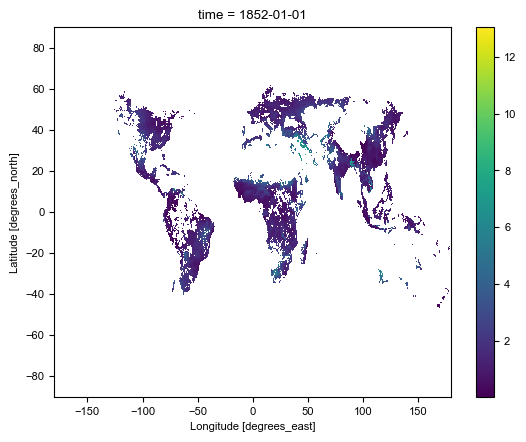


Processing: mai - ssp126


  0%|          | 0/49 [00:00<?, ?it/s]

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x0000015B6EBACD50>>
Traceback (most recent call last):
  File "C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\ipykernel\ipkernel.py", line 775, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(

KeyboardInterrupt: 


KeyboardInterrupt: 


KeyboardInterrupt



In [114]:
import xarray as xr
import pandas as pd
import numpy as np
from pathlib import Path
from os.path import join
from tqdm.notebook import tqdm

# === 参数设置 ===
crops = ['mai', 'wwh','swh', 'soy']
ssps = ['historical', 'ssp126', 'ssp585']
base_path = Path(r'E:\isimip3b_agricultal')
out_dir = Path(r'D:\AAUDE\paper\paper8\data\swdd_series')
out_dir.mkdir(exist_ok=True)

for exp in ['default', '2015co2']:
    for crop in crops:
        area_path = join(r'D:\AAUDE\paper\paper8\data\area', f'spam2020_v1r0_global_H_{crop}_R.nc')
        area = xr.open_dataset(area_path)[list(xr.open_dataset(area_path).data_vars)[0]]
        
        for ssp in ssps:
            ds_list =None
            print(f"\nProcessing: {crop} - {ssp}")
            if ssp == 'historical':
                years = np.arange(1850, 2015)
            else:
                years = np.arange(2015, 2101)
            time_coords = pd.to_datetime([f"{year}-01-01" for year in years])
            pir_files = sorted(list((base_path / 'pirnreqcum').glob(f'*_{ssp}_2015soc_{exp}_pirnreqcum-{crop}-firr_global_annual-gs*.nc')))
            day_files = [join(base_path, 'matyday', str(i).split('\\')[-1].replace(f'pirnreqcum-{crop}-firr', f'matyday-{crop}-noirr')) for i in pir_files]
            aaa=0
            for pir_file, day_file in tqdm(zip(pir_files, day_files), total=len(pir_files)):
                # if day_file.split('\\')[-1].split('_')[0]=='promet':
                    # continue
                    ds_pir = xr.open_dataset(pir_file, decode_times=False)[50:]
                    try:
                        ds_day = xr.open_dataset(day_file, decode_times=False)[50:]
                    except FileNotFoundError:
                        print(f"缺少文件，跳过: {day_file}")
                        continue
                    except Exception as e:
                        print(f"打开文件错误: {day_file}, 错误信息: {e}")
                        continue
    
                    pir = ds_pir[f'pirnreqcum-{crop}-firr'].where(area > 0)
                    maty = ds_day[f'matyday-{crop}-noirr'].where(area > 0)
    
                    swd = pir /maty
                    swd=swd.where((maty>0)&(pir>0))
                    swd=swd.assign_coords(time=time_coords) 
                    # ds_list += [swd]
                    if ds_list is None:
                        ds_list = swd.fillna(0) 
                    else:
                        ds_list += swd.fillna(0)   
                    aaa+=1
            combined = ds_list/aaa
            combined=combined.where(np.isfinite(combined))
            # combined = xr.concat(ds_list, dim="model")  # "model" 可以是任意维度名
            # combined = combined.median(dim="model", skipna=True)
            combined=combined.where(combined!=0)
            print(aaa)
            combined[2].plot()
            plt.show()
            combined.rename('swd').to_netcdf(rf'D:\AAUDE\paper\paper8\data\result2\swd_daily_{crop}_{ssp}_{exp}.nc')

In [2]:
import xarray as xr
import matplotlib.pyplot as plt
import os
from pathlib import Path
from os.path import join
import numpy as np
import pandas as pd
import dask
from dask.distributed import Client, LocalCluster
cluster = LocalCluster(n_workers=8, threads_per_worker=4)
client = Client(cluster)

# 中位数函数使用 dask 加速
def median_mod_dask(evp_files, var, time):
    ds_list = []
    for i, file in enumerate(evp_files):
        ccfile=join(base_path, 'matyday', str(file).split('\\')[-1].replace(f'pirnreqcum-{crop}-firr', f'matyday-{crop}-noirr'))
        # print(ccfile)
        try:
            cc=xr.open_dataset(ccfile, decode_times=False,engine='netcdf4', chunks={})[f'matyday-{crop}-noirr']
            da = xr.open_dataset(file, decode_times=False, chunks={})[var]/cc
            # 添加时间轴（按顺序分配）
            da['time'] = time  # 确保有 time 维
            ds_list.append(da)
        except :
            continue
    combined = xr.concat(ds_list, dim='stack_dim')  # 按时间拼接
    median_ds = combined.median(dim='stack_dim', skipna=True)  # 对时间维求中位数
    return median_ds

exps=['default','2015co2']
fp = r'E:\isimip3b_agricultal'
crops = ['mai', 'swh', 'wwh', 'soy']
ssps = ['historical', 'ssp126', 'ssp585']
for exp in exps:
    for crop in crops:
        for ssp in ssps:
            print(f"Processing {crop} - {ssp}")
            base_path = Path(r'E:\isimip3b_agricultal')
            if ssp == 'historical':
                time = pd.date_range("1850-01-01", "2014-12-01", freq='YS')
            else:
                time = pd.date_range("2015-01-01", "2100-12-01", freq='YS')
    
            # 文件路径列表
            pir_files = sorted(list((base_path / 'pirnreqcum').glob(f'*_{ssp}_2015soc_{exp}_pirnreqcum-{crop}-firr_global_annual-gs*.nc')))
    
            # 并行惰性计算
            pirnreqcum = median_mod_dask(pir_files, f'pirnreqcum-{crop}-firr',time)
            pirnreqcum['time'] = time
            pirnreqcum.compute().to_netcdf(rf'D:\AAUDE\paper\paper8\data\result2\swd_{crop}_{ssp}_median_{exp}.nc')

C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\distributed\node.py:187: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 63393 instead
  warnings.warn(


Processing mai - historical
Processing mai - ssp126
Processing mai - ssp585
Processing swh - historical
Processing swh - ssp126
Processing swh - ssp585
Processing wwh - historical
Processing wwh - ssp126
Processing wwh - ssp585
Processing soy - historical
Processing soy - ssp126
Processing soy - ssp585
Processing mai - historical
Processing mai - ssp126
Processing mai - ssp585
Processing swh - historical
Processing swh - ssp126
Processing swh - ssp585
Processing wwh - historical
Processing wwh - ssp126
Processing wwh - ssp585
Processing soy - historical
Processing soy - ssp126
Processing soy - ssp585


In [3]:
pirnreqcum

<xarray.DataArray (time: 86, lat: 360, lon: 720)> Size: 178MB
dask.array<nanmedian, shape=(86, 360, 720), dtype=float64, chunksize=(1, 360, 720), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float64 6kB -179.8 -179.2 -178.8 -178.2 ... 178.8 179.2 179.8
  * lat      (lat) float64 3kB 89.75 89.25 88.75 88.25 ... -88.75 -89.25 -89.75
  * time     (time) datetime64[ns] 688B 2015-01-01 2016-01-01 ... 2100-01-01

In [1]:
import xarray as xr
import pandas as pd
import numpy as np
from pathlib import Path
from os.path import join
from tqdm.notebook import tqdm
crops = ['mai', 'wwh','swh', 'soy']
ssps = ['historical', 'ssp126', 'ssp585']
for exp in ['default', '2015co2']:
    for crop in crops:
        area_path = join(r'D:\AAUDE\paper\paper8\data\area', f'spam2020_v1r0_global_H_{crop}_R.nc')
        area = xr.open_dataset(area_path)[list(xr.open_dataset(area_path).data_vars)[0]]
        
        for ssp in ssps:
            pir=xr.open_dataset(rf"D:\AAUDE\paper\paper8\data\result2\pirnreqcum_{crop}_{ssp}_median_{exp}.nc")[f'pirnreqcum-{crop}-firr']
            matyday=xr.open_dataset(rf"D:\AAUDE\paper\paper8\data\result2\matyday_{crop}_{ssp}_median_{exp}.nc")[f'matyday-{crop}-noirr']
            swd=pir/matyday
            swd=swd.where((area>0)&(matyday>0))
            # swd[0].plot(vmin=-10)
            swd.rename('swd').to_netcdf(rf'D:\AAUDE\paper\paper8\data\result2\swd_daily_{crop}_{ssp}_{exp}.nc')
        #     swd.mean(dim=['lat','lon']).plot(label=f'{ssp}')
        # plt.title(f'{crop}_{exp}')
        # plt.legend()
        # plt.show()

### trend

In [54]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np

def plot_trend(slope, p,vmax,vmin,cmap, title, save_path):
   
    # Set up figure and projection
    fig_width_cm = 8.7
    fig_height_cm = fig_width_cm * 0.5  # 高度按比例调整
    fig = plt.figure(figsize=(fig_width_cm/2.54, fig_height_cm/2.54))
    mpl.rcParams['pdf.fonttype'] = 42
    # 2. 字体设置（Nature 推荐使用无衬线字体，如 Arial）
    plt.rcParams["font.family"] = "Arial"
    plt.rcParams["font.size"] = 8  # 基础字号为 8pt

    ax = plt.axes(projection=ccrs.Robinson())
    ax.set_extent([-120, 160, -60, 65], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor='lightgray')
    ax.spines['geo'].set_visible(False)  # 移除边框
    
    # Plot trend data
    im = slope.plot(ax=ax, transform=ccrs.PlateCarree(),vmax=vmax,vmin=vmin,
                   cmap=cmap, robust=True,
                   add_colorbar=False)
    
    # Add significance hatching
    sig = (p < 0.05) & (~np.isnan(slope))
    ax.contourf(sig.lon, sig.lat, sig, 
                colors='none', hatches=['////'], 
                levels=[0.5, 1.5], transform=ccrs.PlateCarree(),
                alpha=0)  # Makes the hatching more visible
    
    # Custom colorbar
    cbar_ax = fig.add_axes([0.15, 0.08, 0.7, 0.02])  # [left, bottom, width, height]
    cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal',
                       extend='both', pad=0.1)
    cbar.set_label('Trend (unit/yr)', fontsize=14)
    cbar.ax.tick_params(labelsize=12)
    
    # Gridlines and frame
    gl = ax.gridlines(draw_labels=False)
    gl.xlines = False
    gl.ylines = False
    # gl.xlabel_style = {'size': 10}
    # gl.ylabel_style = {'size': 10}
    # plt.title(title)
    # Remove frame
    ax.spines['geo'].set_visible(False)
    output_path = save_path.replace('.svg', '.eps')  # 替换为 .eps 扩展名
    # plt.savefig(
    #     output_path,
    #     format='pdf',  # 指定输出 EPS 格式
    #     bbox_inches='tight',  # 紧凑布局
    #     dpi=300,  # 虽然 EPS 是矢量，但某些元素可能受 DPI 影响
    # )
    # plt.tight_layout()
    plt.show()

In [50]:
import xarray as xr
from os.path import join
import numpy as np
# 定义所有需要遍历的维度
ssps = ['historical', 'ssp126', 'ssp585']
crops = ['mai', 'soy', 'whe']
drought_vars = ['ssi', 'spei']
exps=['default','2015co2']
# var='ssi'
result_dict2 = {
    exp:{ssp: {
            crop: {} for crop in crops
    } for ssp in ssps} for exp in exps
}
def change(data,yied,ssp):
    data = data[1:].rename({'year': 'time'})
    # if ssp == 'historical':
    data['time']=yied.time.values
    return data.where(np.isfinite(data))

for exp in exps:
    for ssp in ssps:
        if exp =='2015co2' and ssp=='historical':
            continue
        for crop in crops:
            # 特殊处理小麦（合并冬小麦和春小麦）
            if crop == 'whe':
                try:
                    fp = r'D:\AAUDE\paper\paper8\data\trend'
                    area_path = join(r'D:\AAUDE\paper\paper8\data\area', f'spam2020_v1r0_global_H_wwh_R.nc')
                    area_wwh = xr.open_dataset(area_path)[list(xr.open_dataset(area_path).data_vars)[0]]
                    area_path = join(r'D:\AAUDE\paper\paper8\data\area', f'spam2020_v1r0_global_H_swh_R.nc')
                    area_swh = xr.open_dataset(area_path)[list(xr.open_dataset(area_path).data_vars)[0]]
                    ssi_data_wwh = xr.open_dataset(join(fp, f'trend_ssi_wwh_{ssp}_{exp}.nc'))
                    ssi_data_swh = xr.open_dataset(join(fp, f'trend_ssi_swh_{ssp}_{exp}.nc'))
                    spei_data_swh = xr.open_dataset(join(fp, f'trend_spei_swh_{ssp}_default.nc'))
                    spei_data_wwh = xr.open_dataset(join(fp, f'trend_spei_wwh_{ssp}_default.nc'))
                    ssi=ssi_data_wwh.where(area_wwh>0).fillna(0)+ssi_data_swh.where(area_swh>0).fillna(0)
                    spei=spei_data_wwh.where(area_wwh>0).fillna(0)+spei_data_swh.where(area_swh>0).fillna(0)

                    result_dict2[exp][ssp][crop]['spei'] = spei.where(spei!=0)
                    result_dict2[exp][ssp][crop]['ssi'] = ssi.where(ssi!=0)

                except FileNotFoundError:
                    print(f"Warning: 缺少小麦数据文件 for {var}-{ssp}")
                    continue
            else:
                # try:
                fp = r'D:\AAUDE\paper\paper8\data\trend'
                area_path = join(r'D:\AAUDE\paper\paper8\data\area', f'spam2020_v1r0_global_H_{crop}_R.nc')
                area = xr.open_dataset(area_path)[list(xr.open_dataset(area_path).data_vars)[0]]
                ssi_data = xr.open_dataset(join(fp, f'trend_ssi_{crop}_{ssp}_{exp}.nc'))
                spei_data = xr.open_dataset(join(fp, f'trend_ssi_{crop}_{ssp}_{exp}.nc'))


                result_dict2[exp][ssp][crop]['spei'] = spei_data.where(area>0)
                result_dict2[exp][ssp][crop]['ssi'] = ssi_data.where(area>0)


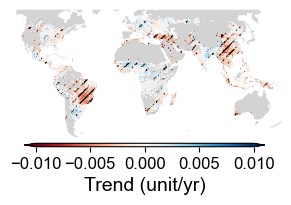

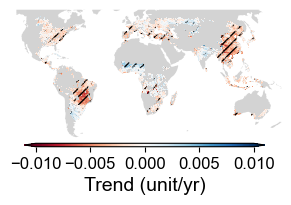

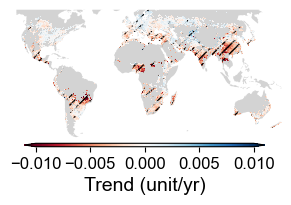

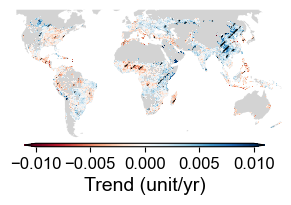

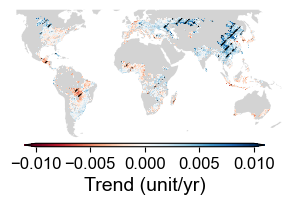

...

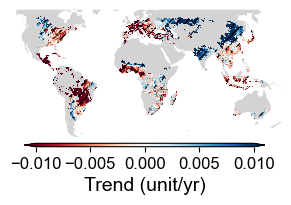

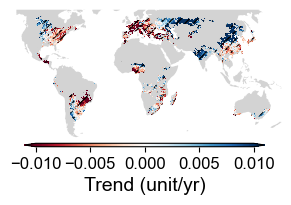

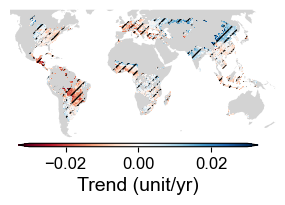

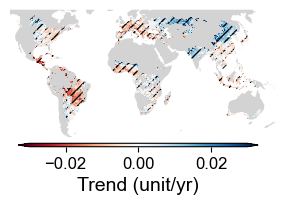

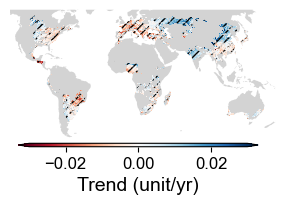

In [53]:
for exp in exps:
    for ssp in ssps:
        if ssp!='ssp585':
            vv=0.01
        else:
            vv=0.03
        if exp =='2015co2' and ssp=='historical':
            continue
        for crop in crops: 
            plot_trend(result_dict2[exp][ssp][crop]['ssi'].sen_slope, result_dict2[exp][ssp][crop]['ssi'].p_value,vv,-vv,'RdBu', f'{exp}_{ssp}_{crop}', rf'D:\AAUDE\paper\paper8\figs\trend\{exp}_{ssp}_{crop}_ssi.pdf')

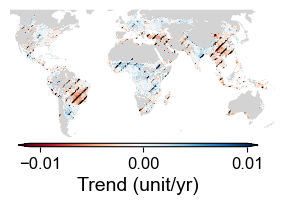

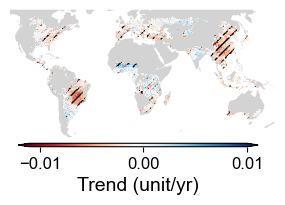

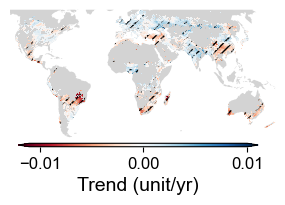

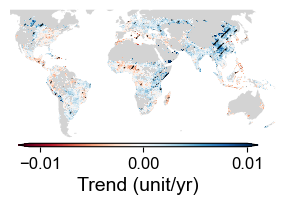

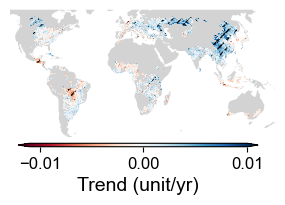

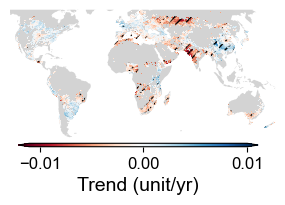

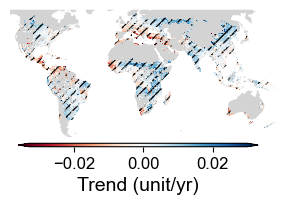

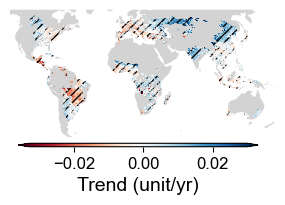

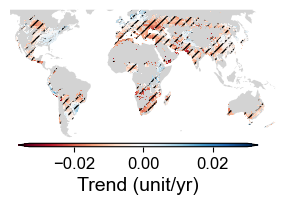

In [15]:
# for exp in exps:
exp='default'
for ssp in ssps:
    if ssp!='ssp585':
        vv=0.01
    else:
        vv=0.03
    if exp =='2015co2' and ssp=='historical':
        continue
    for crop in crops: 
        plot_trend(result_dict2[exp][ssp][crop]['spei'].sen_slope, result_dict2[exp][ssp][crop]['spei'].p_value,vv,-vv,'RdBu', f'{exp}_{ssp}_{crop}', rf'D:\AAUDE\paper\paper8\figs\trend\{exp}_{ssp}_{crop}_spei.pdf')

In [37]:
import xarray as xr
from os.path import join
import numpy as np
# 定义所有需要遍历的维度
ssps = ['historical', 'ssp126', 'ssp585']
crops = ['mai', 'soy', 'whe']
drought_vars = ['ssi', 'spei']
exps=['default','2015co2']
# var='ssi'
result_dict1 = {
    exp:{ssp: {
            crop: {} for crop in crops
    } for ssp in ssps} for exp in exps
}
def change(data,yied,ssp):
    data = data[1:].rename({'year': 'time'})
    # if ssp == 'historical':
    data['time']=yied.time.values
    return data.where(np.isfinite(data))

# for exp in exps:
for ssp in ssps:
    if exp =='2015co2' and ssp=='historical':
        continue
    for crop in crops:
        # 特殊处理小麦（合并冬小麦和春小麦）
        if crop == 'whe':
            # try:
                fp = r'D:\AAUDE\paper\paper8\data\trend'
                area_path = join(r'D:\AAUDE\paper\paper8\data\area', f'spam2020_v1r0_global_H_wwh_R.nc')
                area_wwh = xr.open_dataset(area_path)[list(xr.open_dataset(area_path).data_vars)[0]]
                area_path = join(r'D:\AAUDE\paper\paper8\data\area', f'spam2020_v1r0_global_H_swh_R.nc')
                area_swh = xr.open_dataset(area_path)[list(xr.open_dataset(area_path).data_vars)[0]]
                ssi_data_wwh = xr.open_dataset(rf'D:\AAUDE\paper\paper8\data\trend\coff_ssi_to_spei_wwh_{ssp}.nc')
                ssi_data_swh =xr.open_dataset(rf'D:\AAUDE\paper\paper8\data\trend\coff_ssi_to_spei_swh_{ssp}.nc')
                ssi=ssi_data_wwh.where(area_wwh>0).fillna(0)+ssi_data_swh.where(area_swh>0).fillna(0)

                result_dict1[exp][ssp][crop]['corr'] = ssi.where(ssi!=0)
                result_dict1[exp][ssp][crop]['corr'] = ssi.where(ssi!=0)

            # except FileNotFoundError:
            #     print(f"Warning: 缺少小麦数据文件 for {var}-{ssp}")
            #     continue
        else:
            # try:
            fp = r'D:\AAUDE\paper\paper8\data\trend'
            area_path = join(r'D:\AAUDE\paper\paper8\data\area', f'spam2020_v1r0_global_H_{crop}_R.nc')
            area = xr.open_dataset(area_path)[list(xr.open_dataset(area_path).data_vars)[0]]
            corr = xr.open_dataset(rf'D:\AAUDE\paper\paper8\data\trend\coff_ssi_to_spei_{crop}_{ssp}.nc')


            result_dict1[exp][ssp][crop]['corr'] = corr.where(area>0)
            result_dict1[exp][ssp][crop]['p_value'] = corr.where(area>0)


historical mai 0.7114327519448396


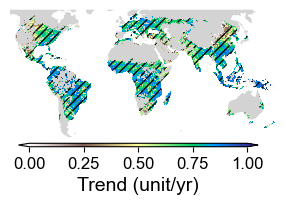

historical soy 0.7483367666732896


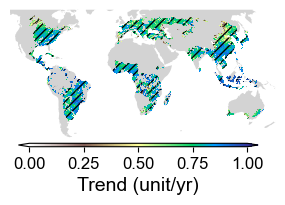

historical whe 0.6463200422212845


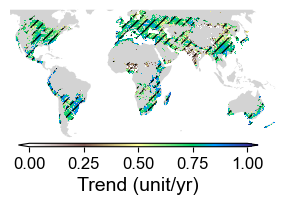

ssp126 mai 0.6906129526598942


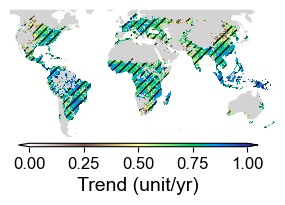

ssp126 soy 0.7120922823264106


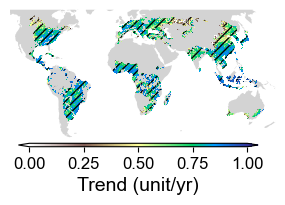

ssp126 whe 0.6172126232021085


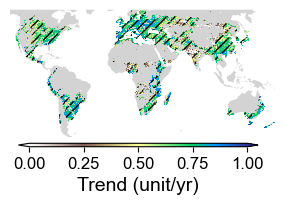

ssp585 mai 0.5683266691817753


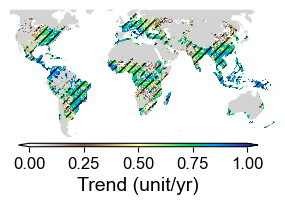

ssp585 soy 0.5645659498901346


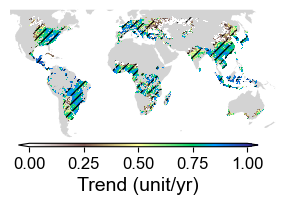

ssp585 whe 0.4451598508276551


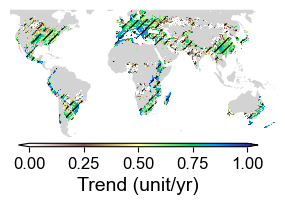

In [55]:
# for exp in exps:
exp='default'
for ssp in ssps:
    for crop in crops: 
        print(ssp,crop,result_dict1[exp][ssp][crop]['corr'].corr.mean().values)
        plot_trend(result_dict1[exp][ssp][crop]['corr'].corr, result_dict1[exp][ssp][crop]['corr'].p_value,1,0,'terrain_r', f'{exp}_{ssp}_{crop}', rf'D:\AAUDE\paper\paper8\figs\trend\corr_{exp}_{ssp}_{crop}_spei.pdf')